# `Market-Mix-Modelling: Budget_Optimization`

#### Problem Statement
### Background  - Business Understanding
*ElecKart is an e-commerce firm based out of Ontario, Canada specialising in electronic products. Over the last year, they had spent a significant amount of money on marketing. Occasionally, they had also offered big-ticket promotions (similar to the Big Billion Day). They are about to create a marketing budget for the next year, which includes spending on commercials, online campaigns, and pricing & promotion strategies. The CFO feels that the money spent over the last 12 months on marketing was not sufficiently impactful, and, that they can either cut on the budget or reallocate it optimally across marketing levers to improve the revenue response.*

 

*Imagine that you are a part of the marketing team working on budget optimisation. You need to develop a market mix model to observe the actual impact of different marketing variables over the last year. Using your understanding of the model, you have to recommend the optimal budget allocation for different marketing levers for the next year.*
 

#### Data Understanding
*You have to use the data from July 2015 to June 2016. The data consists of the following types of information:*

 

#### Order level data

FSN ID: The unique identification of each SKU

Order Date: Date on which the order was placed

Order ID: The unique identification number of each order

Order item ID: Suppose you order 2 different products under the same order, it generates 2 different order Item IDs under the same order ID; orders are tracked by the Order Item ID.

GMV: Gross Merchandise Value or Revenue

Units: Number of units of the specific product sold

Order payment type: How the order was paid – prepaid or cash on delivery

SLA: Number of days it typically takes to deliver the product

Cust id: Unique identification of a customer

Product MRP: Maximum retail price of the product

Product procurement SLA: Time typically taken to procure the product

Apart from this, the following information is also available:

Monthly spend on various advertising channels

Days when there was any special sale

Monthly NPS score – this may work as a proxy to ‘voice of the customer’

Stock Index of the company on a monthly basis 

You can find additional product details from this link.

 

#### Data Preparation
*You have to create market mix models for three product subcategories  - camera accessory, home audio and gaming accessory. Also, the models have to be built at a weekly level for each of the sub-categories.*

 

#### Feature Engineering
*As the E-commerce company is situated in the Ontario region. Here, we will include its climate data to analyse if it has any effect on the revenue. Create as many features as possible with the available data. Macro-economic data like climatic information on a daily basis can be extracted from the link.*

*Create separate columns if Pay date (if 1st or 15th of the month) and holidays by creating a flag as a 0 or 1. For eg. if Holiday is there, the value will be 1.*

 

#### Exploratory Data Analysis
*Perform Univariates, Bivariates, Correlation, Cross-tabs and visualizations on the pre-analytical dataset. Obtain insights and shortlist variables for modelling. Create the KPIs as required for modelling and write appropriate comments for choosing those KPIs.*

 

#### Modelling
*Build basic, logarithmic and multiplicative models or any other model that are possible with the available dataset. Analyse the impact of various attributes on the target variable through appropriate metrics.*




# Step 1: Importing import packages

In [1]:
# import libraries
import pandas as pd
import numpy as np

# Pandas Settings
# pd.options.display.float_format = '{:.1f}'.format
pd.set_option('display.max_rows', 40000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib

# Miscellaneous imports
from datetime import datetime
from scipy.stats import norm
import re


# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Step 2: Reading Data

##### Now We are Reading the main data file - ConsumerElectronics.csv into a dataframe

In [2]:
main_df = pd.read_csv('ConsumerElectronics.csv')

main_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


##### Understanding some attributes

SKU => Stock Keeping Unit

deliverybdays => days to get item or order from warehouse for shipping

deliverycdays => days to deliver item to customer

##### Now We are Reading the product list excel data file into a dataframe

In [3]:
product_list = pd.read_excel('Media data and other information.xlsx', sheet_name='Product List')

product_list.columns.values[1]='product_analytic_vertical'

product_list.drop(product_list.columns[0], axis=1, inplace = True)

product_list.head()

,product_analytic_vertical,Unnamed: 2,Unnamed: 3
0,NaN,Frequency,Percent
1,\N,5828,0.353464
2,AmplifierReceiver,4056,0.245994
3,AudioMP3Player,112892,6.84682
4,Binoculars,14599,0.885419


##### Now We are Reading the Media Investment excel data file into a dataframe

In [4]:
media_investment = pd.read_excel('Media data and other information.xlsx', sheet_name='Media Investment', skiprows=2)

media_investment.drop(media_investment.columns[0], axis=1, inplace = True)

media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


##### Now We are Reading the Sale Calendar excel data file into a dataframe

In [5]:
sale_calendar = pd.read_excel('Media data and other information.xlsx', sheet_name='Special Sale Calendar', \
                              skiprows=1, skipfooter=2)

sale_calendar.drop(sale_calendar.columns[0], axis=1, inplace = True)

sale_calendar.iloc[1:6, 0] = sale_calendar.iloc[0, 0]
sale_calendar.iloc[7:, 0] = sale_calendar.iloc[6, 0]

sale_calendar

,Unnamed: 1,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(17-15th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


##### Now We are Reading the net_promoter_score excel file into a dataframe

In [6]:
net_promoter_score = pd.read_excel('Media data and other information.xlsx', sheet_name='Monthly NPS Score', \
                              skiprows=1)

net_promoter_score.columns.values[0]='score'

net_promoter_score

,score,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


##### Now We are Reading the product details word file into a dataframe 

In [7]:
# pip install --pre python-docx
import pandas as pd
import io
import csv
from docx import Document

def read_docx_tables(filename, tab_id=None, **kwargs):
    
    def read_docx_tab(tab, **kwargs):
        vf = io.StringIO()
        writer = csv.writer(vf)
        for row in tab.rows:
            writer.writerow(cell.text for cell in row.cells)
        vf.seek(0)
        return pd.read_csv(vf, **kwargs)

    doc = Document(filename)
    if tab_id is None:
        return [read_docx_tab(tab, **kwargs) for tab in doc.tables]
    else:
        try:
            return read_docx_tab(doc.tables[tab_id], **kwargs)
        except IndexError:
            print('Error: specified [tab_id]: {}  does not exist.'.format(tab_id))
            raise

dfs = read_docx_tables('Product Details.docx')

dfs[0]

,super_category,category,sub_category,vertical
0,CE,Camera,Camera,Camcorders
1,CE,Camera,Camera,DSLR
2,CE,Camera,Camera,Instant Cameras
3,CE,Camera,Camera,Point & Shoot
4,CE,Camera,Camera,SportsAndAction
5,CE,CameraAccessory,CameraAccessory,Binoculars
6,CE,CameraAccessory,CameraAccessory,CameraAccessory
7,CE,CameraAccessory,CameraAccessory,CameraBag
8,CE,CameraAccessory,CameraAccessory,CameraBattery
9,CE,CameraAccessory,CameraAccessory,CameraBatteryCharger


In [8]:
# Dropping the extra row(s) and column(s)

product_details = pd.DataFrame(dfs[0])

product_details.drop(product_details.columns[0], axis=1, inplace = True)

product_details.head()

,category,sub_category,vertical
0,Camera,Camera,Camcorders
1,Camera,Camera,DSLR
2,Camera,Camera,Instant Cameras
3,Camera,Camera,Point & Shoot
4,Camera,Camera,SportsAndAction


# Step 3: Cleaning Data

In [9]:
main_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [10]:
main_df.dtypes

fsn_id                              object
order_date                          object
Year                                 int64
Month                                int64
order_id                           float64
order_item_id                      float64
gmv                                 object
units                                int64
deliverybdays                       object
deliverycdays                       object
s1_fact.order_payment_type          object
sla                                  int64
cust_id                             object
pincode                             object
product_analytic_super_category     object
product_analytic_category           object
product_analytic_sub_category       object
product_analytic_vertical           object
product_mrp                          int64
product_procurement_sla              int64
dtype: object

## Now We are Correcting the Data Types

In [11]:
# String to datetime

main_df['order_date'] =  pd.to_datetime(main_df['order_date'], format='%Y-%m-%d %H:%M:%S')

In [12]:
# Int to string data type

main_df[['order_id','order_item_id']] = main_df[['order_id','order_item_id']].astype(object)

In [13]:
# Int to string data type

main_df[['Year','Month']] = main_df[['Year','Month']].astype(str)

#####  Assuming "\N" value in deliverybdays & deliverycdays is equal to 0, will impute the nulls created by it with 0

In [14]:
main_df['deliverybdays'] = pd.to_numeric(main_df['deliverybdays'], errors='coerce')
main_df['deliverybdays'].fillna(value=0, inplace=True)

main_df['deliverycdays'] = pd.to_numeric(main_df['deliverycdays'], errors='coerce')
main_df['deliverycdays'].fillna(value=0, inplace=True)

In [15]:
# String to int data type

main_df['gmv'] = pd.to_numeric(main_df['gmv'], errors='coerce')

In [16]:
main_df.dtypes

fsn_id                                     object
order_date                         datetime64[ns]
Year                                       object
Month                                      object
order_id                                   object
order_item_id                              object
gmv                                       float64
units                                       int64
deliverybdays                             float64
deliverycdays                             float64
s1_fact.order_payment_type                 object
sla                                         int64
cust_id                                    object
pincode                                    object
product_analytic_super_category            object
product_analytic_category                  object
product_analytic_sub_category              object
product_analytic_vertical                  object
product_mrp                                 int64
product_procurement_sla                     int64


## Unique Values

In [17]:
# Unique value frequencies

unique_values = pd.DataFrame(main_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)

unique_values['dtype'] = pd.DataFrame(main_df.dtypes)

unique_values

,Unique Value Count,dtype
product_analytic_super_category,1,object
Year,2,object
s1_fact.order_payment_type,2,object
product_analytic_category,5,object
Month,12,object
product_analytic_sub_category,14,object
product_procurement_sla,17,int64
units,27,int64
sla,60,int64
product_analytic_vertical,74,object


In [18]:
initial_shape = main_df.shape
initial_shape

(1648824, 20)

## Fixing the Invalid Values

### Treating incorrect GMV values w.r.t product_mrp * units

In [19]:
# Instances where GMV values are greater than MRP * units which is incorrect

print(main_df.loc[main_df['product_mrp'] * main_df['units'] < main_df['gmv']].shape[0])

print(round(100*(main_df.loc[main_df['product_mrp'] * main_df['units'] < main_df['gmv']].shape[0] / main_df.shape[0]), 2))

38569
2.34


There are `38569` records (`2.34%`) in the dataframe where the GMV value is > the MRP * units.

##### We will be imputing the faulty mrp values with `gmv/units` 

In [20]:
# update column based on another column
main_df.product_mrp = np.where(main_df['product_mrp'] < main_df['gmv'] / main_df['units'], \
                                   main_df['gmv'] / main_df['units'], main_df['product_mrp'])

main_df.shape

(1648824, 20)

Reinspecting instances where GMV value is > than the MRP * units.

In [21]:
# Instances where GMV values are > than MRP * units which is incorrect

print(main_df.loc[main_df['product_mrp'] * main_df['units'] < main_df['gmv']].shape[0])

print(round(100*(main_df.loc[main_df['product_mrp'] * main_df['units'] < main_df['gmv']].shape[0] / main_df.shape[0]), 2))

0
0.0


*All erroneous instances has removed*

### Now Treating the GMV values less than `0`

In [22]:
print(main_df.loc[main_df['gmv'] < 0].shape[0])

print(round(100*(main_df.loc[main_df['gmv'] < 0].shape[0]/main_df.shape[0]), 2))

0
0.0


### Now Treating the MRP values less than or equal to `0`

In [23]:
print(main_df.loc[main_df['product_mrp'] < 0].shape[0])

print(round(100*(main_df.loc[main_df['product_mrp'] < 0].shape[0]/main_df.shape[0]), 2))

0
0.0


### Now Treating the Units values less than or equal to `0`

In [24]:
print(main_df.loc[main_df['units'] <= 0].shape[0])

print(round(100*(main_df.loc[main_df['units'] <= 0].shape[0]/main_df.shape[0]), 2))

0
0.0


*No erroneous rows are left in the MRP, GMV or Units columns*

### Now Handling Negative values for `deliverybdays` & `deliverycdays`

In [25]:
print(main_df.loc[main_df['deliverybdays'] < 0].shape[0])
print(round(100*(main_df.loc[main_df['deliverybdays'] < 0].shape[0]/main_df.shape[0]),4))

print(main_df.loc[main_df['deliverycdays'] < 0].shape[0])
print(round(100*(main_df.loc[main_df['deliverycdays'] < 0].shape[0]/main_df.shape[0]),4))

38
0.0023
39
0.0024


 - So, There are `38` records which is (`0.0023%`) in the dataframe with the negative values for deliverybdays.
 - There are `39` records which is (`0.0024%`) in the dataframe with the negative values for deliverycdays.
 
So Now We will be dropping such rows which is not possible for a product to have negative values for Dispatch Delay from Warehouse to customer.

In [26]:
main_df = main_df.loc[(main_df['deliverybdays'] >= 0) & (main_df['deliverycdays'] >= 0)]

main_df.reset_index(drop=True, inplace=True)

In [27]:
main_df.shape

(1648785, 20)

### Now Handling the Negative values for `product_procurement_sla`

In [28]:
print(main_df.loc[main_df['product_procurement_sla'] < 0].shape[0])

print(round(100*(main_df.loc[main_df['product_procurement_sla'] < 0].shape[0]/main_df.shape[0]),4))

75986
4.6086


 - There are `75986` records which is (`4.6086%`) in the dataframe with negative values for product_procurement_sla.
 
We will be dropping such rows since it is not possible for a product to have negative values for time typically taken to procure it.

In [29]:
main_df = main_df.loc[(main_df['product_procurement_sla'] >= 0)]

main_df.reset_index(drop=True, inplace=True)

In [30]:
main_df.shape

(1572799, 20)

### Now we are Handling large values for product_procurement_sla

In [31]:
main_df[['product_procurement_sla']].describe().T

,count,mean,std,min,25%,50%,75%,max
product_procurement_sla,1572799.0,5.712887,54.724168,0.0,2.0,2.0,3.0,1000.0


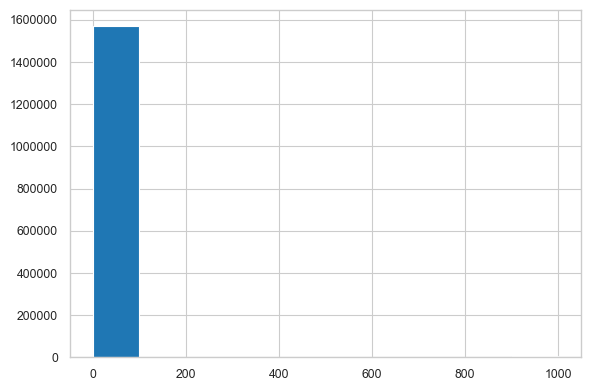

In [32]:
#altering the figure size to make it more horizontal.
plt.figure(figsize=(6, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("whitegrid") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

main_df.product_procurement_sla.hist()

# Automatically adjust subplot params
plt.tight_layout()

# display the plot
plt.show()

In [33]:
main_df.product_procurement_sla.value_counts()

2       528406
1       308504
3       303349
5       222097
4       120190
0        42459
6        18559
7        11746
15        6184
14        5281
1000      4745
13         526
8          523
9           97
10          73
12          60
Name: product_procurement_sla, dtype: int64

In [34]:
print(main_df.loc[main_df['product_procurement_sla'] >= 1000].shape[0])

print(round(100*(main_df.loc[main_df['product_procurement_sla'] >= 1000].shape[0]/main_df.shape[0]),4))

4745
0.3017


 - There are `4745` records which is the (`0.3%`) in the dataframe with unusually large values of product_procurement_sla.
 
So, We will be drop such rows since it is not possible for a product to have product_procurement_sla more than 1000

In [35]:
#Retaining rows where the sla is less than 1000

main_df = main_df.loc[(main_df['product_procurement_sla'] < 1000)]
main_df.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.4193e+15,3.4193e+15,6400.0,1,0.0,0.0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.42083e+15,1.42083e+15,6900.0,1,0.0,0.0,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.42191e+15,2.42191e+15,1990.0,1,0.0,0.0,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.41659e+15,4.41659e+15,1690.0,1,0.0,0.0,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.41953e+15,4.41953e+15,1618.0,1,0.0,0.0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3


In [36]:
main_df.shape

(1568054, 20)

In [37]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1568054 entries, 0 to 1572798
Data columns (total 20 columns):
fsn_id                             1568054 non-null object
order_date                         1568054 non-null datetime64[ns]
Year                               1568054 non-null object
Month                              1568054 non-null object
order_id                           1568054 non-null object
order_item_id                      1568054 non-null object
gmv                                1563535 non-null float64
units                              1568054 non-null int64
deliverybdays                      1568054 non-null float64
deliverycdays                      1568054 non-null float64
s1_fact.order_payment_type         1568054 non-null object
sla                                1568054 non-null int64
cust_id                            1568054 non-null object
pincode                            1568054 non-null object
product_analytic_super_category    1568054 non-null 

## De-Duplicate Data

##### Making the all string columns lower case

In [38]:
cat_cols = [cname for cname in main_df.columns if main_df[cname].dtype == "object"]

cat_cols

['fsn_id',
 'Year',
 'Month',
 'order_id',
 'order_item_id',
 's1_fact.order_payment_type',
 'cust_id',
 'pincode',
 'product_analytic_super_category',
 'product_analytic_category',
 'product_analytic_sub_category',
 'product_analytic_vertical']

In [39]:
# Filtering the string columns

cat_cols = ['fsn_id',
 's1_fact.order_payment_type',
 'product_analytic_super_category',
 'product_analytic_category',
 'product_analytic_sub_category',
 'product_analytic_vertical']

for col in cat_cols:
    main_df[col] = main_df[col].str.lower()

##### Spelling check 

In [40]:
cat_cols = [cname for cname in main_df.columns if main_df[cname].dtype == "object"]

main_df[cat_cols].describe()

,fsn_id,Year,Month,order_id,order_item_id,s1_fact.order_payment_type,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical
count,1568054,1568054,1568054,1.568054e+06,1.568054e+06,1568054,1568054,1.568054e+06,1568054,1568054,1568054,1568054
unique,20620,2,12,1.430145e+06,1.410408e+06,2,1199714,1.288000e+04,1,5,14,73
top,seldxmc3jnmtqmgv,2016,9,1.560047e+15,3.000373e+17,cod,,-9.031043e+18,ce,entertainmentsmall,speaker,mobilespeaker
freq,17859,835309,198112,3.400000e+01,3.800000e+01,1130205,4519,7.519000e+03,1568054,897157,501816,249170


In [41]:
# Checking only those columns whose cardinality is less

selected_cat_cols = ['s1_fact.order_payment_type', 'product_analytic_super_category', 'product_analytic_category', 'product_analytic_sub_category', 'product_analytic_vertical']

for col in selected_cat_cols:
    print('\n################################')
    print('Unique values of ' + str(col))
    print('################################')
    print(pd.Series(main_df[col].unique()).sort_values(ascending=False))


################################
Unique values of s1_fact.order_payment_type
################################
1    prepaid
0        cod
dtype: object

################################
Unique values of product_analytic_super_category
################################
0    ce
dtype: object

################################
Unique values of product_analytic_category
################################
1        gaminghardware
3             gamecddvd
2    entertainmentsmall
0       cameraaccessory
4                camera
dtype: object

################################
Unique values of product_analytic_sub_category
################################
12           tvvideosmall
2                 speaker
10            hometheatre
3               homeaudio
9           gamingconsole
1         gamingaccessory
13    gamemembershipcards
7                    game
4           camerastorage
0         cameraaccessory
8                  camera
6          audiomp3player
11         audioaccessory
5       amplifi

There are no duplicates because of spelling mistakes

##### Now Droping duplicate rows

In [42]:
main_df.shape

(1568054, 20)

In [43]:
print(main_df.duplicated().value_counts()[1])

print(round(100*(main_df.duplicated().value_counts()[1]/main_df.shape[0]),4))

99283
6.3316


##### Around 99283 which are (6.33%) rows have duplicates. So We are going to droping them.

In [44]:
main_df.drop_duplicates(keep='first', inplace=True)
main_df.shape

(1468771, 20)

In [45]:
main_df.duplicated().value_counts()

False    1468771
dtype: int64

*So Now There No more duplicates*

## So Now Treating Nulls

In [46]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(main_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(main_df.isnull().sum()/main_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
gmv,3705,0.25
product_procurement_sla,0,0.00
product_mrp,0,0.00
order_date,0,0.00
Year,0,0.00


######  *There are a few null values in the gmv column.*

And there are some Whitespaces present in sum of the columns in the dataframe.

Let us try to first convert these white spaces to Nan's and then we will treat them accordingly.

In [47]:
main_df.replace(' ', np.nan, inplace = True)

### Now Trying to find null percentage from columns

In [48]:
total = pd.DataFrame(main_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(main_df.isnull().sum()/main_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])
pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
pincode,3705,0.25
cust_id,3705,0.25
gmv,3705,0.25
product_procurement_sla,0,0.00
deliverybdays,0,0.00


### We will  remove rows where a particular column has high missing values

In [49]:
main_df = main_df[~pd.isnull(main_df['gmv'])]
org_shape = main_df.shape
org_shape

(1465066, 20)

### Checking for total count and percentage of null values in all columns of the dataframe.

In [50]:
total = pd.DataFrame(main_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(main_df.isnull().sum()/main_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])
pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
product_procurement_sla,0,0.0
product_mrp,0,0.0
order_date,0,0.0
Year,0,0.0
Month,0,0.0


*So Now Finally no Null rows exist in the dataframe*

### Selecting one Yr Data from July 2015 to June 2016


*Changing the datatype 'order_date' to `datetime64`*

In [51]:
main_df.dtypes

fsn_id                                     object
order_date                         datetime64[ns]
Year                                       object
Month                                      object
order_id                                  float64
order_item_id                             float64
gmv                                       float64
units                                       int64
deliverybdays                             float64
deliverycdays                             float64
s1_fact.order_payment_type                 object
sla                                         int64
cust_id                                    object
pincode                                    object
product_analytic_super_category            object
product_analytic_category                  object
product_analytic_sub_category              object
product_analytic_vertical                  object
product_mrp                               float64
product_procurement_sla                     int64


*Identifying the data outside our analysis period - `01-Jul-2015 to 30-Jun-2016`*

In [52]:
main_df.loc[(main_df['order_date'].dt.floor("d") < '2015-07-01') | (main_df['order_date'].dt.floor("d") >= '2016-07-01')].shape

(592, 20)

*So,There are 592 records that comes outside our analysis period - `01-Jul-2015 to 30-Jun-2016`*

We will drop these records.

In [53]:
main_df = main_df.loc[(main_df['order_date'].dt.floor("d") >= '2015-07-01') & (main_df['order_date'].dt.floor("d") < '2016-07-01')]
main_df.shape

(1464474, 20)

In [54]:
Max = pd.DataFrame(main_df[['order_date']].max().rename('Max'))
Min = pd.DataFrame(main_df[['order_date']].min().rename('Min'))

pd.concat([Min, Max], axis=1)

,Min,Max
order_date,2015-07-01 00:36:11,2016-06-30 23:59:26


## Generating Week Column

In [55]:
# Now we are creating a new column into a specific position in a DataFrame
loc_index = main_df.columns.get_loc('Month') + 1
main_df.insert(loc=loc_index,column='Week',value=main_df['order_date'].dt.strftime("%V"))

main_df['Year'] = main_df['Year'].astype('str')
main_df.head()

,fsn_id,order_date,Year,Month,Week,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,acccx3s58g7b5f6p,2015-10-17 15:11:54,2015,10,42,3.419301e+15,3.419301e+15,6400.0,1,0.0,0.0,cod,5,-1.01299130778588E+018,-7.79175582905735E+018,ce,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
1,acccx3s58g7b5f6p,2015-10-19 10:07:22,2015,10,43,1.420831e+15,1.420831e+15,6900.0,1,0.0,0.0,cod,7,-8.99032457905512E+018,7.33541149097431E+018,ce,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
2,acccx3s5ahmf55fv,2015-10-20 15:45:56,2015,10,43,2.421913e+15,2.421913e+15,1990.0,1,0.0,0.0,cod,10,-1.0404429420466E+018,-7.47768776228657E+018,ce,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
3,acccx3s5ahmf55fv,2015-10-14 12:05:15,2015,10,42,4.416592e+15,4.416592e+15,1690.0,1,0.0,0.0,prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,ce,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
4,acccx3s5ahmf55fv,2015-10-17 21:25:03,2015,10,42,4.419525e+15,4.419525e+15,1618.0,1,0.0,0.0,prepaid,6,2.8945572083453E+018,5.34735360997242E+017,ce,cameraaccessory,cameraaccessory,cameratripod,2099.0,3


In [56]:
# Checking the discrepancies combinations 

main_df.groupby(['Year', 'Week']).agg({'Month':"count"}).reset_index(drop=False)

,Year,Week,Month
0,2015,27,284
1,2015,28,22168
2,2015,29,22480
3,2015,30,23461
4,2015,31,15256
5,2015,32,26
6,2015,33,11
7,2015,34,8
8,2015,35,12
9,2015,36,21699


In [57]:
main_df.loc[(main_df.Year == '2016') & (main_df.Week == '53'), 'Year'] = '2015'

main_df.loc[(main_df.Year == '2015') & (main_df.Week == '53'), 'Month'] = 12

main_df.drop(main_df[main_df['Week'] == '27'].index, inplace = True)

In [58]:
main_df.groupby(['Year', 'Week']).agg({'Month':"count"}).reset_index(drop=False)

,Year,Week,Month
0,2015,28,22168
1,2015,29,22480
2,2015,30,23461
3,2015,31,15256
4,2015,32,26
5,2015,33,11
6,2015,34,8
7,2015,35,12
8,2015,36,21699
9,2015,37,22862


## Drop Insignificant Columns

In [59]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1464190 entries, 0 to 1473147
Data columns (total 21 columns):
fsn_id                             1464190 non-null object
order_date                         1464190 non-null datetime64[ns]
Year                               1464190 non-null object
Month                              1464190 non-null object
Week                               1464190 non-null object
order_id                           1464190 non-null float64
order_item_id                      1464190 non-null float64
gmv                                1464190 non-null float64
units                              1464190 non-null int64
deliverybdays                      1464190 non-null float64
deliverycdays                      1464190 non-null float64
s1_fact.order_payment_type         1464190 non-null object
sla                                1464190 non-null int64
cust_id                            1464190 non-null object
pincode                            1464190 non-nul

In [60]:
# Dropping Columns with Single Value or all Different Values

count_df = pd.DataFrame(main_df.apply(lambda x: len(x.value_counts()), axis=0), columns=['Count'])

drop_columns = list(count_df.loc[(count_df['Count']==1) | (count_df['Count']==len(main_df.index))].index)

print('Dropping these columns => {}'.format(drop_columns))

main_df.drop(drop_columns, axis=1, inplace=True)

Dropping these columns => ['product_analytic_super_category']


In [61]:
# Dropping Columns which are insignificant to the analysis

drop_columns = ['fsn_id', 'order_id', 'order_item_id', 'cust_id']

main_df.drop(drop_columns, axis=1, inplace=True)

## Feature Engineering

In [62]:
main_df.head()

,order_date,Year,Month,Week,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,42,6400.0,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
3,2015-10-14 12:05:15,2015,10,42,1690.0,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
4,2015-10-17 21:25:03,2015,10,42,1618.0,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3


### Creating column `List Price`

*List Price = GMV/Units*

In [63]:
# Creating a new column into a specific position in a DataFrame
loc_index = main_df.columns.get_loc('gmv') + 1
main_df.insert(loc=loc_index,column='list_price',value = main_df['gmv'] / main_df['units'])
main_df.head()

,order_date,Year,Month,Week,gmv,list_price,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3


*Displaying the column values for a few orders when units > 1*

In [64]:
main_df.loc[main_df['units'] != 1][['gmv','list_price','product_mrp','units']].head()

,gmv,list_price,product_mrp,units
559,13560.0,6780.0,8950.0,2
667,940.0,470.0,1545.0,2
669,940.0,470.0,1545.0,2
671,940.0,470.0,1545.0,2
674,940.0,470.0,1545.0,2


### Creating a Payday Flag (+- 1 for salary days) 

*If it is nearer to the salary day in Ontario(1st and 15th of every month), we flag the column as 1, else as 0*

In [65]:
main_df['payday_flag'] = main_df['order_date'].apply(lambda x:1 if x.strftime('%d') in ('14','15','16','30','31','1','2') else 0)
main_df.head()

,order_date,Year,Month,Week,gmv,list_price,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0


### Creating an Occassion Flag 


The following table lists all the holidays/occassions from 1st July, 2015 to 30th June, 2016** Reference link https://www.statutoryholidays.com/

|Occassion|Day|
|---------|---|
|Canada Day	|July 1, 2015|
|Civic Holiday|	August 3, 2015|
|Labour Day	|September 7, 2015 |
|Thanksgiving|	October 12, 2015|
|Halloween	|October 31, 2015|
|Remembrance Day|	November 11, 2015|
|Christmas Day	|December 25, 2015|
|Boxing Day	|December 26, 2015|
|New Year's Day	|January 1, 2016|
|Islander Day	|February 15, 2016|
|Louis Riel Day	|February 15, 2016|
|Heritage Day	|February 15, 2016|
|Family Day	|February 15, 2016|
|Valentine's Day	|February 14, 2016|
|Leap Day	|February 29, 2016|
|St. Patrick's Day	|March 17, 2016|
|Good Friday	|March 25, 2016|
|Easter Monday	|March 28, 2016|
|Mother's Day	|May 8, 2016|
|Victoria Day	|May 23, 2016|
|Father's Day	|June 19, 2016|
|Aboriginal Day	|June 21, 2016|
|St. Jean Baptiste Day	|June 24, 2016|



In [66]:
def holidayflg(ord_date):
    if ord_date.strftime('%Y') == 2015:
        if ord_date.strftime('%m') == '07' and ord_date.strftime('%d') == '01':
            return 1
        elif ord_date.strftime('%m') == '08' and ord_date.strftime('%d') == '03':
            return 1
        elif ord_date.strftime('%m') == '09' and ord_date.strftime('%d') == '07':
            return 1
        elif ord_date.strftime('%m') == '10' and ord_date.strftime('%d') == '12':
            return 1
        elif ord_date.strftime('%m') == '10' and ord_date.strftime('%d') == '31':
            return 1
        elif ord_date.strftime('%m') == '11' and ord_date.strftime('%d') == '11':
            return 1
        elif ord_date.strftime('%m') == '12' and ord_date.strftime('%d') == '25':
            return 1
        elif ord_date.strftime('%m') == '12' and ord_date.strftime('%d') == '26':
            return 1
        else:
            return 0
    else:
        if ord_date.strftime('%m') == '01' and ord_date.strftime('%d') == '01':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') == '15':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') == '14':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') =='29':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '17':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '25':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '28':
            return 1
        elif ord_date.strftime('%m') == '05' and ord_date.strftime('%d') == '08':
            return 1
        elif ord_date.strftime('%m') == '05' and ord_date.strftime('%d') == '23':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '19':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '21':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '24':
            return 1
        else:
            return 0

In [67]:
main_df['occassion_flag'] = main_df['order_date'].apply(lambda x:holidayflg(x))
main_df.head()

,order_date,Year,Month,Week,gmv,list_price,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0


### Now Creating a column called Product Type - Luxury / Mass_market



In [68]:
pd.DataFrame(main_df['gmv']).describe(percentiles=[.70,.80,.90]).T

,count,mean,std,min,50%,70%,80%,90%,max
gmv,1464190.0,2483.958105,5622.334895,0.0,790.0,1599.0,2450.0,4300.0,226947.0


In [69]:
main_df['gmv'].quantile(.8)

2450.0

In [70]:
main_df['product_type'] = main_df['gmv'].apply(lambda x:'luxury' if x >= 2450 else 'mass_market')
main_df.head()

,order_date,Year,Month,Week,gmv,list_price,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag,product_type
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0,mass_market
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market


### Calculating Discount % 


In [71]:
# Creating a new column into a specific position in a DataFrame
col_loc = main_df.columns.get_loc('list_price') + 1
main_df.insert(loc=col_loc, column='Discount%', value = \
               round(100*((main_df['product_mrp'] - main_df['list_price']) / main_df['product_mrp']),2))
main_df.head()

,order_date,Year,Month,Week,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag,product_type
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,10.99,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,4.03,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,5.19,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,19.49,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0,mass_market
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,22.92,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market


### Statistical Info

##### Numeric columns

In [72]:
main_df.describe().T

,count,mean,std,min,25%,50%,75%,max
gmv,1464190.0,2483.958105,5622.334895,0.0,349.00,790.00,1999.00,226947.0
list_price,1464190.0,2450.951701,5541.148673,0.0,349.00,775.00,1999.00,226947.0
Discount%,1464190.0,44.547432,22.777238,0.0,27.94,45.05,61.18,100.0
units,1464190.0,1.021544,0.255668,1.0,1.00,1.00,1.00,50.0
deliverybdays,1464190.0,1.032111,2.477507,0.0,0.00,0.00,0.00,238.0
deliverycdays,1464190.0,1.202033,2.884773,0.0,0.00,0.00,0.00,278.0
sla,1464190.0,5.760836,2.993450,0.0,4.00,6.00,7.00,1006.0
product_mrp,1464190.0,4223.001376,8653.348732,49.0,849.00,1699.00,3499.00,299999.0
product_procurement_sla,1464190.0,2.701303,1.786134,0.0,2.00,2.00,3.00,15.0
payday_flag,1464190.0,0.170539,0.376105,0.0,0.00,0.00,0.00,1.0


##### Distribution of the numeric columns

#############
gmv
#############


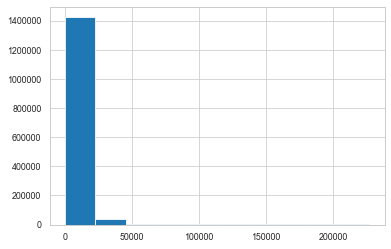

#############
list_price
#############


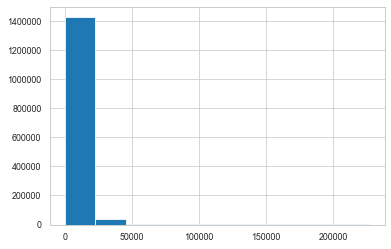

#############
Discount%
#############


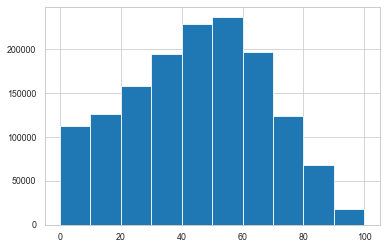

#############
units
#############


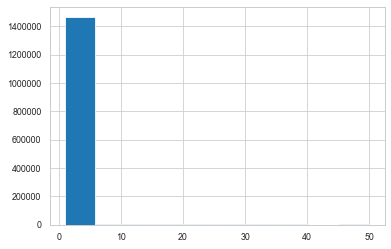

#############
deliverybdays
#############


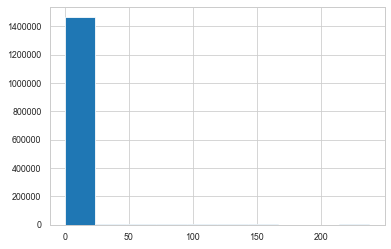

#############
deliverycdays
#############


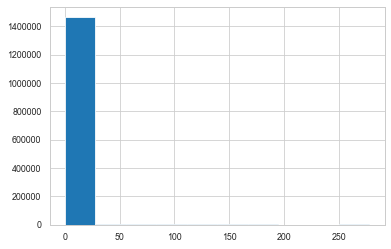

#############
sla
#############


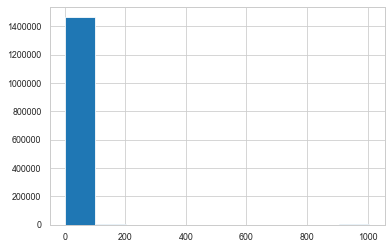

#############
product_mrp
#############


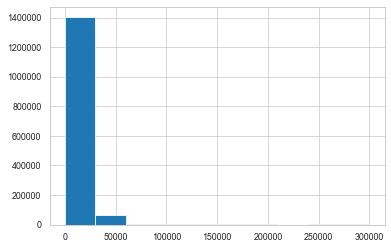

#############
product_procurement_sla
#############


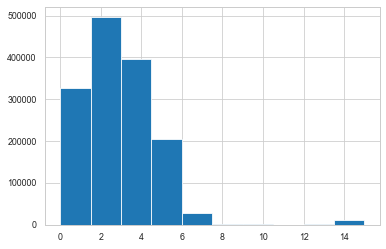

#############
payday_flag
#############


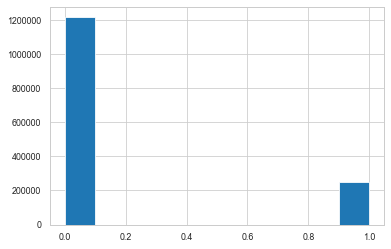

#############
occassion_flag
#############


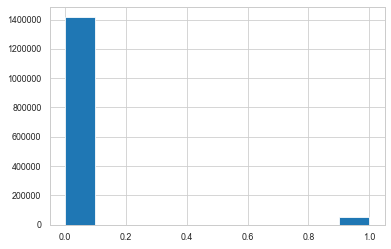

In [73]:
for col in main_df.describe().columns:
    print('#############')
    print(col)
    print('#############')
    main_df[col].hist()
    plt.show()

##### Categorical columns

In [74]:
cat_var = [cname for cname in main_df.columns if 
                                main_df[cname].dtype == "object"]

main_df[cat_var].describe().T

,count,unique,top,freq
Year,1464190,2,2016,821473
Month,1464190,13,10,187636
Week,1464190,52,42,106456
s1_fact.order_payment_type,1464190,2,cod,1053934
pincode,1.46419e+06,12877,-9.03104e+18,7512
product_analytic_category,1464190,5,entertainmentsmall,834380
product_analytic_sub_category,1464190,14,speaker,468310
product_analytic_vertical,1464190,73,mobilespeaker,235677
product_type,1464190,2,mass_market,1171351


## Outlier Treatment

In [75]:
main_df.head()

,order_date,Year,Month,Week,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag,product_type
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,10.99,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,4.03,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,5.19,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,19.49,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0,mass_market
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,22.92,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market


In [76]:
main_df.dtypes

order_date                       datetime64[ns]
Year                                     object
Month                                    object
Week                                     object
gmv                                     float64
list_price                              float64
Discount%                               float64
units                                     int64
deliverybdays                           float64
deliverycdays                           float64
s1_fact.order_payment_type               object
sla                                       int64
pincode                                  object
product_analytic_category                object
product_analytic_sub_category            object
product_analytic_vertical                object
product_mrp                             float64
product_procurement_sla                   int64
payday_flag                               int64
occassion_flag                            int64
product_type                            

In [77]:
# Function to plot the distribution plot of the numeric variable list

numeric_variables=['gmv','list_price','Discount%','deliverybdays','deliverycdays','sla','product_mrp','product_procurement_sla']


#Function to plot the distribution plot of the numeric variable list
def univariate_continuos(var_list):
    plt.figure(figsize=(12,6))
    for var in var_list:
        plt.subplot(2,4,var_list.index(var)+1)
        #plt.boxplot(country[var])
        sns.boxplot(y=var,palette='cubehelix', data=main_df)
    # Automatically adjust subplot params so that the subplotS fits in to the figure area.
    plt.tight_layout()
    # display the plot
    plt.show()

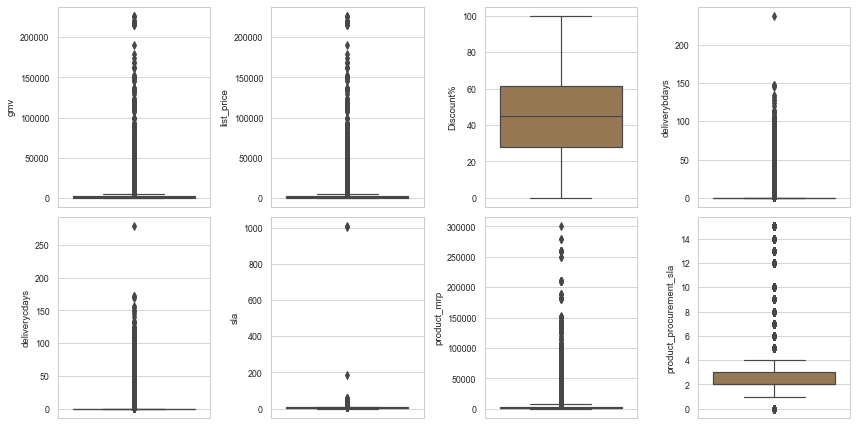

In [78]:
univariate_continuos(numeric_variables)

*It seems to be a lot of outliers in the columns

In [79]:
# Checking outliers 25%,50%,75%,90%,95% and 99%

main_df[numeric_variables].describe(percentiles=[.25,.5,.75,.90,.95,.99]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
gmv,1464190.0,2483.958105,5622.334895,0.0,349.00,790.00,1999.00,4300.00,11170.00,30499.0,226947.0
list_price,1464190.0,2450.951701,5541.148673,0.0,349.00,775.00,1999.00,4299.00,10990.00,29746.0,226947.0
Discount%,1464190.0,44.547432,22.777238,0.0,27.94,45.05,61.18,74.93,81.32,90.4,100.0
deliverybdays,1464190.0,1.032111,2.477507,0.0,0.00,0.00,0.00,5.00,6.00,8.0,238.0
deliverycdays,1464190.0,1.202033,2.884773,0.0,0.00,0.00,0.00,5.00,7.00,10.0,278.0
sla,1464190.0,5.760836,2.993450,0.0,4.00,6.00,7.00,9.00,10.00,13.0,1006.0
product_mrp,1464190.0,4223.001376,8653.348732,49.0,849.00,1699.00,3499.00,7150.00,17995.00,45990.0,299999.0
product_procurement_sla,1464190.0,2.701303,1.786134,0.0,2.00,2.00,3.00,5.00,5.00,7.0,15.0


#### After analyzing the distribution of values of the above attributes of different percentiles, So herewe have come to the following conclusion:

 - `'list_price','mrp' and'gmv', ` values can have occassional outliers owing to the fact that there are rarely some high value sales. These records are less occurring and not at all at unplanned.
 - `'Discount%'` can also be more in case on convinced products. Specifically, a discount percentage of 100% would mena, the product came free with some other product.
 - On ther hand, unusually high values of `'deliverybdays', 'deliverycdays' and 'sla'` seem to be erroneous data. So we will find a way to treat these outlier values so that they do not affect the predictive model while at the same time there will be enough data to build a generalizable model.

In [80]:
main_df[['deliverybdays', 'deliverycdays' ,'sla']].quantile([.95, .99])

,deliverybdays,deliverycdays,sla
0.95,6.0,7.0,10.0
0.99,8.0,10.0,13.0


*Let us assume any observation more than 99 percentile for a variable is considered as an outlier for that variable.*

#### Percentage of Outliers in column deliverybdays

In [81]:
print(round(100*(main_df.loc[main_df['deliverybdays'] > 8.0].shape[0] / main_df.shape[0]),4))

0.8753


#### Percentage of Outliers in column deliverycdays

In [82]:
print(round(100*(main_df.loc[main_df['deliverycdays'] > 10.0].shape[0] / main_df.shape[0]),4))

0.6466


#### Percentage of Outliers in column `sla`

In [83]:
print(round(100*(main_df.loc[main_df['sla'] > 13.0].shape[0] / main_df.shape[0]),4))

0.8393


### No We are capping value above or below a certain percentile:

For the variables - 'SLA', 'deliverybdays', 'deliverybdays', 'gmv', 'product_mrp', 'list_price' where outliers are present, we will CAP these values above 99 percentile to the value corresponding to 99 percentile.

In [84]:

main_df['deliverybdays'][np.abs(main_df['deliverybdays'] > 8.0)]= 8.0
main_df['deliverybdays'][np.abs(main_df['deliverybdays'] > 10.0)]= 10.0
main_df['sla'][np.abs(main_df['sla'] > 13.0)]= 13.0

In [85]:
print(round(100*(main_df.shape[0] / initial_shape[0])))

89


**So here 89% of records has been retained after outlier treatment**

In [86]:
# Checking again outliers at 25%,50%,75%,90%,95% and 99%

main_df.describe(percentiles=[.25,.5,.75,.90,.95,.99]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
gmv,1464190.0,2483.958105,5622.334895,0.0,349.00,790.00,1999.00,4300.00,11170.00,30499.0,226947.0
list_price,1464190.0,2450.951701,5541.148673,0.0,349.00,775.00,1999.00,4299.00,10990.00,29746.0,226947.0
Discount%,1464190.0,44.547432,22.777238,0.0,27.94,45.05,61.18,74.93,81.32,90.4,100.0
units,1464190.0,1.021544,0.255668,1.0,1.00,1.00,1.00,1.00,1.00,2.0,50.0
deliverybdays,1464190.0,0.993999,2.061029,0.0,0.00,0.00,0.00,5.00,6.00,8.0,8.0
deliverycdays,1464190.0,1.202033,2.884773,0.0,0.00,0.00,0.00,5.00,7.00,10.0,278.0
sla,1464190.0,5.736979,2.666819,0.0,4.00,6.00,7.00,9.00,10.00,13.0,13.0
product_mrp,1464190.0,4223.001376,8653.348732,49.0,849.00,1699.00,3499.00,7150.00,17995.00,45990.0,299999.0
product_procurement_sla,1464190.0,2.701303,1.786134,0.0,2.00,2.00,3.00,5.00,5.00,7.0,15.0
payday_flag,1464190.0,0.170539,0.376105,0.0,0.00,0.00,0.00,1.00,1.00,1.0,1.0


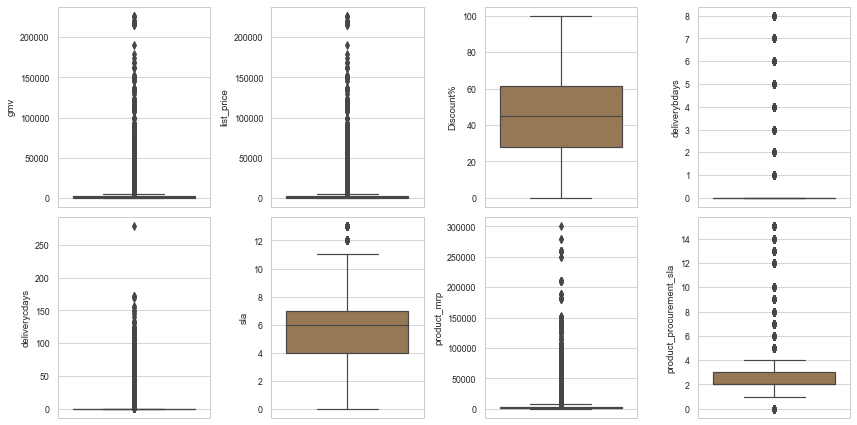

In [87]:
univariate_continuos(numeric_variables)

## Skewness

In [88]:
# Checking the skewness in the dataset

main_df[numeric_variables].skew()

gmv                         5.177873
list_price                  5.161353
Discount%                  -0.063059
deliverybdays               1.944739
deliverycdays              10.297208
sla                         0.356847
product_mrp                 4.612160
product_procurement_sla     2.490341
dtype: float64

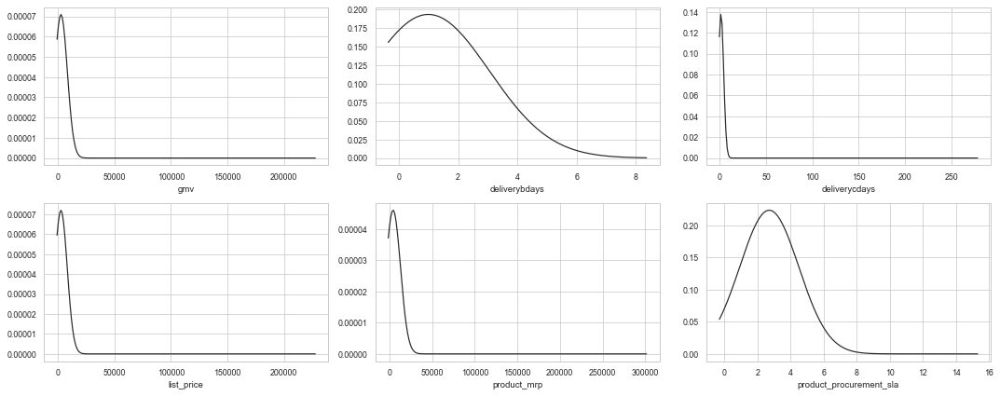

In [89]:
num_col = ['gmv','deliverybdays','deliverycdays','list_price','product_mrp','product_procurement_sla']

#Function to plot the distribution plot of the numeric variable list
def distplots(var_list):
    plt.figure(figsize=(15,6))
    for var in var_list:
        plt.subplot(2,3,var_list.index(var)+1)
        sns.distplot(main_df[var], fit=norm, kde=False, hist=False)

    plt.tight_layout()
    # display the plot
    plt.show()
    
distplots(num_col)  

In [90]:
main_df.isnull().values.any()

False

## Now we are mapping months to number of weeks for the month

In [91]:
import calendar

def WeekFinderFromYear(year):
        """ will return all the week from selected year """

        import datetime

        WEEK = {'MONDAY':0,'TUESDAY':1,'WEDNESDAY':2,'THURSDAY':3,'FRIDAY':4,'SATURDAY':5,'SUNDAY':6}
        MONTH = {'JANUARY':1,'FEBRUARY':2,'MARCH':3,'APRIL':4,'MAY':5,'JUNE':6,'JULY':7,'AUGUST':8,'SEPTEMBER':9,'OCTOBER':10,'NOVEMBER':11,'DECEMBER':12}

        year = int(year)
        month = MONTH['JANUARY']
        day = WEEK['MONDAY']

        dt = datetime.date(year, month, 1)
        dow_lst = []

        while dt.weekday() != day:
            dt = dt + datetime.timedelta(days = 1)

        lst_month = MONTH.values()

        for mont in lst_month:
         while dt.month == mont:
            dow_lst.append(dt)
            dt = dt + datetime.timedelta(days=7)
            
        month_number_week = {1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[], 9:[], 10:[], 11:[], 12:[]}
        month_name_week = {'Jan':[], 'Feb':[], 'Mar':[], 'Apr':[], 'May':[], 'Jun':[], 'Jul':[], 'Aug':[], 'Sep':[], 'Oct':[], 'Nov':[], 'Dec':[]}

        for each in dow_lst:
            month_number_week[each.month].append(each.isocalendar()[1])
            month_name_week[calendar.month_abbr[each.month]].append(each.isocalendar()[1])

        return month_number_week, month_name_week

In [92]:
dict_number_2015, dict_name_2015 = WeekFinderFromYear(2015)
print(dict_number_2015)
print()
print(dict_name_2015)

print()

dict_number_2016, dict_name_2016 = WeekFinderFromYear(2016)
print(dict_number_2016)
print()
print(dict_name_2016)

{1: [2, 3, 4, 5], 2: [6, 7, 8, 9], 3: [10, 11, 12, 13, 14], 4: [15, 16, 17, 18], 5: [19, 20, 21, 22], 6: [23, 24, 25, 26, 27], 7: [28, 29, 30, 31], 8: [32, 33, 34, 35, 36], 9: [37, 38, 39, 40], 10: [41, 42, 43, 44], 11: [45, 46, 47, 48, 49], 12: [50, 51, 52, 53]}

{'Jan': [2, 3, 4, 5], 'Feb': [6, 7, 8, 9], 'Mar': [10, 11, 12, 13, 14], 'Apr': [15, 16, 17, 18], 'May': [19, 20, 21, 22], 'Jun': [23, 24, 25, 26, 27], 'Jul': [28, 29, 30, 31], 'Aug': [32, 33, 34, 35, 36], 'Sep': [37, 38, 39, 40], 'Oct': [41, 42, 43, 44], 'Nov': [45, 46, 47, 48, 49], 'Dec': [50, 51, 52, 53]}

{1: [1, 2, 3, 4], 2: [5, 6, 7, 8, 9], 3: [10, 11, 12, 13], 4: [14, 15, 16, 17], 5: [18, 19, 20, 21, 22], 6: [23, 24, 25, 26], 7: [27, 28, 29, 30], 8: [31, 32, 33, 34, 35], 9: [36, 37, 38, 39], 10: [40, 41, 42, 43, 44], 11: [45, 46, 47, 48], 12: [49, 50, 51, 52]}

{'Jan': [1, 2, 3, 4], 'Feb': [5, 6, 7, 8, 9], 'Mar': [10, 11, 12, 13], 'Apr': [14, 15, 16, 17], 'May': [18, 19, 20, 21, 22], 'Jun': [23, 24, 25, 26], 'Jul': [27,

In [93]:
num_weeks_2015 = 0
num_weeks_2016 = 0

for i in dict_number_2015:
    if i >= 7:
        num_weeks_2015 += len(dict_number_2015[i])

for i in dict_number_2016:
    if i <= 6:
        num_weeks_2016 += len(dict_number_2016[i])

total_weeks = num_weeks_2015 + num_weeks_2016
total_weeks

52

## Media Investment

Generating weekly data from Year and Month for the media investment data

In [94]:
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [95]:
# Imputing nulls with 0

media_investment['Radio'].fillna(value=0, inplace=True)
media_investment['Other'].fillna(value=0, inplace=True)

media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,0.0,0.0
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,0.0,0.0
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,0.0,0.0
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,0.0,0.0


In [96]:
# Temp DataFrame

temp_media_investment = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'])

temp_media_investment.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
i = 0

for index, row in media_investment.iterrows():

    if row.Year == 2015:

        num_weeks = len(dict_number_2015[row.Month])

        for week in dict_number_2015[row.Month]:
            
            temp_media_investment.iloc[i].Year = row.Year
            temp_media_investment.iloc[i].Month = row.Month
            temp_media_investment.iloc[i]['Week'] = week
            temp_media_investment.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_investment.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_investment.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

    elif row.Year == 2016:
        
        num_weeks = len(dict_number_2016[row.Month])

        for week in dict_number_2016[row.Month]:
            
            temp_media_investment.iloc[i].Year = row.Year
            temp_media_investment.iloc[i].Month = row.Month
            temp_media_investment.iloc[i]['Week'] = week
            temp_media_investment.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_investment.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_investment.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_investment.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

temp_media_investment.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,28,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
1,2015,7,29,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
2,2015,7,30,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
3,2015,7,31,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
4,2015,8,32,1.013,0.001,0.256,0.213,0,0.026,0.015,0.503,0,0


In [98]:
temp_media_investment['Week'] = temp_media_investment['Week'].astype('str')

In [99]:
media_investment = temp_media_investment

media_investment.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,28,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
1,2015,7,29,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
2,2015,7,30,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
3,2015,7,31,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
4,2015,8,32,1.013,0.001,0.256,0.213,0,0.026,0.015,0.503,0,0


In [100]:
# Checking for duplicates
media_investment.duplicated('Week').value_counts()

False    52
dtype: int64

*No duplicates*

In [101]:
# Checking for nulls
media_investment.isnull().values.any()

False

*No Nulls*

In [102]:
# Dropping Year and Month columns as we won't be needing them anymore

del media_investment['Year']
del media_investment['Month']
media_investment.head()

,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,28,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
1,29,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
2,30,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
3,31,4.265,0.054,0.633,1.854,0,0.332,0.137,1.256,0,0
4,32,1.013,0.001,0.256,0.213,0,0.026,0.015,0.503,0,0


In [103]:
original_col = media_investment.columns[1:]
original_col

Index(['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], dtype='object')

## Now Calculating 8-weeks Exponential Moving Average for all Advertising media channels

In [104]:
def EMA_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_EMA_'+np.str(n),value=df[i].ewm(span=n, adjust=False).mean())
    return df

In [105]:
media_investment = EMA_variables(media_investment,original_col,8) 
media_investment.head()

,Week,Total Investment,Total Investment_EMA_8,TV,TV_EMA_8,Digital,Digital_EMA_8,Sponsorship,Sponsorship_EMA_8,Content Marketing,Content Marketing_EMA_8,Online marketing,Online marketing_EMA_8,Affiliates,Affiliates_EMA_8,SEM,SEM_EMA_8,Radio,Radio_EMA_8,Other,Other_EMA_8
0,28,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0,0.0,0,0.0
1,29,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0,0.0,0,0.0
2,30,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0,0.0,0,0.0
3,31,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0,0.0,0,0.0
4,32,1.013,3.542333,0.001,0.042222,0.256,0.549222,0.213,1.489333,0,0.0,0.026,0.264,0.015,0.109889,0.503,1.088667,0,0.0,0,0.0


## Now Calculating 5-weeks Simple Moving Average for all Advertising media channels

In [106]:
def SMA_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_SMA_'+np.str(n),value=df[i].rolling(window=n).mean())
    return df

In [107]:
media_investment = SMA_variables(media_investment,original_col,5) 
media_investment.head()

,Week,Total Investment,Total Investment_SMA_5,Total Investment_EMA_8,TV,TV_SMA_5,TV_EMA_8,Digital,Digital_SMA_5,Digital_EMA_8,Sponsorship,Sponsorship_SMA_5,Sponsorship_EMA_8,Content Marketing,Content Marketing_SMA_5,Content Marketing_EMA_8,Online marketing,Online marketing_SMA_5,Online marketing_EMA_8,Affiliates,Affiliates_SMA_5,Affiliates_EMA_8,SEM,SEM_SMA_5,SEM_EMA_8,Radio,Radio_SMA_5,Radio_EMA_8,Other,Other_SMA_5,Other_EMA_8
0,28,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0,NaN,0.0,0,NaN,0.0
1,29,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0,NaN,0.0,0,NaN,0.0
2,30,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0,NaN,0.0,0,NaN,0.0
3,31,4.265,NaN,4.265000,0.054,NaN,0.054000,0.633,NaN,0.633000,1.854,NaN,1.854000,0,NaN,0.0,0.332,NaN,0.332,0.137,NaN,0.137000,1.256,NaN,1.256000,0,NaN,0.0,0,NaN,0.0
4,32,1.013,3.6146,3.542333,0.001,0.0434,0.042222,0.256,0.5576,0.549222,0.213,1.5258,1.489333,0,0.0,0.0,0.026,0.2708,0.264,0.015,0.1126,0.109889,0.503,1.1054,1.088667,0,0.0,0.0,0,0.0,0.0


## Now Calculating 3-weeks Simple Moving Average for all Advertising media channels

In [108]:
media_investment = SMA_variables(media_investment,original_col,3) 
media_investment.head()

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8
0,28,4.265,NaN,NaN,4.265000,0.054,NaN,NaN,0.054000,0.633,NaN,NaN,0.633000,1.854,NaN,NaN,1.854000,0,NaN,NaN,0.0,0.332,NaN,NaN,0.332,0.137,NaN,NaN,0.137000,1.256,NaN,NaN,1.256000,0,NaN,NaN,0.0,0,NaN,NaN,0.0
1,29,4.265,NaN,NaN,4.265000,0.054,NaN,NaN,0.054000,0.633,NaN,NaN,0.633000,1.854,NaN,NaN,1.854000,0,NaN,NaN,0.0,0.332,NaN,NaN,0.332,0.137,NaN,NaN,0.137000,1.256,NaN,NaN,1.256000,0,NaN,NaN,0.0,0,NaN,NaN,0.0
2,30,4.265,4.265,NaN,4.265000,0.054,0.054000,NaN,0.054000,0.633,0.633000,NaN,0.633000,1.854,1.854,NaN,1.854000,0,0.0,NaN,0.0,0.332,0.332,NaN,0.332,0.137,0.137000,NaN,0.137000,1.256,1.256,NaN,1.256000,0,0.0,NaN,0.0,0,0.0,NaN,0.0
3,31,4.265,4.265,NaN,4.265000,0.054,0.054000,NaN,0.054000,0.633,0.633000,NaN,0.633000,1.854,1.854,NaN,1.854000,0,0.0,NaN,0.0,0.332,0.332,NaN,0.332,0.137,0.137000,NaN,0.137000,1.256,1.256,NaN,1.256000,0,0.0,NaN,0.0,0,0.0,NaN,0.0
4,32,1.013,3.181,3.6146,3.542333,0.001,0.036333,0.0434,0.042222,0.256,0.507333,0.5576,0.549222,0.213,1.307,1.5258,1.489333,0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.015,0.096333,0.1126,0.109889,0.503,1.005,1.1054,1.088667,0,0.0,0.0,0.0,0,0.0,0.0,0.0


## Now Calculating Ad Stock values for all Advertising media

In [109]:
def calculate_ad_stocks(data, engagement_factor):
    
    """initialize ad stock vectors"""
    TV_ad_stock_vector = []                     
    Digital_ad_stock_vector = []
    Sponsorship_ad_stock_vector = []
    Content_Marketing_ad_stock_vector = []
    Online_marketing_ad_stock_vector = []
    Affiliates_ad_stock_vector = []
    SEM_ad_stock_vector = []
    Radio_ad_stock_vector = []
    Other_ad_stock_vector = []
    Total_Investment_ad_stock_vector = []
    
    """initialize ad_stock_value"""
    tv_ad_stock_value = 0 
    Digital_ad_stock_value = 0
    Sponsorship_ad_stock_value = 0
    Content_Marketing_ad_stock_value = 0
    Online_marketing_ad_stock_value = 0
    Affiliates_ad_stock_value = 0
    SEM_ad_stock_value = 0
    Radio_ad_stock_value = 0
    Other_ad_stock_value = 0
    Total_Investment_ad_stock_value = 0
    
    """loop through dataset to calculate adstock values. The formula for adstock is: At = Xt + adstock rate * At-1."""
    for index, row in data.iterrows():
        tv_ad_stock_value = row['TV'] + engagement_factor * tv_ad_stock_value
        TV_ad_stock_vector.append(tv_ad_stock_value)
        Digital_ad_stock_value = row['Digital'] + engagement_factor * Digital_ad_stock_value
        Digital_ad_stock_vector.append(Digital_ad_stock_value)
        Sponsorship_ad_stock_value = row['Sponsorship'] + engagement_factor * Sponsorship_ad_stock_value
        Sponsorship_ad_stock_vector.append(Sponsorship_ad_stock_value)
        Content_Marketing_ad_stock_value = row['Content Marketing'] + engagement_factor * Content_Marketing_ad_stock_value
        Content_Marketing_ad_stock_vector.append(Content_Marketing_ad_stock_value)    
        Online_marketing_ad_stock_value = row['Online marketing'] + engagement_factor * Online_marketing_ad_stock_value
        Online_marketing_ad_stock_vector.append(Online_marketing_ad_stock_value)
        Affiliates_ad_stock_value = row['Affiliates'] + engagement_factor * Affiliates_ad_stock_value
        Affiliates_ad_stock_vector.append(Affiliates_ad_stock_value)
        SEM_ad_stock_value = row['SEM'] + engagement_factor * SEM_ad_stock_value
        SEM_ad_stock_vector.append(SEM_ad_stock_value)
        Radio_ad_stock_value = row['Radio'] + engagement_factor * Radio_ad_stock_value
        Radio_ad_stock_vector.append(Radio_ad_stock_value)
        Other_ad_stock_value = row['Other'] + engagement_factor * Other_ad_stock_value
        Other_ad_stock_vector.append(Other_ad_stock_value)
        Total_Investment_ad_stock_value = row['Total Investment'] + engagement_factor * Total_Investment_ad_stock_value
        Total_Investment_ad_stock_vector.append(Total_Investment_ad_stock_value)
    
    """add ad stock vector to dataset"""
    loc_index = data.columns.get_loc('TV_EMA_8') + 1
    data.insert(loc=loc_index,column='TV_Ad_Stock',value=TV_ad_stock_vector)
    loc_index = data.columns.get_loc('Digital_EMA_8') + 1
    data.insert(loc=loc_index,column='Digital_Ad_Stock',value=Digital_ad_stock_vector)
    loc_index = data.columns.get_loc('Sponsorship_EMA_8') + 1
    data.insert(loc=loc_index,column='Sponsorship_Ad_Stock',value=Sponsorship_ad_stock_vector)
    loc_index = data.columns.get_loc('Content Marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Content_Marketing_Ad_Stock',value=Content_Marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Online marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Online_marketing_Ad_Stock',value=Online_marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Affiliates_EMA_8') + 1
    data.insert(loc=loc_index,column='Affiliates_Ad_Stock',value=Affiliates_ad_stock_vector)
    loc_index = data.columns.get_loc('SEM_EMA_8') + 1
    data.insert(loc=loc_index,column='SEM_Ad_Stock',value=SEM_ad_stock_vector)
    loc_index = data.columns.get_loc('Radio_EMA_8') + 1
    data.insert(loc=loc_index,column='Radio_Ad_Stock',value=Radio_ad_stock_vector)
    loc_index = data.columns.get_loc('Other_EMA_8') + 1
    data.insert(loc=loc_index,column='Other_Ad_Stock',value=Other_ad_stock_vector)
    loc_index = data.columns.get_loc('Total Investment_EMA_8') + 1
    data.insert(loc=loc_index,column='Total_Investment_Ad_Stock',value=Total_Investment_ad_stock_vector)
    
    return data

#### Assuming the value of Adstock rate(engagement factor)

In [110]:
media_investment = calculate_ad_stocks(data=media_investment, engagement_factor=0.6)
media_investment.head(10)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
0,28,4.265,NaN,NaN,4.265000,4.265000,0.054,NaN,NaN,0.054000,0.054000,0.633,NaN,NaN,0.633000,0.633000,1.854,NaN,NaN,1.854000,1.854000,0,NaN,NaN,0.000,0.000,0.332,NaN,NaN,0.332000,0.332000,0.137,NaN,NaN,0.137000,0.137000,1.256,NaN,NaN,1.256000,1.256000,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0,0.0
1,29,4.265,NaN,NaN,4.265000,6.824000,0.054,NaN,NaN,0.054000,0.086400,0.633,NaN,NaN,0.633000,1.012800,1.854,NaN,NaN,1.854000,2.966400,0,NaN,NaN,0.000,0.000,0.332,NaN,NaN,0.332000,0.531200,0.137,NaN,NaN,0.137000,0.219200,1.256,NaN,NaN,1.256000,2.009600,0,NaN,NaN,0.0,0.0,0,NaN,NaN,0.0,0.0
2,30,4.265,4.265000,NaN,4.265000,8.359400,0.054,0.054000,NaN,0.054000,0.105840,0.633,0.633000,NaN,0.633000,1.240680,1.854,1.854000,NaN,1.854000,3.633840,0,0.000,NaN,0.000,0.000,0.332,0.332000,NaN,0.332000,0.650720,0.137,0.137000,NaN,0.137000,0.268520,1.256,1.256000,NaN,1.256000,2.461760,0,0.0,NaN,0.0,0.0,0,0.0,NaN,0.0,0.0
3,31,4.265,4.265000,NaN,4.265000,9.280640,0.054,0.054000,NaN,0.054000,0.117504,0.633,0.633000,NaN,0.633000,1.377408,1.854,1.854000,NaN,1.854000,4.034304,0,0.000,NaN,0.000,0.000,0.332,0.332000,NaN,0.332000,0.722432,0.137,0.137000,NaN,0.137000,0.298112,1.256,1.256000,NaN,1.256000,2.733056,0,0.0,NaN,0.0,0.0,0,0.0,NaN,0.0,0.0
4,32,1.013,3.181000,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307000,1.5258,1.489333,2.633582,0,0.000,0.0000,0.000,0.000,0.026,0.230000,0.2708,0.264000,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005000,1.1054,1.088667,2.142834,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
5,33,1.013,2.097000,2.9642,2.980259,4.961830,0.001,0.018667,0.0328,0.033062,0.043901,0.256,0.381667,0.4822,0.484062,0.905467,0.213,0.760000,1.1976,1.205704,1.793149,0,0.000,0.0000,0.000,0.000,0.026,0.128000,0.2096,0.211111,0.301676,0.015,0.055667,0.0882,0.088802,0.131320,0.503,0.754000,0.9548,0.958519,1.788700,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
6,34,1.013,1.013000,2.3138,2.543091,3.990098,0.001,0.001000,0.0222,0.025937,0.027341,0.256,0.256000,0.4068,0.433381,0.799280,0.213,0.213000,0.8694,0.985103,1.288890,0,0.000,0.0000,0.000,0.000,0.026,0.026000,0.1484,0.169975,0.207005,0.015,0.015000,0.0638,0.072402,0.093792,0.503,0.503000,0.8042,0.857292,1.576220,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
7,35,1.013,1.013000,1.6634,2.203070,3.407059,0.001,0.001000,0.0116,0.020395,0.017405,0.256,0.256000,0.3314,0.393963,0.735568,0.213,0.213000,0.5412,0.813524,0.986334,0,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0872,0.137981,0.150203,0.015,0.015000,0.0394,0.059646,0.071275,0.503,0.503000,0.6536,0.778561,1.448732,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
8,36,1.013,1.013000,1.0130,1.938610,3.057235,0.001,0.001000,0.0010,0.016085,0.011443,0.256,0.256000,0.2560,0.363305,0.697341,0.213,0.213000,0.2130,0.680075,0.804800,0,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0260,0.113096,0.116122,0.015,0.015000,0.0150,0.049725,0.057765,0.503,0.503000,0.5030,0.717325,1.372239,0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0
9,37,24.064,8.696667,5.6232,6.855364,25.898341,0.97,0.324000,0.1948,0.228066,0.976866,0.339,0.283667,0.2726,0.357904,0.757405,15.697,5.374333,3.3098,4.017169,16.179880,0.153,0.051,0.0306,0.034,0.153,4.095,1.382333,0.8398,0.997964,4.164673,1.26,0.430000

In [111]:
media_investment.fillna(value=0, inplace=True)
media_investment.head(10)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
0,28,4.265,0.000000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000000,0.0000,1.854000,1.854000,0.000,0.000,0.0000,0.000,0.000,0.332,0.000000,0.0000,0.332000,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,29,4.265,0.000000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000000,0.0000,1.854000,2.966400,0.000,0.000,0.0000,0.000,0.000,0.332,0.000000,0.0000,0.332000,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,30,4.265,4.265000,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854000,0.0000,1.854000,3.633840,0.000,0.000,0.0000,0.000,0.000,0.332,0.332000,0.0000,0.332000,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256000,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,31,4.265,4.265000,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854000,0.0000,1.854000,4.034304,0.000,0.000,0.0000,0.000,0.000,0.332,0.332000,0.0000,0.332000,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256000,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,32,1.013,3.181000,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307000,1.5258,1.489333,2.633582,0.000,0.000,0.0000,0.000,0.000,0.026,0.230000,0.2708,0.264000,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005000,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,33,1.013,2.097000,2.9642,2.980259,4.961830,0.001,0.018667,0.0328,0.033062,0.043901,0.256,0.381667,0.4822,0.484062,0.905467,0.213,0.760000,1.1976,1.205704,1.793149,0.000,0.000,0.0000,0.000,0.000,0.026,0.128000,0.2096,0.211111,0.301676,0.015,0.055667,0.0882,0.088802,0.131320,0.503,0.754000,0.9548,0.958519,1.788700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,34,1.013,1.013000,2.3138,2.543091,3.990098,0.001,0.001000,0.0222,0.025937,0.027341,0.256,0.256000,0.4068,0.433381,0.799280,0.213,0.213000,0.8694,0.985103,1.288890,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.1484,0.169975,0.207005,0.015,0.015000,0.0638,0.072402,0.093792,0.503,0.503000,0.8042,0.857292,1.576220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,35,1.013,1.013000,1.6634,2.203070,3.407059,0.001,0.001000,0.0116,0.020395,0.017405,0.256,0.256000,0.3314,0.393963,0.735568,0.213,0.213000,0.5412,0.813524,0.986334,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0872,0.137981,0.150203,0.015,0.015000,0.0394,0.059646,0.071275,0.503,0.503000,0.6536,0.778561,1.448732,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,36,1.013,1.013000,1.0130,1.938610,3.057235,0.001,0.001000,0.0010,0.016085,0.011443,0.256,0.256000,0.2560,0.363305,0.697341,0.213,0.213000,0.2130,0.680075,0.804800,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0260,0.113096,0.116122,0.015,0.015000,0.0150,0.049725,0.057765,0.503,0.503000,0.5030,0.717325,1.372239,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,37,24.06

In [112]:
media_investment.shape

(52, 51)

## NPS Score

##### We will generate weekly data from Year and Month for the nps score data

In [113]:
net_promoter_score

,score,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


##### Getting the dataset into suitable format

In [114]:
# resetting index
net_promoter_score.reset_index(drop=True, inplace=True)

# Transposing the dataframe
net_promoter_score = net_promoter_score.T

# resetting index
net_promoter_score.reset_index(drop=False, inplace=True)

# renaming columns
net_promoter_score.columns = ['Month', 'NPS', 'Stock Index']
net_promoter_score.drop(net_promoter_score.index[0], inplace=True)
net_promoter_score

,Month,NPS,Stock Index
1,July'15,54.5996,1177
2,Aug'15,59.9871,1206
3,Sept'15,46.9254,1101
4,Oct'15,44.3984,1210
5,Nov'15,47,1233
6,Dec'15,45.8,1038
7,Jan'16,47.093,1052
8,Feb'16,50.3274,1222
9,Mar'16,49.0206,1015
10,Apr'16,51.8276,1242


In [115]:
# Temp DataFrame

temp_nps = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'NPS', 'Stock Index'])

temp_nps

,Year,Month,Week,NPS,Stock Index
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN


We use the same NPS Score and Stock Index values for each week of a month which is the NPS Score and Stock Index of the entire month

In [116]:
i = 0

for index, row in net_promoter_score.iterrows():

    if '15' in row['Month']:
        
        month = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2015[month]:        
            
            temp_nps.iloc[i].Year = 2015
            temp_nps.iloc[i].Month = month
            temp_nps.iloc[i].Week = week
            temp_nps.iloc[i].NPS = row['NPS']
            temp_nps.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1
        
    elif '16' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2016[month]:        
            
            temp_nps.iloc[i].Year = 2016
            temp_nps.iloc[i].Month = month
            temp_nps.iloc[i].Week = week
            temp_nps.iloc[i].NPS = row['NPS']
            temp_nps.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1

temp_nps.head()

,Year,Month,Week,NPS,Stock Index
0,2015,Jul,28,54.5996,1177
1,2015,Jul,29,54.5996,1177
2,2015,Jul,30,54.5996,1177
3,2015,Jul,31,54.5996,1177
4,2015,Aug,32,59.9871,1206


In [117]:
temp_nps['Week'] = temp_nps['Week'].astype('str')

In [118]:
net_promoter_score = temp_nps

net_promoter_score

,Year,Month,Week,NPS,Stock Index
0,2015,Jul,28,54.5996,1177
1,2015,Jul,29,54.5996,1177
2,2015,Jul,30,54.5996,1177
3,2015,Jul,31,54.5996,1177
4,2015,Aug,32,59.9871,1206
5,2015,Aug,33,59.9871,1206
6,2015,Aug,34,59.9871,1206
7,2015,Aug,35,59.9871,1206
8,2015,Aug,36,59.9871,1206
9,2015,Sep,37,46.9254,1101


In [119]:
net_promoter_score.duplicated('Week').value_counts()

False    52
dtype: int64

No duplicates

In [120]:
net_promoter_score.isnull().values.any()

False

No Nulls

In [121]:
# Dropping Yeat and Month columns as we won't be needing them anymore

del net_promoter_score['Year']
del net_promoter_score['Month']

In [122]:
net_promoter_score.head()

,Week,NPS,Stock Index
0,28,54.5996,1177
1,29,54.5996,1177
2,30,54.5996,1177
3,31,54.5996,1177
4,32,59.9871,1206


In [123]:
nps_original_col = net_promoter_score.columns[1:]
nps_original_col

Index(['NPS', 'Stock Index'], dtype='object')

## Now We will Calculate 5-weeks Simple Moving Average for NPS and Stock_Index

In [124]:
net_promoter_score = SMA_variables(net_promoter_score,nps_original_col,5) 
net_promoter_score.head()

,Week,NPS,NPS_SMA_5,Stock Index,Stock Index_SMA_5
0,28,54.5996,NaN,1177,NaN
1,29,54.5996,NaN,1177,NaN
2,30,54.5996,NaN,1177,NaN
3,31,54.5996,NaN,1177,NaN
4,32,59.9871,55.677091,1206,1182.8


## Now we are Calculating 3-weeks Simple Moving Average for NPS and Stock_Index

In [125]:
net_promoter_score = SMA_variables(net_promoter_score,nps_original_col,3) 
net_promoter_score.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,28,54.5996,NaN,NaN,1177,NaN,NaN
1,29,54.5996,NaN,NaN,1177,NaN,NaN
2,30,54.5996,54.599588,NaN,1177,1177.000000,NaN
3,31,54.5996,54.599588,NaN,1177,1177.000000,NaN
4,32,59.9871,56.395426,55.677091,1206,1186.666667,1182.8


In [126]:
net_promoter_score.fillna(value=0, inplace=True)
net_promoter_score.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,28,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
1,29,54.599588,0.000000,0.000000,1177.0,0.000000,0.0
2,30,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
3,31,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0
4,32,59.987101,56.395426,55.677091,1206.0,1186.666667,1182.8


## Sale Calendar

We will generate weekly data from Year and Month for the sale calendar data

In [127]:
sale_calendar

,Unnamed: 1,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(17-15th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [128]:
# Getting the data into required format

sale_calendar.columns = ['Year', 'Sale']

sale_calendar.Year = sale_calendar.Year.apply(lambda x: int(x))
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('th','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('rd','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('(','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace(')','').strip())

# Splitting 25-31 Dec into two different rows for the ease of weekly data generation

sale_calendar.iloc[5, sale_calendar.columns.get_loc('Sale')] = '25-31 Dec'
sale_calendar = sale_calendar.append({'Year' : 2016 , 'Sale' : '1-3 Jan'} , ignore_index=True)

sale_calendar.sort_values(by=['Year'], ascending = True, inplace = True)

sale_calendar

,Year,Sale
0,2015,18-19 July
1,2015,15-17 Aug
2,2015,28-30 Aug
3,2015,17-15 Oct
4,2015,7-14 Nov
5,2015,25-31 Dec
6,2016,20-22 Jan
7,2016,1-2 Feb
8,2016,20-21 Feb
9,2016,14-15 Feb


In [129]:
# Dropping '17-15 Oct' entry assuming it is erroneous

sale_calendar.drop(sale_calendar.index[3], inplace=True)

sale_calendar

,Year,Sale
0,2015,18-19 July
1,2015,15-17 Aug
2,2015,28-30 Aug
4,2015,7-14 Nov
5,2015,25-31 Dec
6,2016,20-22 Jan
7,2016,1-2 Feb
8,2016,20-21 Feb
9,2016,14-15 Feb
10,2016,7-9 Mar


In [130]:
# Temp DataFrame

temp_sale_calendar = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'Sale'])

temp_sale_calendar

,Year,Month,Week,Sale
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN


%V - ISO 8601 week as a decimal number with Monday as the first day of the week.

We find the number of days in each week of a month on which there was a sale

In [131]:
i = 0
import datetime

for index, row in sale_calendar.iterrows():

    week_list = []
    month_list = []
    year_list = []

    date1, date2, month = re.split("[- ]", row.Sale)
    month = month[0:3] # Taking only the first 3 character of the month name
    year = row.Year
    
#     print("Date => {}-{}-{}".format(date1, month, year))
#     print(datetime.datetime.strptime('{}-{}-{}'.format(date1, month, year), "%d-%b-%Y").strftime("%V"))
#     print("Date => {}-{}-{}".format(date2, month, year))
#     print(datetime.datetime.strptime('{}-{}-{}'.format(date2, month, year), "%d-%b-%Y").strftime("%V"))
    
    date = int(date1)
    
    while date <= int(date2):
        
        # Extracting the week numbers of the range of dates in each month
        week = datetime.datetime.strptime('{}-{}-{}'.format(date, month, year), "%d-%b-%Y").strftime("%V")
        week_list.append(int(week))
        date+=1
    
    week_dict = dict.fromkeys(week_list, 0) # Generating a week list dictionary with default value as 0

    for j in week_list:
        week_dict[j] = week_dict[j] + 1

    for key, value in week_dict.items():
        temp_sale_calendar.iloc[i].Year = year
        temp_sale_calendar.iloc[i].Month = month
        temp_sale_calendar.iloc[i].Week = key
        temp_sale_calendar.iloc[i].Sale = value
        
        i+=1
    
temp_sale_calendar.dropna(axis=0, how='all', inplace=True) # Drop all rows which has all Nulls
temp_sale_calendar.sort_values(by=['Week'], ascending = True, inplace = True)

# Handling the special cases of 53 and 7 week numbers which appear twice
temp_sale_calendar.loc[temp_sale_calendar['Week'] == 53, 'Sale'] = temp_sale_calendar.loc[temp_sale_calendar['Week'] == 53, 'Sale'].sum()
temp_sale_calendar.loc[temp_sale_calendar['Week'] == 7, 'Sale'] = temp_sale_calendar.loc[temp_sale_calendar['Week'] == 7, 'Sale'].sum()

# Dropping the redundant 53 and 7 week numbers
temp_sale_calendar.drop_duplicates(subset=['Week'], keep='first', inplace=True)
temp_sale_calendar.reset_index(drop=True, inplace=True)

temp_sale_calendar.head()

,Year,Month,Week,Sale
0,2016,Jan,3,3
1,2016,Feb,5,2
2,2016,Feb,6,1
3,2016,Feb,7,3
4,2016,Mar,10,3


In [132]:
temp_sale_calendar['Week'] = temp_sale_calendar['Week'].astype('str')

In [133]:
sale_calendar = temp_sale_calendar

sale_calendar.head()

,Year,Month,Week,Sale
0,2016,Jan,3,3
1,2016,Feb,5,2
2,2016,Feb,6,1
3,2016,Feb,7,3
4,2016,Mar,10,3


In [134]:
sale_calendar.duplicated('Week').value_counts()

False    14
dtype: int64

No duplicates

In [135]:
sale_calendar.isnull().values.any()

False

No Nulls

In [136]:
# Dropping Yeat and Month columns as we won't be needing them anymore

del sale_calendar['Year']
del sale_calendar['Month']

## Climate 2015

We will generate weekly data from date for the climate data of 2015

In [137]:
# Skipping the first 24 rows while reading the data to ignore the metadata

climate_2015 = pd.read_csv('ONTARIO-2015.csv', skiprows=24)

climate_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [138]:
climate_2015.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag', 'Dir of Max Gust (10s deg)', 'Dir of Max Gust Flag', 'Spd of Max Gust (km/h)', 'Spd of Max Gust Flag'], dtype='object')

In [139]:
# Dropping the columns with all nulls

climate_2015.dropna(axis=1, thresh=1, inplace=True)

climate_2015.reset_index(drop=True, inplace=True)

climate_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN


In [140]:
climate_2015.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag'], dtype='object')

In [141]:
# Dropping columns with only one distinct value

drop_cols = []

for col in climate_2015.columns:
    if 'Flag' in col:
        print(climate_2015[col].value_counts())
        print()
        drop_cols.append(col)

drop_cols.append('Data Quality')

climate_2015.drop(drop_cols, axis=1, inplace=True)

print(climate_2015.columns)

M    13
Name: Max Temp Flag, dtype: int64

M    39
Name: Min Temp Flag, dtype: int64

M    39
Name: Mean Temp Flag, dtype: int64

M    39
Name: Heat Deg Days Flag, dtype: int64

M    39
Name: Cool Deg Days Flag, dtype: int64

T    7
Name: Total Rain Flag, dtype: int64

T    9
Name: Total Snow Flag, dtype: int64

T    12
Name: Total Precip Flag, dtype: int64

T    2
Name: Snow on Grnd Flag, dtype: int64

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')


In [142]:
# Formatting column names

climate_2015.columns = [col.replace(' (°C)','').strip() for col in climate_2015.columns]

climate_2015.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')

In [143]:
climate_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 13 columns):
Date/Time            365 non-null object
Year                 365 non-null int64
Month                365 non-null int64
Day                  365 non-null int64
Max Temp             216 non-null float64
Min Temp             190 non-null float64
Mean Temp            190 non-null float64
Heat Deg Days        190 non-null float64
Cool Deg Days        190 non-null float64
Total Rain (mm)      229 non-null float64
Total Snow (cm)      229 non-null float64
Total Precip (mm)    229 non-null float64
Snow on Grnd (cm)    229 non-null float64
dtypes: float64(9), int64(3), object(1)
memory usage: 37.2+ KB


In [144]:
# Dropping rows where all the columns have nulls

cols = ['Max Temp',
 'Min Temp',
 'Mean Temp',
 'Heat Deg Days',
 'Cool Deg Days',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_2015.dropna(subset=cols, inplace=True)

climate_2015.reset_index(drop=True, inplace=True)

climate_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 13 columns):
Date/Time            190 non-null object
Year                 190 non-null int64
Month                190 non-null int64
Day                  190 non-null int64
Max Temp             190 non-null float64
Min Temp             190 non-null float64
Mean Temp            190 non-null float64
Heat Deg Days        190 non-null float64
Cool Deg Days        190 non-null float64
Total Rain (mm)      190 non-null float64
Total Snow (cm)      190 non-null float64
Total Precip (mm)    190 non-null float64
Snow on Grnd (cm)    190 non-null float64
dtypes: float64(9), int64(3), object(1)
memory usage: 19.4+ KB


In [145]:
# Extracting week # from the date field and formatting it

climate_2015['Week'] = climate_2015['Date/Time'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").strftime("%V"))

climate_2015['Week'] = climate_2015['Week'].apply(lambda x: str(x).lstrip('0'))

climate_2015.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2015-01-01,2015,1,1,0.0,-8.5,-4.3,22.3,0.0,0.0,0.0,0.0,0.0,1
1,2015-01-02,2015,1,2,3.0,-3.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,1
2,2015-01-03,2015,1,3,2.5,-4.0,-0.8,18.8,0.0,24.0,0.0,24.0,0.0,1
3,2015-01-04,2015,1,4,2.5,0.0,1.3,16.7,0.0,0.0,1.0,1.0,0.0,1
4,2015-01-05,2015,1,5,-10.0,-13.5,-11.8,29.8,0.0,0.0,3.0,3.0,1.0,2


In [146]:
# Extracting July to Dec month's data

climate_2015 = climate_2015[climate_2015['Month'] >= 7]
climate_2015.reset_index(drop=True, inplace=True)

climate_2015.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2015-07-01,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27
1,2015-07-02,2015,7,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0,27
2,2015-07-03,2015,7,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,27
3,2015-07-04,2015,7,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0,27
4,2015-07-05,2015,7,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,27


In [147]:
climate_2015.sort_values(by=['Week'], ascending = True, inplace = True)

In [148]:
# Getting weekly data

climate_2015 = climate_2015.groupby(['Week']).agg({'Max Temp':"max", 'Min Temp':"min", 'Mean Temp':"mean", 'Heat Deg Days':"mean", 'Cool Deg Days':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

climate_2015.head()

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,27,28.0,10.0,19.360000,0.100000,1.460000,0.000000,0.0,0.000000,0.0
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0


In [149]:
# Dropping 27th week data as it belongs to June 2015

climate_2015.drop(climate_2015[climate_2015['Week'] == '27'].index, inplace = True)

In [150]:
climate_2015.duplicated().any()

False

No duplicates

In [151]:
climate_2015.isnull().values.any()

False

No Nulls

## Climate 2016

We will generate weekly data from date for the climate data of 2016

In [152]:
# Skipping the first 24 rows while reading the data to ignore the metadata

climate_2016 = pd.read_csv('ONTARIO-2016.csv', skiprows=24)

climate_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [153]:
climate_2016.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag', 'Dir of Max Gust (10s deg)', 'Dir of Max Gust Flag', 'Spd of Max Gust (km/h)', 'Spd of Max Gust Flag'], dtype='object')

In [154]:
# Dropping the columns with all nulls

climate_2016.dropna(axis=1, thresh=1, inplace=True)

climate_2016.reset_index(drop=True, inplace=True)

climate_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [155]:
climate_2016.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Data Quality', 'Max Temp (°C)', 'Max Temp Flag', 'Min Temp (°C)', 'Min Temp Flag', 'Mean Temp (°C)', 'Mean Temp Flag', 'Heat Deg Days (°C)', 'Heat Deg Days Flag', 'Cool Deg Days (°C)', 'Cool Deg Days Flag', 'Total Rain (mm)', 'Total Rain Flag', 'Total Snow (cm)', 'Total Snow Flag', 'Total Precip (mm)', 'Total Precip Flag', 'Snow on Grnd (cm)', 'Snow on Grnd Flag'], dtype='object')

In [156]:
# Dropping columns with only one distinct value

drop_cols = []

for col in climate_2016.columns:
    if 'Flag' in col:
        print(climate_2016[col].value_counts())
        print()
        drop_cols.append(col)

drop_cols.append('Data Quality')

climate_2016.drop(drop_cols, axis=1, inplace=True)

print(climate_2016.columns)

M    1
Name: Max Temp Flag, dtype: int64

M    8
Name: Min Temp Flag, dtype: int64

M    8
Name: Mean Temp Flag, dtype: int64

M    8
Name: Heat Deg Days Flag, dtype: int64

M    8
Name: Cool Deg Days Flag, dtype: int64

T    3
Name: Total Rain Flag, dtype: int64

T    7
Name: Total Snow Flag, dtype: int64

T    7
Name: Total Precip Flag, dtype: int64

T    6
Name: Snow on Grnd Flag, dtype: int64

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp (°C)', 'Min Temp (°C)', 'Mean Temp (°C)', 'Heat Deg Days (°C)', 'Cool Deg Days (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')


In [157]:
# Formatting column names

climate_2016.columns = [col.replace(' (°C)','').strip() for col in climate_2016.columns]

climate_2016.columns

Index(['Date/Time', 'Year', 'Month', 'Day', 'Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)'], dtype='object')

In [158]:
climate_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 13 columns):
Date/Time            366 non-null object
Year                 366 non-null int64
Month                366 non-null int64
Day                  366 non-null int64
Max Temp             226 non-null float64
Min Temp             219 non-null float64
Mean Temp            219 non-null float64
Heat Deg Days        219 non-null float64
Cool Deg Days        219 non-null float64
Total Rain (mm)      227 non-null float64
Total Snow (cm)      227 non-null float64
Total Precip (mm)    227 non-null float64
Snow on Grnd (cm)    227 non-null float64
dtypes: float64(9), int64(3), object(1)
memory usage: 37.3+ KB


In [159]:
# Dropping rows where all the columns have nulls

cols = ['Max Temp',
 'Min Temp',
 'Mean Temp',
 'Heat Deg Days',
 'Cool Deg Days',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_2016.dropna(subset=cols, inplace=True)

climate_2016.reset_index(drop=True, inplace=True)

climate_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 13 columns):
Date/Time            219 non-null object
Year                 219 non-null int64
Month                219 non-null int64
Day                  219 non-null int64
Max Temp             219 non-null float64
Min Temp             219 non-null float64
Mean Temp            219 non-null float64
Heat Deg Days        219 non-null float64
Cool Deg Days        219 non-null float64
Total Rain (mm)      219 non-null float64
Total Snow (cm)      219 non-null float64
Total Precip (mm)    219 non-null float64
Snow on Grnd (cm)    219 non-null float64
dtypes: float64(9), int64(3), object(1)
memory usage: 22.4+ KB


In [160]:
# Extracting week # from the date field and formatting it

climate_2016['Week'] = climate_2016['Date/Time'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").strftime("%V"))

climate_2016['Week'] = climate_2016['Week'].apply(lambda x: str(x).lstrip('0'))

climate_2016.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2016-01-08,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
3,2016-01-12,2016,1,12,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0,2
4,2016-01-14,2016,1,14,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0,2


In [161]:
# Extracting Jan to June month's data

climate_2016 = climate_2016[climate_2016['Month'] <= 6]
climate_2016.reset_index(drop=True, inplace=True)

climate_2016.head()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
0,2016-01-08,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
3,2016-01-12,2016,1,12,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0,2
4,2016-01-14,2016,1,14,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0,2


In [162]:
climate_2016.tail()

,Date/Time,Year,Month,Day,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Week
88,2016-06-24,2016,6,24,29.0,13.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,25
89,2016-06-25,2016,6,25,30.5,13.0,21.8,0.0,3.8,0.0,0.0,0.0,0.0,25
90,2016-06-26,2016,6,26,34.0,18.5,26.3,0.0,8.3,3.2,0.0,3.2,0.0,25
91,2016-06-27,2016,6,27,34.5,20.0,27.3,0.0,9.3,0.0,0.0,0.0,0.0,26
92,2016-06-30,2016,6,30,30.0,13.0,21.5,0.0,3.5,2.0,0.0,2.0,0.0,26


In [163]:
climate_2016.sort_values(by=['Week'], ascending = True, inplace = True)

In [164]:
# Getting weekly data

climate_2016 = climate_2016.groupby(['Week']).agg({'Max Temp':"max", 'Min Temp':"min", 'Mean Temp':"mean", 'Heat Deg Days':"mean", 'Cool Deg Days':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

climate_2016.head()

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,1,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.0
1,10,20.0,-2.0,10.166667,7.833333,0.0,9.000000,0.000000,9.000000,0.0
2,11,16.0,-2.5,8.900000,9.100000,0.0,0.500000,0.000000,0.500000,0.0
3,12,20.5,-3.5,5.720000,12.280000,0.0,12.800000,0.000000,12.800000,0.0
4,13,16.0,-5.0,6.871429,11.128571,0.0,2.828571,0.542857,3.371429,0.0


In [165]:
climate_2016.duplicated().any()

False

No duplicates

In [166]:
climate_2016.isnull().values.any()

False

No Nulls

## List Difference

In [167]:
def list_diff(list1, list2): 
    return (list(set(list1) - set(list2)))

## Concatenating Climate Datasets

In [168]:
print(list_diff(list(climate_2015.columns), list(climate_2016.columns)))

[]


In [169]:
print(climate_2015.shape)
print(climate_2016.shape)

(26, 10)
(25, 10)


Concatenating the climate data sets to form a single one to be merged with the order data set

In [170]:
climate = pd.concat([climate_2015, climate_2016], axis = 0)

climate.shape

(51, 10)

In [171]:
climate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51 entries, 1 to 24
Data columns (total 10 columns):
Week                 51 non-null object
Max Temp             51 non-null float64
Min Temp             51 non-null float64
Mean Temp            51 non-null float64
Heat Deg Days        51 non-null float64
Cool Deg Days        51 non-null float64
Total Rain (mm)      51 non-null float64
Total Snow (cm)      51 non-null float64
Total Precip (mm)    51 non-null float64
Snow on Grnd (cm)    51 non-null float64
dtypes: float64(9), object(1)
memory usage: 4.4+ KB


In [172]:
climate.head()

,Week,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0
5,32,28.5,15.0,21.650000,0.000000,3.650000,0.350000,0.0,0.350000,0.0


In [173]:
climate.Week.unique()

array(['28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38',
       '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49',
       '50', '51', '52', '53', '1', '10', '11', '12', '13', '14', '15',
       '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25',
       '26', '4', '5', '6', '7', '8', '9'], dtype=object)

## We are Extracting 3 separate dataframes for 3 product subcategories  - camera accessory, home audio and gaming accessory

In [174]:
main_df.shape

(1464190, 21)

In [175]:
main_df['product_analytic_sub_category'].value_counts()

speaker                468310
cameraaccessory        215901
gamingaccessory        185876
tvvideosmall           133192
homeaudio              111061
audiomp3player         103463
game                    96842
camera                  87552
gamingconsole           26984
camerastorage           16558
audioaccessory          10702
hometheatre              4197
amplifierreceiver        3455
gamemembershipcards        97
Name: product_analytic_sub_category, dtype: int64

In [176]:
cameraaccessory_df = main_df.loc[main_df['product_analytic_sub_category']=='cameraaccessory']
gamingaccessory_df = main_df.loc[main_df['product_analytic_sub_category']=='gamingaccessory']
homeaudio_df = main_df.loc[main_df['product_analytic_sub_category']=='homeaudio']

print('No of rows in cameraaccessory_df: {}'.format(cameraaccessory_df.shape[0]))
print('No of rows in gamingaccessory_df: {}'.format(gamingaccessory_df.shape[0]))
print('No of rows in homeaudio_df: {}'.format(homeaudio_df.shape[0]))

No of rows in cameraaccessory_df: 215901
No of rows in gamingaccessory_df: 185876
No of rows in homeaudio_df: 111061


### Converting some binary variables to numeric format

In [177]:
cameraaccessory_df['is_cod'] = cameraaccessory_df['s1_fact.order_payment_type'].apply(lambda x:1 if x=='cod' else 0)
gamingaccessory_df['is_cod'] = gamingaccessory_df['s1_fact.order_payment_type'].apply(lambda x:1 if x=='cod' else 0)
homeaudio_df['is_cod'] = homeaudio_df['s1_fact.order_payment_type'].apply(lambda x:1 if x=='cod' else 0)


cameraaccessory_df['is_mass_market'] = cameraaccessory_df['product_type'].apply(lambda x:1 if x=='mass_market' else 0)
gamingaccessory_df['is_mass_market'] = gamingaccessory_df['product_type'].apply(lambda x:1 if x=='mass_market' else 0)
homeaudio_df['is_mass_market'] = homeaudio_df['product_type'].apply(lambda x:1 if x=='mass_market' else 0)

cameraaccessory_df.head()

,order_date,Year,Month,Week,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag,product_type,is_cod,is_mass_market
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,10.99,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury,1,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,4.03,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury,1,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,5.19,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market,1,1
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,19.49,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0,mass_market,0,1
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,22.92,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market,0,1


*Deleting the columns 's1_fact.order_payment_type' & 'product_type'*

In [178]:
# Dropping Columns which are insignificant to the analysis

drop_columns = ['s1_fact.order_payment_type','product_type']

cameraaccessory_df.drop(drop_columns, axis=1, inplace=True)
gamingaccessory_df.drop(drop_columns, axis=1, inplace=True)
homeaudio_df.drop(drop_columns, axis=1, inplace=True)

### For categorical variable(`product_analytic_vertical`) with multiple levels, creating dummy features (one-hot encoded)

In [179]:
# Creating dummy variables for the remaining categorical variable
dummy1 = pd.get_dummies(cameraaccessory_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy2 = pd.get_dummies(gamingaccessory_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy3 = pd.get_dummies(homeaudio_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)

# Adding the results to the original dataframes
cameraaccessory_df = pd.concat([cameraaccessory_df, dummy1], axis=1)
gamingaccessory_df = pd.concat([gamingaccessory_df, dummy2], axis=1)
homeaudio_df = pd.concat([homeaudio_df, dummy3], axis=1)

### Dropping the repeated variable

In [180]:
# removing columns
cameraaccessory_df = cameraaccessory_df.drop('product_analytic_vertical', axis=1)
gamingaccessory_df = gamingaccessory_df.drop('product_analytic_vertical', axis=1)
homeaudio_df = homeaudio_df.drop('product_analytic_vertical', axis=1)

print('Shape of cameraaccessory_df: {}'.format(cameraaccessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gamingaccessory_df.shape))
print('Shape of homeaudio_df: {}'.format(homeaudio_df.shape))

Shape of cameraaccessory_df: (215901, 43)
Shape of gamingaccessory_df: (185876, 34)
Shape of homeaudio_df: (111061, 30)


### Checking the no of unique values in the columns of the 3 new dataframes

In [181]:
# Unique value frequencies
unique_values = pd.DataFrame(cameraaccessory_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(cameraaccessory_df.dtypes)
unique_values.head()

,Unique Value Count,dtype
product_analytic_sub_category,1,object
product_analytic_category,1,object
product_vertical_camerabag,2,uint8
product_vertical_camerabatterygrip,2,uint8
product_vertical_cameraeyecup,2,uint8


In [182]:
# Unique value frequencies
unique_values = pd.DataFrame(gamingaccessory_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(gamingaccessory_df.dtypes)
unique_values.head()

,Unique Value Count,dtype
product_analytic_sub_category,1,object
product_analytic_category,1,object
payday_flag,2,int64
product_vertical_gamecontrolmount,2,uint8
product_vertical_gamepad,2,uint8


In [183]:
# Unique value frequencies
unique_values = pd.DataFrame(homeaudio_df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), \
                             columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values['dtype'] = pd.DataFrame(homeaudio_df.dtypes)
unique_values.head()

,Unique Value Count,dtype
product_analytic_sub_category,1,object
product_analytic_category,1,object
product_vertical_voicerecorder,2,uint8
product_vertical_dock,2,uint8
product_vertical_djcontroller,2,uint8


*Thus we see that in all 3 dfs, columns 'product_analytic_category' & 'product_analytic_sub_category' have only 1 unique value. Hence we will drop these 2 columns from the 3 dataframes.*

In [184]:
# Dropping Columns which are insignificant to the analysis

drop_columns = ['product_analytic_category', 'product_analytic_sub_category']

cameraaccessory_df.drop(drop_columns, axis=1, inplace=True)
gamingaccessory_df.drop(drop_columns, axis=1, inplace=True)
homeaudio_df.drop(drop_columns, axis=1, inplace=True)

### Checking if any null values exist in the 3 new dataframes

In [185]:
print('Are there any null values in cameraaccessory_df: {}'.format(cameraaccessory_df.isnull().values.any()))
print('Are there any null values in gamingaccessory_df: {}'.format(gamingaccessory_df.isnull().values.any()))
print('Are there any null values in homeaudio_df: {}'.format(homeaudio_df.isnull().values.any()))

Are there any null values in cameraaccessory_df: False
Are there any null values in gamingaccessory_df: False
Are there any null values in homeaudio_df: False


### Roll Up Order Data to Weekly Level

Rolling up order data to get weekly data by taking a mean of all the values per week

##### For rolling up to obtain weekly data that will be used for modelling, we will ignore `list_price` and `product_mrp`. These features are closely related to `gmv(revenue)`. However they dont add any business value. It is obvious that having a high mpr or list_price will increase the revenue. But that wont be a good business decision to maximise revenue.

##### `Units` also is not a very important feature from business perspective as its obvious that higher the no of units sold, more will be the revenue. The challenge of prediction is to find attributes, tuning which, customers will buy more product units, thereby increasing revenue.

In [186]:
cameraaccessory_df = cameraaccessory_df.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays': "mean", \
                                          'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'payday_flag':'sum','occassion_flag':'sum','is_cod':'sum', 'is_mass_market':'sum', \
                                          'product_vertical_cameraaccessory':'sum', \
                                          'product_vertical_camerabag':'sum', 'product_vertical_camerabattery':'sum', \
                                          'product_vertical_camerabatterycharger':'sum', 'product_vertical_camerabatterygrip': \
                                          'sum','product_vertical_cameraeyecup':'sum','product_vertical_camerafilmrolls':'sum', \
                                          'product_vertical_camerahousing':'sum','product_vertical_cameraledlight':'sum', \
                                          'product_vertical_cameramicrophone':'sum','product_vertical_cameramount':'sum', \
                                          'product_vertical_cameraremotecontrol':'sum', 'product_vertical_cameratripod':'sum', \
                                          'product_vertical_extensiontube':'sum', 'product_vertical_filter':'sum', \
                                          'product_vertical_flash':'sum','product_vertical_flashshoeadapter':'sum', \
                                          'product_vertical_lens':'sum','product_vertical_reflectorumbrella':'sum', \
                                          'product_vertical_softbox':'sum','product_vertical_strap':'sum', \
                                          'product_vertical_teleconverter':'sum','product_vertical_telescope':'sum'}) \
.reset_index(drop=False)
cameraaccessory_df.shape

(51, 34)

In [187]:
gamingaccessory_df = gamingaccessory_df.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays':"mean", \
                                                               'deliverycdays':'mean','sla':'mean','product_procurement_sla': \
                                                               'mean','payday_flag':'sum','occassion_flag':'sum','is_cod':'sum', \
                                                               'is_mass_market':'sum','product_vertical_gamecontrolmount':'sum', \
                                                               'product_vertical_gamepad':'sum', \
                                                               'product_vertical_gamingaccessorykit':'sum', \
                                                               'product_vertical_gamingadapter':'sum', \
                                                               'product_vertical_gamingchargingstation':'sum', \
                                                               'product_vertical_gamingheadset':'sum', \
                                                               'product_vertical_gamingkeyboard':'sum', \
                                                               'product_vertical_gamingmemorycard':'sum', \
                                                               'product_vertical_gamingmouse':'sum', \
                                                               'product_vertical_gamingmousepad':'sum', \
                                                               'product_vertical_gamingmousepad':'sum', \
                                                               'product_vertical_gamingspeaker':'sum', 
                                                               'product_vertical_joystickgamingwheel':'sum', \
                                                               'product_vertical_motioncontroller':'sum', \
                                                               'product_vertical_tvoutcableaccessory':'sum'}) \
.reset_index(drop=False)
gamingaccessory_df.shape

(52, 25)

In [188]:
homeaudio_df = homeaudio_df.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays': \
                                                   'mean','deliverycdays':'mean','sla':'mean','product_procurement_sla':'mean',\
                                                   'payday_flag':'sum','occassion_flag':'sum','is_cod':'sum', \
                                                   'is_mass_market':'sum','product_vertical_djcontroller':'sum', \
                                                   'product_vertical_dock':'sum', 'product_vertical_dockingstation':'sum', \
                                                   'product_vertical_fmradio':'sum', 'product_vertical_hifisystem':'sum', \
                                                   'product_vertical_homeaudiospeaker':'sum', \
                                                   'product_vertical_karaokeplayer':'sum', 'product_vertical_slingbox':'sum', \
                                                   'product_vertical_soundmixer':'sum','product_vertical_voicerecorder':'sum'})\
.reset_index(drop=False)
homeaudio_df.shape

(49, 21)

## Calculating Payday week & Holiday week

 - If Payday falls within the week(payday_flag > 0), then payday week = 1, else 0
 - If holiday falls within the week(occassion_flag > 0), then holiday week = 1, else 0

In [189]:
cameraaccessory_df['payday_week'] = cameraaccessory_df['payday_flag'].apply(lambda x:1 if x > 0 else 0)
gamingaccessory_df['payday_week'] = gamingaccessory_df['payday_flag'].apply(lambda x:1 if x > 0 else 0)
homeaudio_df['payday_week'] = homeaudio_df['payday_flag'].apply(lambda x:1 if x > 0 else 0)

cameraaccessory_df['holiday_week'] = cameraaccessory_df['occassion_flag'].apply(lambda x:1 if x > 0 else 0)
gamingaccessory_df['holiday_week'] = gamingaccessory_df['occassion_flag'].apply(lambda x:1 if x > 0 else 0)
homeaudio_df['holiday_week'] = homeaudio_df['occassion_flag'].apply(lambda x:1 if x > 0 else 0)

cameraaccessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,payday_flag,occassion_flag,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week
0,01,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,0,0,4272,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31,0,0
1,02,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,1474,0,3000,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27,1,0
2,03,6954520.0,47.812018,0.000780,0.000975,6.384016,2.695712,0,0,3819,4558,44,295.0,607.0,303.0,13,1,46,0,0,2,34,86.0,431.0,3,268.0,1863.0,0,823.0,0,0,40,0,37,0,0
3,04,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,1054,0,2795,3149,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38,1,0
4,05,5380254.0,51.190178,0.002205,0.002940,6.340805,2.728826,0,0,4323,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,37,0,43,0,0


*Dropping columns 'payday_flag' and 'occassion_flag'*

In [190]:
drop_columns = ['payday_flag','occassion_flag']

cameraaccessory_df = cameraaccessory_df.drop(drop_columns, axis=1)
gamingaccessory_df = gamingaccessory_df.drop(drop_columns, axis=1)
homeaudio_df = homeaudio_df.drop(drop_columns, axis=1)

cameraaccessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week
0,01,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,4272,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31,0,0
1,02,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,3000,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27,1,0
2,03,6954520.0,47.812018,0.000780,0.000975,6.384016,2.695712,3819,4558,44,295.0,607.0,303.0,13,1,46,0,0,2,34,86.0,431.0,3,268.0,1863.0,0,823.0,0,0,40,0,37,0,0
3,04,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,2795,3149,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38,1,0
4,05,5380254.0,51.190178,0.002205,0.002940,6.340805,2.728826,4323,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,37,0,43,0,0


In [191]:
print('Shape of cameraaccessory_df: {}'.format(cameraaccessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gamingaccessory_df.shape))
print('Shape of homeaudio_df: {}'.format(homeaudio_df.shape))

Shape of cameraaccessory_df: (51, 34)
Shape of gamingaccessory_df: (52, 25)
Shape of homeaudio_df: (49, 21)


## Merge DataFrames

#### Pre-merge activity

In [192]:
print(cameraaccessory_df.Week.unique())
print("--------------------------------------------------------")
print(gamingaccessory_df.Week.unique())
print("--------------------------------------------------------")
print(homeaudio_df.Week.unique())
print("--------------------------------------------------------")

['01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13' '14'
 '15' '16' '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '28' '29'
 '30' '31' '32' '33' '35' '36' '37' '38' '39' '40' '41' '42' '43' '44'
 '45' '46' '47' '48' '49' '50' '51' '52' '53']
--------------------------------------------------------
['01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13' '14'
 '15' '16' '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '28' '29'
 '30' '31' '32' '33' '34' '35' '36' '37' '38' '39' '40' '41' '42' '43'
 '44' '45' '46' '47' '48' '49' '50' '51' '52' '53']
--------------------------------------------------------
['01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13' '14'
 '15' '16' '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '28' '29'
 '30' '31' '32' '36' '37' '38' '39' '40' '41' '42' '43' '44' '45' '46'
 '47' '48' '49' '50' '51' '52' '53']
--------------------------------------------------------


In [193]:
# Formatting pre merge
cameraaccessory_df.Week = cameraaccessory_df.Week.apply(lambda x: x.lstrip('0'))
gamingaccessory_df.Week = gamingaccessory_df.Week.apply(lambda x: x.lstrip('0'))
homeaudio_df.Week = homeaudio_df.Week.apply(lambda x: x.lstrip('0'))

#### Merging Media Investment Dataset

In [194]:
# Taking an left join on Week column

cameraaccessory_df = pd.merge(cameraaccessory_df, media_investment, how='left', on='Week')
gamingaccessory_df = pd.merge(gamingaccessory_df, media_investment, how='left', on='Week')
homeaudio_df = pd.merge(homeaudio_df, media_investment, how='left', on='Week')

print('Are there any null values in cameraaccessory_df: {}'.format(cameraaccessory_df.isnull().values.any()))
print('Are there any null values in gamingaccessory_df: {}'.format(gamingaccessory_df.isnull().values.any()))
print('Are there any null values in homeaudio_df: {}'.format(homeaudio_df.isnull().values.any()))

Are there any null values in cameraaccessory_df: False
Are there any null values in gamingaccessory_df: False
Are there any null values in homeaudio_df: False


In [195]:
print('Shape of cameraaccessory_df: {}'.format(cameraaccessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gamingaccessory_df.shape))
print('Shape of homeaudio_df: {}'.format(homeaudio_df.shape))

Shape of cameraaccessory_df: (51, 84)
Shape of gamingaccessory_df: (52, 75)
Shape of homeaudio_df: (49, 71)


#### Merging Net Promoter Score Data Set

In [196]:
# Taking an left join on Week column

cameraaccessory_df = pd.merge(cameraaccessory_df, net_promoter_score, how='left', on='Week')
gamingaccessory_df = pd.merge(gamingaccessory_df, net_promoter_score, how='left', on='Week')
homeaudio_df = pd.merge(homeaudio_df, net_promoter_score, how='left', on='Week')

print('Are there any null values in cameraaccessory_df: {}'.format(cameraaccessory_df.isnull().values.any()))
print('Are there any null values in gamingaccessory_df: {}'.format(gamingaccessory_df.isnull().values.any()))
print('Are there any null values in homeaudio_df: {}'.format(homeaudio_df.isnull().values.any()))

Are there any null values in cameraaccessory_df: False
Are there any null values in gamingaccessory_df: False
Are there any null values in homeaudio_df: False


In [197]:
print('Shape of cameraaccessory_df: {}'.format(cameraaccessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gamingaccessory_df.shape))
print('Shape of homeaudio_df: {}'.format(homeaudio_df.shape))

Shape of cameraaccessory_df: (51, 90)
Shape of gamingaccessory_df: (52, 81)
Shape of homeaudio_df: (49, 77)


#### Merging Climate Data Set

In [198]:
# Taking an left join on Week column

cameraaccessory_df = pd.merge(cameraaccessory_df, climate, how='left', on='Week')
gamingaccessory_df = pd.merge(gamingaccessory_df, climate, how='left', on='Week')
homeaudio_df = pd.merge(homeaudio_df, climate, how='left', on='Week')

print('Are there any null values in cameraaccessory_df: {}'.format(cameraaccessory_df.isnull().values.any()))
print('Are there any null values in gamingaccessory_df: {}'.format(gamingaccessory_df.isnull().values.any()))
print('Are there any null values in homeaudio_df: {}'.format(homeaudio_df.isnull().values.any()))

Are there any null values in cameraaccessory_df: True
Are there any null values in gamingaccessory_df: True
Are there any null values in homeaudio_df: True


As expected, there are nulls in the climate columns now for the week# 3 which doesn't exist in the climate dataset

In [199]:
print('No of rows with null values in cameraaccessory_df:{}'.format(cameraaccessory_df[cameraaccessory_df.isnull().any(axis=1)].shape))
print('No of rows with null values in gamingaccessory_df:{}'.format(gamingaccessory_df[gamingaccessory_df.isnull().any(axis=1)].shape))
print('No of rows with null values in homeaudio_df:{}'.format(homeaudio_df[homeaudio_df.isnull().any(axis=1)].shape))

No of rows with null values in cameraaccessory_df:(1, 99)
No of rows with null values in gamingaccessory_df:(1, 90)
No of rows with null values in homeaudio_df:(1, 86)


Since the number of rows with nulls is only 1, we will drop them

In [200]:
cols = ['Max Temp', 'Min Temp', 'Mean Temp', 'Heat Deg Days', 'Cool Deg Days', 'Total Rain (mm)', 'Total Snow (cm)', 'Total Precip (mm)', 'Snow on Grnd (cm)']

cameraaccessory_df.dropna(subset=cols, inplace=True)
gamingaccessory_df.dropna(subset=cols, inplace=True)
homeaudio_df.dropna(subset=cols, inplace=True)

In [201]:
print('Are there any null values in cameraaccessory_df: {}'.format(cameraaccessory_df.isnull().values.any()))
print('Are there any null values in gamingaccessory_df: {}'.format(gamingaccessory_df.isnull().values.any()))
print('Are there any null values in homeaudio_df: {}'.format(homeaudio_df.isnull().values.any()))

Are there any null values in cameraaccessory_df: False
Are there any null values in gamingaccessory_df: False
Are there any null values in homeaudio_df: False


No Nulls

In [202]:
print('Shape of cameraaccessory_df: {}'.format(cameraaccessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gamingaccessory_df.shape))
print('Shape of homeaudio_df: {}'.format(homeaudio_df.shape))

Shape of cameraaccessory_df: (50, 99)
Shape of gamingaccessory_df: (51, 90)
Shape of homeaudio_df: (48, 86)


#### Merging Sale Calendar Data Set

In [203]:
# Taking an left join on Week column

cameraaccessory_df = pd.merge(cameraaccessory_df, sale_calendar, how='left', on='Week')
gamingaccessory_df = pd.merge(gamingaccessory_df, sale_calendar, how='left', on='Week')
homeaudio_df = pd.merge(homeaudio_df, sale_calendar, how='left', on='Week')

print('Are there any null values in cameraaccessory_df: {}'.format(cameraaccessory_df.isnull().values.any()))
print('Are there any null values in gamingaccessory_df: {}'.format(gamingaccessory_df.isnull().values.any()))
print('Are there any null values in homeaudio_df: {}'.format(homeaudio_df.isnull().values.any()))

Are there any null values in cameraaccessory_df: True
Are there any null values in gamingaccessory_df: True
Are there any null values in homeaudio_df: True


In [204]:
# Imputing the nulls with 0 meaning for those weeks there was 0 days in special sale

cameraaccessory_df['Sale'].fillna(value=0, inplace=True)
gamingaccessory_df['Sale'].fillna(value=0, inplace=True)
homeaudio_df['Sale'].fillna(value=0, inplace=True)

In [205]:
print('Are there any null values in cameraaccessory_df: {}'.format(cameraaccessory_df.isnull().values.any()))
print('Are there any null values in gamingaccessory_df: {}'.format(gamingaccessory_df.isnull().values.any()))
print('Are there any null values in homeaudio_df: {}'.format(homeaudio_df.isnull().values.any()))

Are there any null values in cameraaccessory_df: False
Are there any null values in gamingaccessory_df: False
Are there any null values in homeaudio_df: False


No Nulls

In [206]:
print('Shape of cameraaccessory_df: {}'.format(cameraaccessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gamingaccessory_df.shape))
print('Shape of homeaudio_df: {}'.format(homeaudio_df.shape))

Shape of cameraaccessory_df: (50, 100)
Shape of gamingaccessory_df: (51, 91)
Shape of homeaudio_df: (48, 87)


In [207]:
cameraaccessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
0,1,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,4272,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31,0,0,18.549,23.973667,25.0586,22.026271,55.827691,1.095,1.264333,1.2982,1.177750,3.029435,0.114,0.548667,0.6356,0.627434,1.201981,1.050,9.800667,11.5508,9.191035,20.371640,0.225,0.253000,0.2586,0.235696,0.591280,5.725,5.659000,5.6458,5.234402,13.858825,1.842,1.752,1.7340,1.633464,4.332222,1.050,2.213333,2.446,2.271204,4.994131,0.675,0.225,0.135,0.150000,0.675000,6.773,2.257667,1.3546,1.505111,6.773000,47.093031,46.231010,46.058606,1052.0,1042.666667,1040.8,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000,0
1,2,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,3000,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27,1,0,18.549,21.261333,23.4312,21.253544,52.045615,1.095,1.179667,1.2474,1.159361,2.912661,0.114,0.331333,0.5052,0.513338,0.835188,1.050,5.425333,8.9256,7.381916,13.272984,0.225,0.239000,0.2502,0.233319,0.579768,5.725,5.692000,5.6656,5.343424,14.040295,1.842,1.797,1.7610,1.679805,4.441333,1.050,1.631667,2.097,1.999826,4.046478,0.675,0.450,0.270,0.266667,1.080000,6.773,4.515333,2.7092,2.675753,10.836800,47.093031,46.662021,46.317213,1052.0,1047.333333,1043.6,4.5,-12.0,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333,0
2,4,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,2795,3149,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38,1,0,18.549,18.549000,20.1764,20.185082,48.414821,1.095,1.095000,1.1458,1.133935,2.800558,0.114,0.114000,0.2444,0.355575,0.483068,1.050,1.050000,3.6752,4.880418,6.458274,0.225,0.225000,0.2334,0.230033,0.568717,5.725,5.725000,5.7052,5.494170,14.214506,1.842,1.842,1.8150,1.743882,4.546080,1.050,1.050000,1.399,1.624586,3.136732,0.675,0.675,0.540,0.427984,1.468800,6.773,6.773000,5.4184,4.294419,14.738048,47.093031,47.093031,46.834425,1052.0,1052.000000,1049.2,5.5,-9.0,-1.800000,19.800000,0.0,0.000000,0.000000,0.000000,0.000000,0
3,5,5380254.0,51.190178,0.002205,0.002940,6.340805,2.728826,4323,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,3

### Sorting the dataframes based on Week# from July,2015 to June,2016

In [208]:
# String to Int

cameraaccessory_df['Week'] = cameraaccessory_df['Week'].astype('int64')
gamingaccessory_df['Week'] = gamingaccessory_df['Week'].astype('int64')
homeaudio_df['Week'] = homeaudio_df['Week'].astype('int64')

In [209]:
cameraaccessory_df1 = cameraaccessory_df.loc[cameraaccessory_df['Week'] >= 28]
cameraaccessory_df2 = cameraaccessory_df.loc[cameraaccessory_df['Week'] < 28]

gamingaccessory_df1 = gamingaccessory_df.loc[gamingaccessory_df['Week'] >= 28]
gamingaccessory_df2 = gamingaccessory_df.loc[gamingaccessory_df['Week'] < 28]

homeaudio_df1 = homeaudio_df.loc[homeaudio_df['Week'] >= 28]
homeaudio_df2 = homeaudio_df.loc[homeaudio_df['Week'] < 28]

cameraaccessory_df = cameraaccessory_df1.append(cameraaccessory_df2)
gamingaccessory_df = gamingaccessory_df1.append(gamingaccessory_df2)
homeaudio_df = homeaudio_df1.append(homeaudio_df2)

gamingaccessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_gamecontrolmount,product_vertical_gamepad,product_vertical_gamingaccessorykit,product_vertical_gamingadapter,product_vertical_gamingchargingstation,product_vertical_gamingheadset,product_vertical_gamingkeyboard,product_vertical_gamingmemorycard,product_vertical_gamingmouse,product_vertical_gamingmousepad,product_vertical_gamingspeaker,product_vertical_joystickgamingwheel,product_vertical_motioncontroller,product_vertical_tvoutcableaccessory,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,2.688958e+06,40.174910,0.000000,0.000000,5.429812,3.213343,2128,2625,0,930.0,104.0,49,0,206.0,422.0,36.0,955.0,56,0,14,27,79,0,0,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0,0
26,29,2.270363e+06,42.688931,0.000000,0.000000,5.326652,2.721232,2059,2458,0,1552.0,131.0,45,0,202.0,173.0,36.0,381.0,47,0,14,16,97,1,0,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0,2
27,30,2.588844e+06,37.110373,0.000000,0.000000,5.420082,2.603279,1873,2169,0,1044.0,165.0,38,0,292.0,188.0,29.0,484.0,68,0,17,21,94,0,0,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0,0
28,31,1.900937e+06,42.873608,0.008576,0.010292,5.671241,3.188679,1390,1564,0,668.0,101.0,32,0,448.0,84.0,13.0,247.0,37,1,27,14,77,1,0,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0,0
29,32,2.295000e+03,62.937500,0.000000,0.000000,7.250000,2.250000,3,4,0,2.0,0.0,0,0,1.0,0.0,0.0,0.0,0,0,0,0,1,0,0,1.013,3.181,3.61

In [210]:
cameraaccessory_df.fillna(value=0, inplace=True)
gamingaccessory_df.fillna(value=0, inplace=True)
homeaudio_df.fillna(value=0, inplace=True)

cameraaccessory_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,3975505.0,43.971082,0.000000,0.000000,6.959162,2.780803,1909,2549,46,333.0,690.0,223.0,18,0,0,0,0,0,4,141.0,435.0,0,220.0,26.0,0,489.0,0,0,13,0,16,0,0,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0,0
26,29,4390316.0,44.334867,0.000000,0.000000,6.395062,2.812865,2033,2729,36,356.0,752.0,225.0,9,0,0,0,0,0,11,142.0,495.0,0,186.0,27.0,0,526.0,0,0,24,0,22,1,0,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0,2
27,30,4368719.0,43.608101,0.002629,0.005258,6.414394,2.865922,2053,2705,48,295.0,773.0,267.0,12,0,0,0,0,0,7,108.0,465.0,0,186.0,31.0,0,573.0,0,0,23,0,30,0,0,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0,0
28,31,2790458.0,42.999613,0.000000,0.000000,6.370904,2.823237,1406,1790,45,185.0,484.0,180.0,11,0,0,0,0,0,2,84.0,360.0,1,109.0,28.0,0,331.0,0,0,23,0,13,1,0,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256

In [211]:
print('Shape of cameraaccessory_df: {}'.format(cameraaccessory_df.shape))
print('Shape of gamingaccessory_df: {}'.format(gamingaccessory_df.shape))
print('Shape of homeaudio_df: {}'.format(homeaudio_df.shape))

Shape of cameraaccessory_df: (50, 100)
Shape of gamingaccessory_df: (51, 91)
Shape of homeaudio_df: (48, 87)


## EDA & Visualization

In [212]:
main_df.shape

(1464190, 21)

#### Creating a dataframe with required 3 product sub categories from the main dataframe

In [213]:
product_sub = main_df.loc[(main_df['product_analytic_sub_category'] == 'cameraaccessory')| \
                        (main_df['product_analytic_sub_category'] == 'gamingaccessory')| \
                        (main_df['product_analytic_sub_category'] == 'homeaudio')]

product_sub.shape

(512838, 21)

### Comparing Distribution of Discount% for 2 product types - Luxury and Mass Market

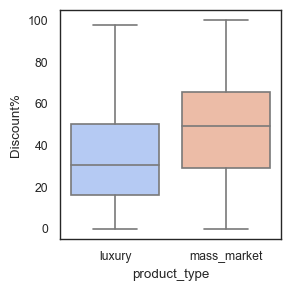

In [214]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(3, 3), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

sns.boxplot(x='product_type', y='Discount%', palette='coolwarm', data=product_sub)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### The median discount percentage offered for luxury items is less compared to that of Mass Market Products.

*This is a known trend among luxury products or luxury brands to offer limited or no discounts to retain the exclusivity of their products.*

### Displaying trend of NPS and Stock Index by week

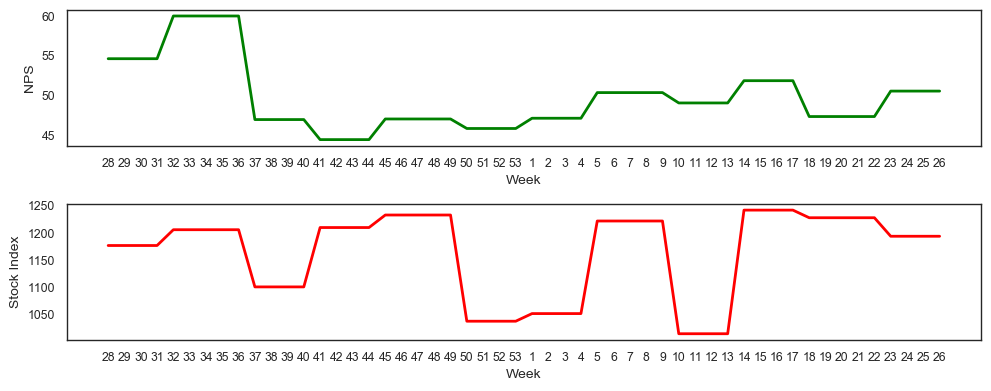

In [215]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(2, 1, 1)
plt.plot(net_promoter_score.iloc[:,0], net_promoter_score.iloc[:,1], 'g-', linewidth=2)
plt.xlabel('Week', fontsize=10);
plt.ylabel('NPS', fontsize=10);

# subplot 2
plt.subplot(2, 1, 2)
plt.plot(net_promoter_score.iloc[:,0], net_promoter_score.iloc[:,4], 'r-', linewidth=2)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Stock Index', fontsize=10);

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

*Consumer NPS score is highest in weeks 32 – 35 , which coincides with the time when maximum discounts were being offered.*

### Displaying trend of various Media Channel Investments by week

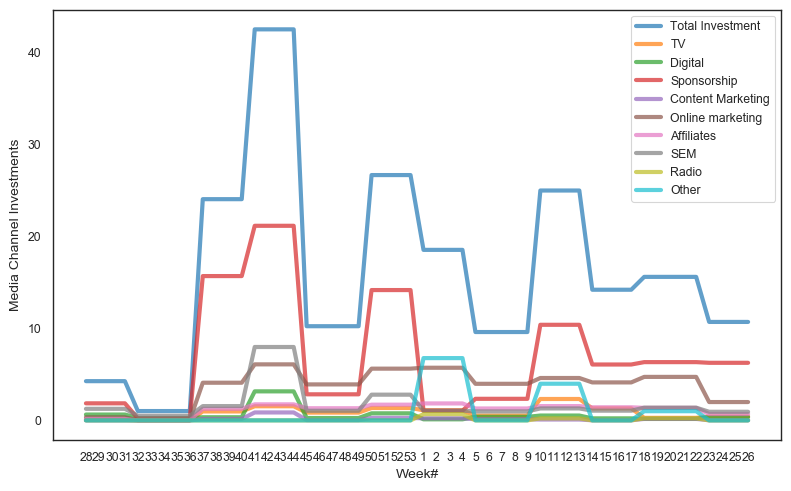

In [216]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(8, 5), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 1, 1)
plt.plot(media_investment.iloc[:,0], media_investment.iloc[:,1::5], linewidth=3, alpha = 0.7)
plt.xlabel('Week#', fontsize=10)
plt.ylabel('Media Channel Investments', fontsize=10)
plt.legend(media_investment.iloc[:,1::5])
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

*Over the past year, bulk of the Ad Investment has been made in Sponsorships followed by Online Marketing & Search Engine Marketing(specially during Thanksgiving).*

### Average Revenue from Holiday/Non-holiday days for the 3 product subcategories

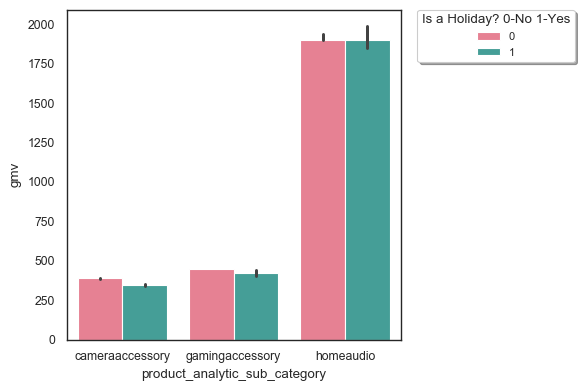

In [217]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(6,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

sns.barplot(y='gmv', x='product_analytic_sub_category', hue ='occassion_flag', \
            palette='husl', data=product_sub, estimator=np.median)

# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Is a Holiday? 0-No 1-Yes', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### The average(median) revenue for 3 product sub categories from holiday and non-holiday days are more or less comparable.

### No of items(Luxury/Mass-market) sold per 3 product subcategories

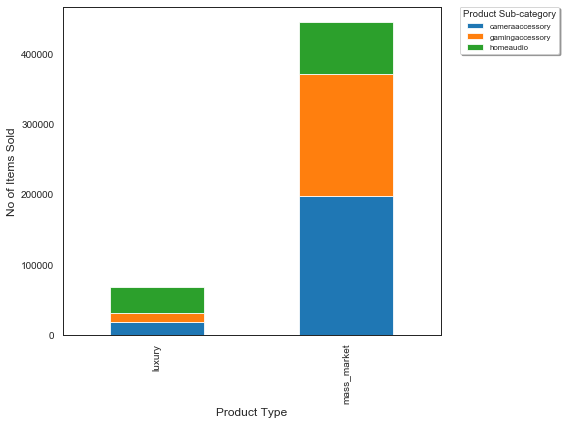

In [218]:
product_sub.groupby(["product_type", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', \
                                                                                             stacked=True, figsize=(8,6), \
                                                                                             fontsize = 10) 
# plot x axis label
plt.xlabel('Product Type', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### From the above graph, we have the following observations:
 - Most of the units sold belonged to the mass market category. 
 - Among mass market products sold, Camera and Gaming Accessories related products were sold the most. 
 - Home Audio products were the most popular among the luxury products sold

### Total items sold per 3 product subcategories per Month

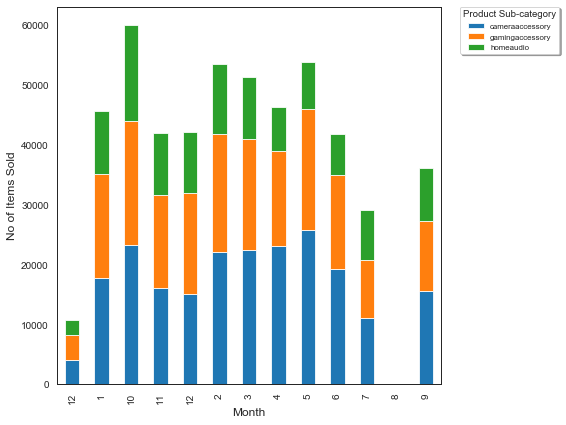

In [219]:
product_sub.groupby(["Month", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', \
                                                                                             stacked=True, figsize=(8,6), \
                                                                                           fontsize = 10) 
# plot x axis label
plt.xlabel('Month', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

### Total items sold per 3 product subcategories per Week

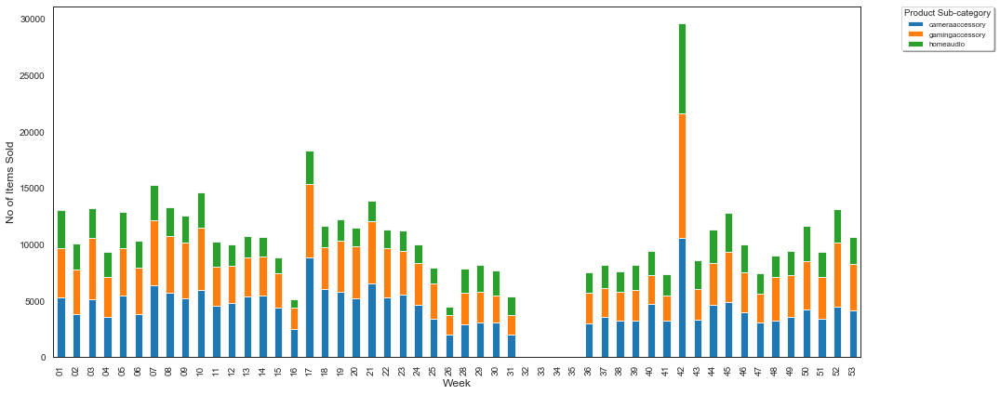

In [220]:
product_sub.groupby(["Week", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', \
                                                                                             stacked=True, figsize=(15,6), \
                                                                                           fontsize = 10) 
# plot x axis label
plt.xlabel('Week', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### The sale on the 42nd week (`Thanksgiving week`) is maximum. Overall, October has seen most no of items being sold.

### Top 10 Product Verticals which brought the Maximum Revenue for 3 product sub-categories

In [221]:
highest_gmv = pd.DataFrame(product_sub.groupby(['product_analytic_sub_category','product_analytic_vertical'])['gmv'].sum().sort_values(ascending=False).reset_index()).head(10)
highest_gmv['product_in_category'] = highest_gmv[['product_analytic_vertical','product_analytic_sub_category']].apply(lambda x: ' in '.join(x), axis=1)
highest_gmv.head(20)

,product_analytic_sub_category,product_analytic_vertical,gmv,product_in_category
0,homeaudio,homeaudiospeaker,1.873206e+08,homeaudiospeaker in homeaudio
1,cameraaccessory,lens,1.085308e+08,lens in cameraaccessory
2,gamingaccessory,gamepad,6.187440e+07,gamepad in gamingaccessory
3,gamingaccessory,gamingheadset,3.199049e+07,gamingheadset in gamingaccessory
4,cameraaccessory,binoculars,2.658427e+07,binoculars in cameraaccessory
5,gamingaccessory,gamingmouse,2.632837e+07,gamingmouse in gamingaccessory
6,cameraaccessory,camerabattery,2.356174e+07,camerabattery in cameraaccessory
7,cameraaccessory,camerabag,2.249499e+07,camerabag in cameraaccessory
8,cameraaccessory,flash,2.228150e+07,flash in cameraaccessory
9,homeaudio,fmradio,2.222170e+07,fmradio in homeaudio


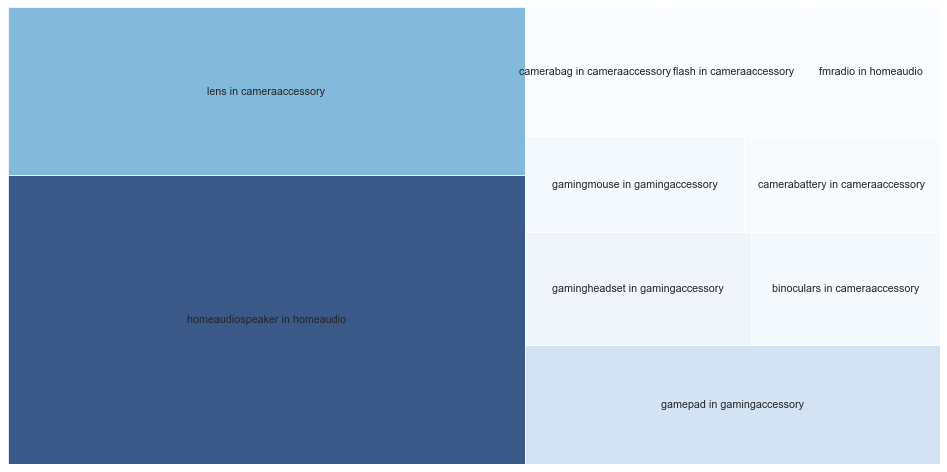

In [222]:
import squarify    # pip install squarify (algorithm for treemap)
# Create a dataset:
my_values=list(highest_gmv['gmv'])
 
plt.figure(figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')    
# create a color palette, mapped to these values
cmap = matplotlib.cm.Blues
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]
 
# Change color
squarify.plot(sizes=my_values, alpha=.8, label=highest_gmv['product_in_category'],color=colors)
plt.axis('off')

# Show graphic
plt.tight_layout()
plt.show()

#### `homeaudiospeaker in homeaudio` brought the largest revenue followed by `lens in cameraaccessory` & `gamepad in gamingaccessory`.

### Top 10 Product Verticals with most no of sales for 3 product sub-categories

In [223]:
most_sales = pd.DataFrame(product_sub.groupby(['product_analytic_sub_category','product_analytic_vertical'])['units'].count().sort_values(ascending=False).reset_index()).head(10)
most_sales['product_in_category'] = most_sales[['product_analytic_vertical','product_analytic_sub_category']].apply(lambda x: ' in '.join(x), axis=1)
most_sales.head(20)

,product_analytic_sub_category,product_analytic_vertical,units,product_in_category
0,homeaudio,homeaudiospeaker,76581,homeaudiospeaker in homeaudio
1,gamingaccessory,gamingheadset,59928,gamingheadset in gamingaccessory
2,gamingaccessory,gamepad,52437,gamepad in gamingaccessory
3,cameraaccessory,flash,47808,flash in cameraaccessory
4,gamingaccessory,gamingmouse,35470,gamingmouse in gamingaccessory
5,cameraaccessory,camerabattery,35107,camerabattery in cameraaccessory
6,cameraaccessory,lens,32350,lens in cameraaccessory
7,cameraaccessory,cameratripod,31220,cameratripod in cameraaccessory
8,homeaudio,fmradio,24681,fmradio in homeaudio
9,cameraaccessory,camerabag,15842,camerabag in cameraaccessory


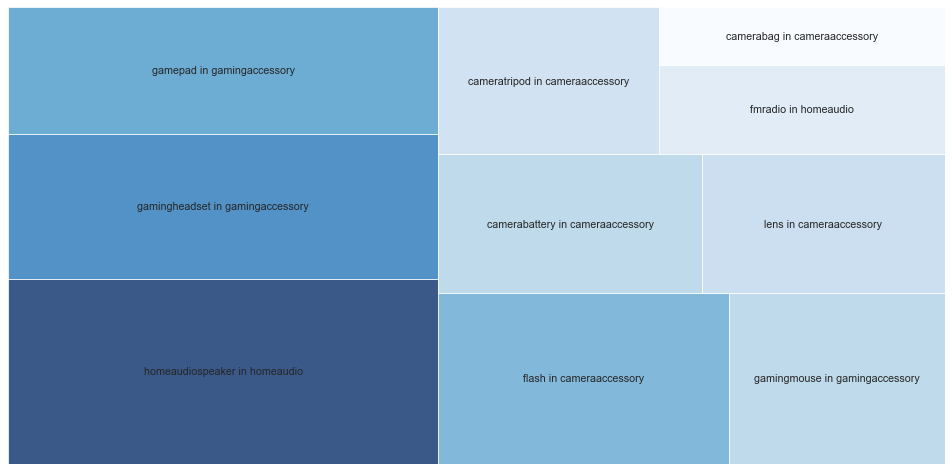

In [224]:
import squarify    # pip install squarify (algorithm for treemap)
# Create a dataset:
my_values=list(most_sales['units'])
 
plt.figure(figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')    
# create a color palette, mapped to these values
cmap = matplotlib.cm.Blues
mini=min(my_values)
maxi=max(my_values)
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
colors = [cmap(norm(value)) for value in my_values]
 
# Change color
squarify.plot(sizes=my_values, alpha=.8, label=most_sales['product_in_category'],color=colors)
plt.axis('off')

# Show graphic
plt.tight_layout()
plt.show()

#### `homeaudiospeaker in homeaudio` had the most no of sales followed by  `gamingheadset & gamepad in gamingaccessory`.

### Comparison of Trends of Revenue Discount% & Total Media Investment over the weeks

In [225]:
cameraaccessory = cameraaccessory_df.copy()
gamingaccessory = gamingaccessory_df.copy()
homeaudio = homeaudio_df.copy()

cameraaccessory['Week'] = cameraaccessory['Week'].apply(str)
gamingaccessory['Week'] = gamingaccessory['Week'].apply(str)
homeaudio['Week'] = homeaudio['Week'].apply(str)

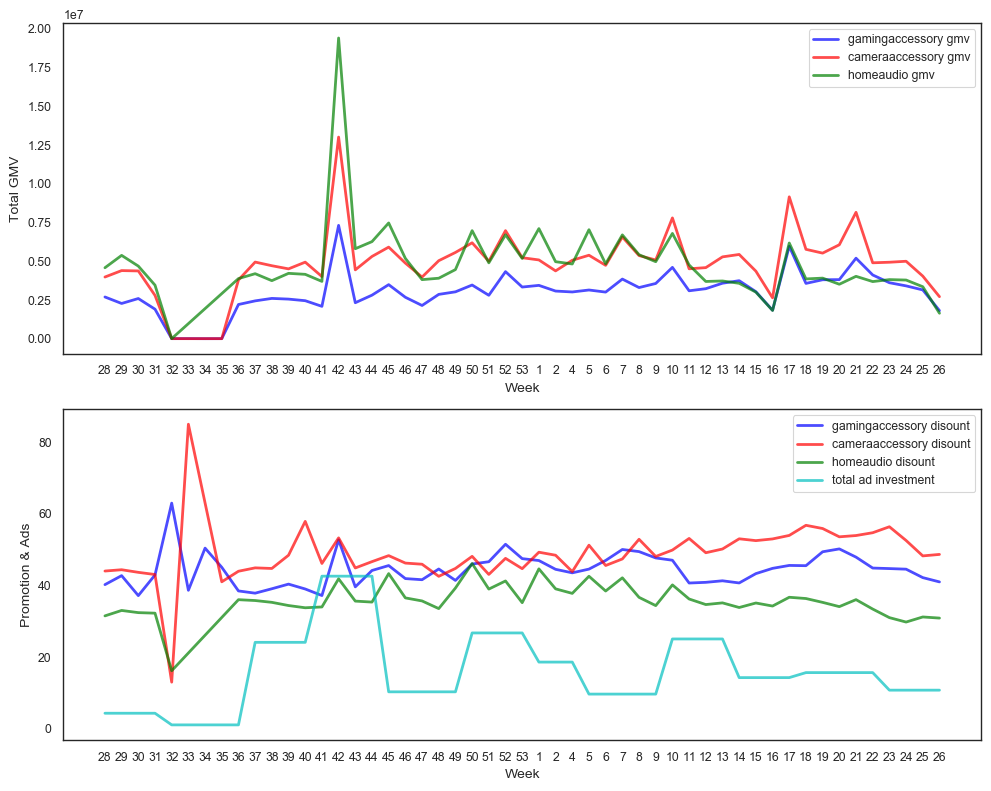

In [226]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 8), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(2, 1, 1)
plt.plot(gamingaccessory.iloc[:,0], gamingaccessory.iloc[:,1], 'b-', linewidth=2, alpha=0.7)
plt.plot(cameraaccessory.iloc[:,0], cameraaccessory.iloc[:,1], 'r-', linewidth=2, alpha=0.7)
plt.plot(homeaudio.iloc[:,0], homeaudio.iloc[:,1], 'g-', linewidth=2, alpha=0.7)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Total GMV', fontsize=10);
plt.legend(['gamingaccessory gmv','cameraaccessory gmv','homeaudio gmv'])

# subplot 2
plt.subplot(2, 1, 2)
plt.plot(gamingaccessory.iloc[:,0], gamingaccessory.iloc[:,2], 'b-', linewidth=2, alpha=0.7)
plt.plot(cameraaccessory.iloc[:,0], cameraaccessory.iloc[:,2], 'r-', linewidth=2, alpha=0.7)
plt.plot(homeaudio.iloc[:,0], homeaudio.iloc[:,2], 'g-', linewidth=2, alpha=0.7)
plt.plot(homeaudio.iloc[:,0], homeaudio.iloc[:,21], 'c-', linewidth=2, alpha=0.7)
plt.xlabel('Week', fontsize=10);
plt.ylabel('Promotion & Ads', fontsize=10);
plt.legend(['gamingaccessory disount','cameraaccessory disount','homeaudio disount','total ad investment'])

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### The following observations were noted from the above time series plots:

 - For the week# 42 (during `Thanksgiving`), all the graphs show a steep rise. Revenue increased becuase of both higher discount% and increased Ad Investment.

 - For the week 32(August), Revenue generated was the lowest from all 3 product subcategories. This can be observed as a direct relation to minimum amount of total investment in Ads. Discount was also lowest for all products apart from camera accessories. Post this dip in revenue, discount% was increased to bring about higher sales. This increase in Discount% was observed most in the case of gaming accessories. However, barring home audio products, the revenue from other products was seen to be constant for the next 3 weeks after which, the revenue started to pick up.

 - In general the average disount% offered for home audio products is lesser compared to that of the other product subcategories.

### Analyzing how Sales Amount and Revenue vary based on Discount%

In [227]:
# Segmenting the Discount% into various bins

def discount_binning(df,cut_points,label_names):
    column_index = df.columns.get_loc('Discount%') + 1
    df.insert(loc=column_index,column='Discount Bins',value=pd.cut(df['Discount%'],cut_points,labels=label_names, include_lowest=True))
    return df

cut_points = [0,10,20,30,40,50,60,70,80,90,100]
label_names = ["Below 10%","Between 10-20%","Between 20-30%","Between 30-40%","Between 40-50%","Between 50-60%", \
              "Between 60-70%","Between 70-80%","Between 80-90%","Between 90-100%"]

product_sub = discount_binning(product_sub,cut_points,label_names)
product_sub.head()

,order_date,Year,Month,Week,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag,product_type
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,10.99,Between 10-20%,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,4.03,Below 10%,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,5.19,Below 10%,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,19.49,Between 10-20%,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0,mass_market
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,22.92,Between 20-30%,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market


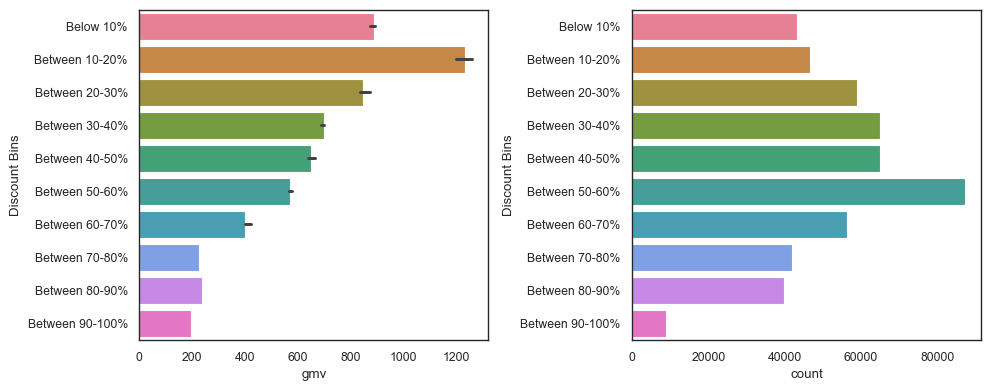

In [228]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 2, 1)
sns.barplot(x='gmv', y='Discount Bins', palette='husl', data=product_sub, estimator=np.median)

# subplot 2
plt.subplot(1, 2, 2)
sns.countplot(y='Discount Bins', palette='husl', data=product_sub)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

 - Median Revenue is maximum when Average discount% is between 10-20%. But beyond that, average revenue slowly starts to decline. 

 - The sales on the other hand shows a steady increase with increase in Discount percentage till it peaks at 50-60% after which it starts to fall again. 

#### This shows that at higher discount, although the sales are good, the revenue collapses signifying a loss for the company. An average discount of 10-20% is the most profitable for the company.

### Percentage of items sold at different Discount% segments

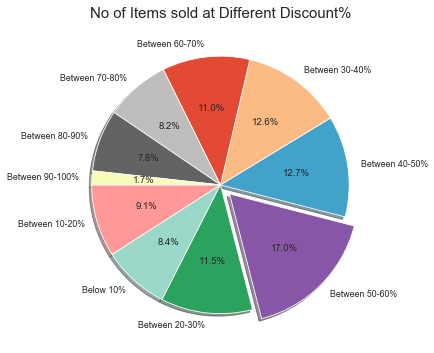

In [229]:
from collections import Counter

labels, values = zip(*Counter(product_sub["Discount Bins"]).items())
colors = ["#ff9999", "#99d8c9", "#2ca25f", "#8856a7","#43a2ca","#fdbb84","#e34a33","#bdbdbd","#636363","#f7fcb9"]
piechart_df = (pd.DataFrame(list(values),list(labels)))
piechart_df = piechart_df.reset_index()

fig = plt.figure(figsize=[6,6])

plt.pie(piechart_df[0],labels=piechart_df["index"],startangle=180,explode=(0,0,0,0.1,0,0,0,0,0,0),autopct="%1.1f%%", \
        shadow=True, colors=colors)
plt.tight_layout()
plt.title("No of Items sold at Different Discount%", fontsize=15)
plt.show()

#### Most of the sales take place when Discount% is between 50-60%.

### Analyzing how Sales Amount and Revenue vary based on Payment Types

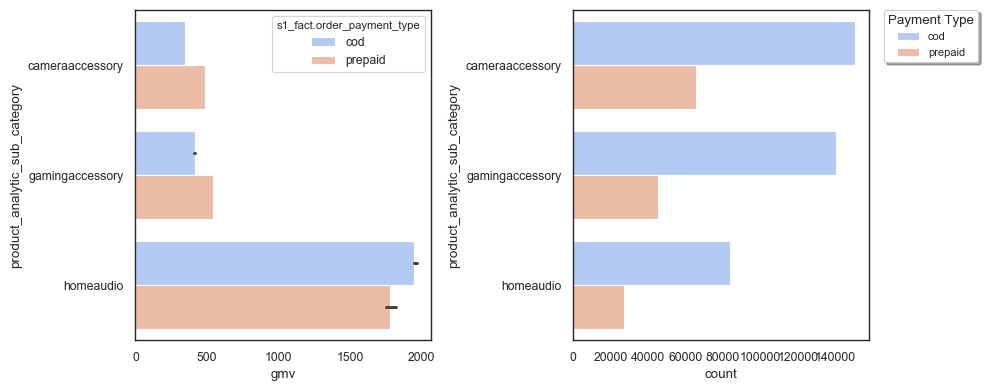

In [230]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 2, 1)
sns.barplot(x='gmv', y='product_analytic_sub_category', hue ='s1_fact.order_payment_type', \
            palette='coolwarm', data=product_sub, estimator=np.median)

# subplot 2
plt.subplot(1, 2, 2)
sns.countplot(y='product_analytic_sub_category', hue ='s1_fact.order_payment_type', palette='coolwarm', data=product_sub)

# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Payment Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### Except for Home Audio Products, for the other 2 product sub categories, we observe that the median Revenue from Prepaid orders is more than that from COD products even though the no of products sold is way higher in case of COD products for all categories.

### Finding the percentage of Luxury & Mass-market Products from 3 sub-categories

In [231]:
product_sub['luxury'] = product_sub['product_type'].apply(lambda x:1 if x=='luxury' else 0)
product_sub['mass_market'] = product_sub['product_type'].apply(lambda x:1 if x=='mass_market' else 0)
product_sub.head()

,order_date,Year,Month,Week,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag,product_type,luxury,mass_market
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,10.99,Between 10-20%,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury,1,0
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,4.03,Below 10%,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury,1,0
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,5.19,Below 10%,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market,0,1
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,19.49,Between 10-20%,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0,mass_market,0,1
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,22.92,Between 20-30%,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market,0,1


In [232]:
product_type = pd.DataFrame(product_sub.groupby('product_analytic_sub_category')['luxury','mass_market'].sum().reset_index())
product_type

,product_analytic_sub_category,luxury,mass_market
0,cameraaccessory,18423,197478
1,gamingaccessory,13007,172869
2,homeaudio,36747,74314


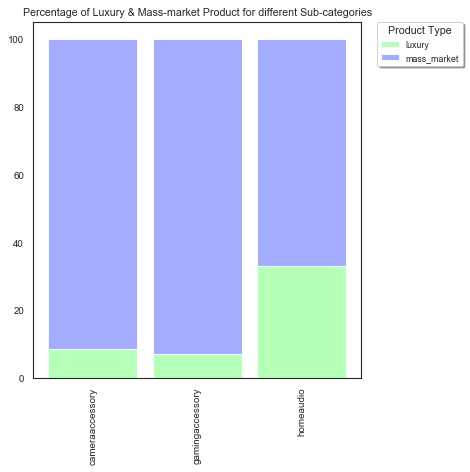

In [233]:
# From raw value to percentage
r = [0,1,2]
totals = [i+j for i,j in zip(product_type['luxury'], product_type['mass_market'])]
luxury = [i / j * 100 for i,j in zip(product_type['luxury'], totals)]
mass_market = [i / j * 100 for i,j in zip(product_type['mass_market'], totals)]
names = list(product_type['product_analytic_sub_category'])

# plot
# adjust figure size
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k')

barWidth = 0.85
# Create Luxury Bars
plt.bar(r, luxury, color='#b5ffb9', edgecolor='white', width=barWidth)
# Create mass_market Bars
plt.bar(r, mass_market, bottom=[i for i in luxury], color='#a3acff', edgecolor='white', width=barWidth)
# Custom x axis
plt.xticks(r, names, rotation='vertical')
plt.legend(['luxury','mass_market'],frameon=True, fontsize='small', shadow='True', title='Product Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Percentage of Luxury & Mass-market Product for different Sub-categories")

# Show graphic
plt.tight_layout()
plt.show()

#### Percentage of luxury products under HomeAudio is much more compared to the other sub categories.

### Finding the percentage of COD & Prepaid Products from 3 sub-categories

In [234]:
product_sub['prepaid'] = product_sub['s1_fact.order_payment_type'].apply(lambda x:1 if x=='prepaid' else 0)
product_sub['cod'] = product_sub['s1_fact.order_payment_type'].apply(lambda x:1 if x=='cod' else 0)
product_sub.head()

,order_date,Year,Month,Week,gmv,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday_flag,occassion_flag,product_type,luxury,mass_market,prepaid,cod
0,2015-10-17 15:11:54,2015,10,42,6400.0,6400.0,10.99,Between 10-20%,1,0.0,0.0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury,1,0,0,1
1,2015-10-19 10:07:22,2015,10,43,6900.0,6900.0,4.03,Below 10%,1,0.0,0.0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,0,luxury,1,0,0,1
2,2015-10-20 15:45:56,2015,10,43,1990.0,1990.0,5.19,Below 10%,1,0.0,0.0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market,0,1,0,1
3,2015-10-14 12:05:15,2015,10,42,1690.0,1690.0,19.49,Between 10-20%,1,0.0,0.0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,1,0,mass_market,0,1,1,0
4,2015-10-17 21:25:03,2015,10,42,1618.0,1618.0,22.92,Between 20-30%,1,0.0,0.0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,0,mass_market,0,1,1,0


In [235]:
payment_type = pd.DataFrame(product_sub.groupby('product_analytic_sub_category')['prepaid','cod'].sum().reset_index())
payment_type

,product_analytic_sub_category,prepaid,cod
0,cameraaccessory,65462,150439
1,gamingaccessory,45273,140603
2,homeaudio,27123,83938


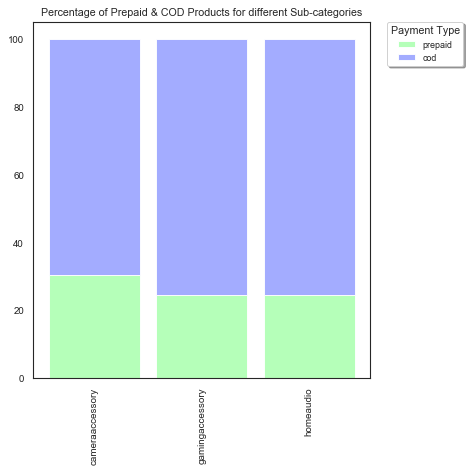

In [236]:
# From raw value to percentage
r = [0,1,2]
totals = [i+j for i,j in zip(payment_type['prepaid'], payment_type['cod'])]
prepaid = [i / j * 100 for i,j in zip(payment_type['prepaid'], totals)]
cod = [i / j * 100 for i,j in zip(payment_type['cod'], totals)]
names = list(payment_type['product_analytic_sub_category'])

# plot
# adjust figure size
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k')

barWidth = 0.85
# Create prepaid Bars
plt.bar(r, prepaid, color='#b5ffb9', edgecolor='white', width=barWidth)
# Create cod Bars
plt.bar(r, cod, bottom=[i for i in prepaid], color='#a3acff', edgecolor='white', width=barWidth)
# Custom x axis
plt.xticks(r, names, rotation='vertical')
plt.legend(['prepaid','cod'],frameon=True, fontsize='small', shadow='True', title='Payment Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Percentage of Prepaid & COD Products for different Sub-categories")

# Show graphic
plt.tight_layout()
plt.show()

#### Percentage of prepaid payments under Camera Accessory was observed to be slightly more compared to that of the other sub categories.

### Finding the percentage of Luxury and Mass_market Products under different Discount groups

In [237]:
product_type_with_discount = pd.DataFrame(product_sub.groupby('Discount Bins')['luxury','mass_market'].sum().reset_index())
product_type_with_discount

,Discount Bins,luxury,mass_market
0,Below 10%,9110,34093
1,Between 10-20%,14604,31972
2,Between 20-30%,10077,48907
3,Between 30-40%,8593,56255
4,Between 40-50%,7477,57617
5,Between 50-60%,13335,73808
6,Between 60-70%,4847,51506
7,Between 70-80%,68,41789
8,Between 80-90%,48,39781
9,Between 90-100%,18,8933


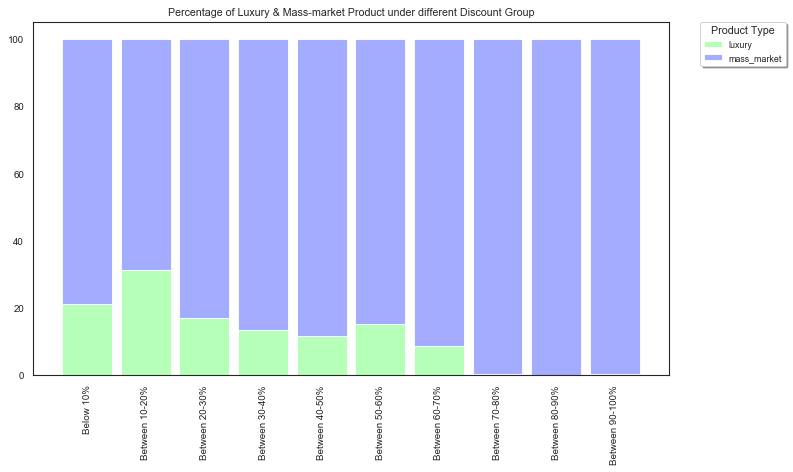

In [238]:
# From raw value to percentage
r = [0,1,2,3,4,5,6,7,8,9]
totals = [i+j for i,j in zip(product_type_with_discount['luxury'], product_type_with_discount['mass_market'])]
luxury = [i / j * 100 for i,j in zip(product_type_with_discount['luxury'], totals)]
mass_market = [i / j * 100 for i,j in zip(product_type_with_discount['mass_market'], totals)]
names = list(product_type_with_discount['Discount Bins'])

# plot
# adjust figure size
plt.figure(figsize=(10,6), dpi=80, facecolor='w', edgecolor='k')

barWidth = 0.85
# Create Luxury Bars
plt.bar(r, luxury, color='#b5ffb9', edgecolor='white', width=barWidth)
# Create mass_market Bars
plt.bar(r, mass_market, bottom=[i for i in luxury], color='#a3acff', edgecolor='white', width=barWidth)
# Custom x axis
plt.xticks(r, names, rotation='vertical')
plt.legend(['luxury','mass_market'],frameon=True, fontsize='small', shadow='True', title='Product Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Percentage of Luxury & Mass-market Product under different Discount Group")

# Show graphic
plt.tight_layout()
plt.show()

#### Percentage of luxury products were given a discount between 10-20%. 

### Relationship between Revenue and Advertisement Spends

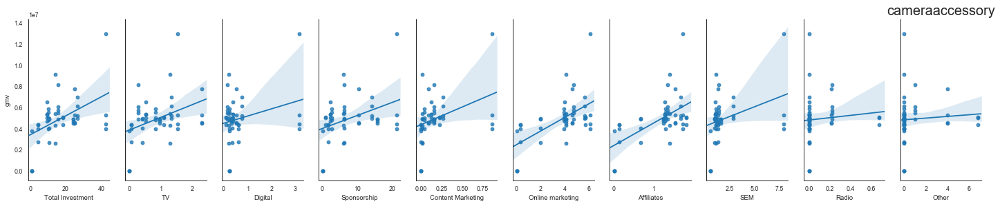

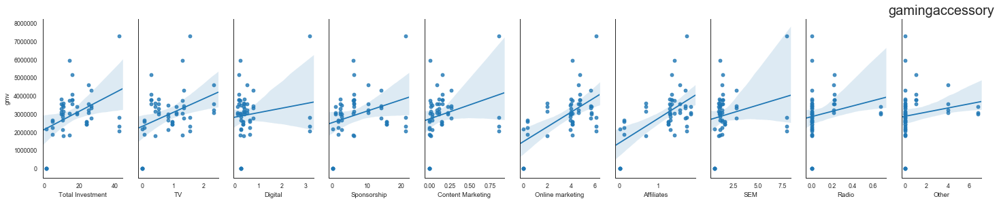

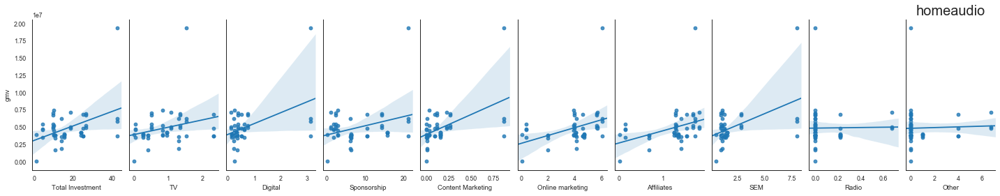

In [239]:
# Slightly alter the figure size to make it more horizontal.
#plt.figure(figsize=(10,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster


sns.pairplot(cameraaccessory, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('cameraaccessory', fontsize = 20)

sns.pairplot(gamingaccessory, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('gamingaccessory', fontsize = 20)

sns.pairplot(homeaudio, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',size=4, aspect=0.5, kind='reg')
plt.title('homeaudio', fontsize = 20)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

In [240]:
rev_ad_columns = ['gmv','Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', \
                  'Total_Investment_Ad_Stock', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_Ad_Stock', 'Digital', \
                  'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_Ad_Stock', 'Sponsorship', 'Sponsorship_SMA_3', \
                  'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_Ad_Stock', 'Content Marketing', \
                  'Content Marketing_SMA_3','Content Marketing_SMA_5','Content Marketing_EMA_8', 'Content_Marketing_Ad_Stock', \
                  'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', \
                  'Online_marketing_Ad_Stock', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', \
                  'Affiliates_Ad_Stock', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_Ad_Stock', 'Radio', 'Radio_SMA_3', \
                  'Radio_SMA_5', 'Radio_EMA_8', 'Radio_Ad_Stock', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', \
                  'Other_Ad_Stock']

In [241]:
cameraaccessory_ad = cameraaccessory[rev_ad_columns]
gamingaccessory_ad = gamingaccessory[rev_ad_columns]
homeaudio_ad = homeaudio[rev_ad_columns]
homeaudio_ad.head()

,gmv,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock
25,4.573783e+06,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26,5.371525e+06,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27,4.679828e+06,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,3.451151e+06,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,2.599000e+03,1.013,3.181,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307,1.5258,1.489333,2.633582,0.0,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Relationship between Revenue and Various Ad Spends for Camera Accessories

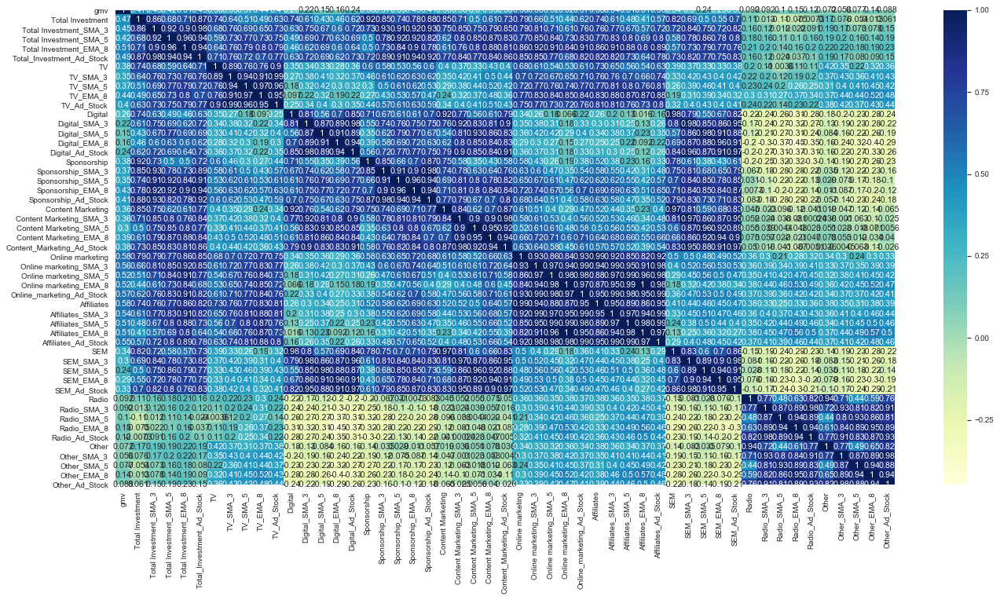

In [242]:
plt.figure(figsize=(20,10), dpi=80, facecolor='w', edgecolor='k', frameon='True')
cam_cor = cameraaccessory_ad.corr()
sns.heatmap(cam_cor, cmap="YlGnBu", annot=True)
plt.show()

### Relationship between Revenue and Various Ad Spends for Gaming Accessories

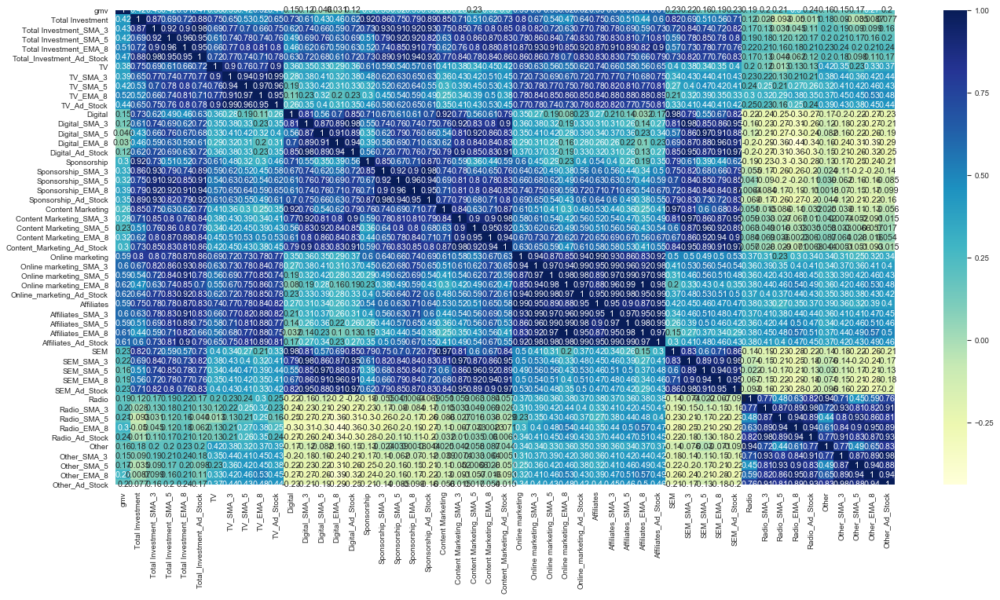

In [243]:
plt.figure(figsize=(20,10), dpi=80, facecolor='w', edgecolor='k', frameon='True')
gam_cor = gamingaccessory_ad.corr()
sns.heatmap(gam_cor, cmap="YlGnBu", annot=True)
plt.show()

### Relationship between Revenue and Various Ad Spends for Home Audio

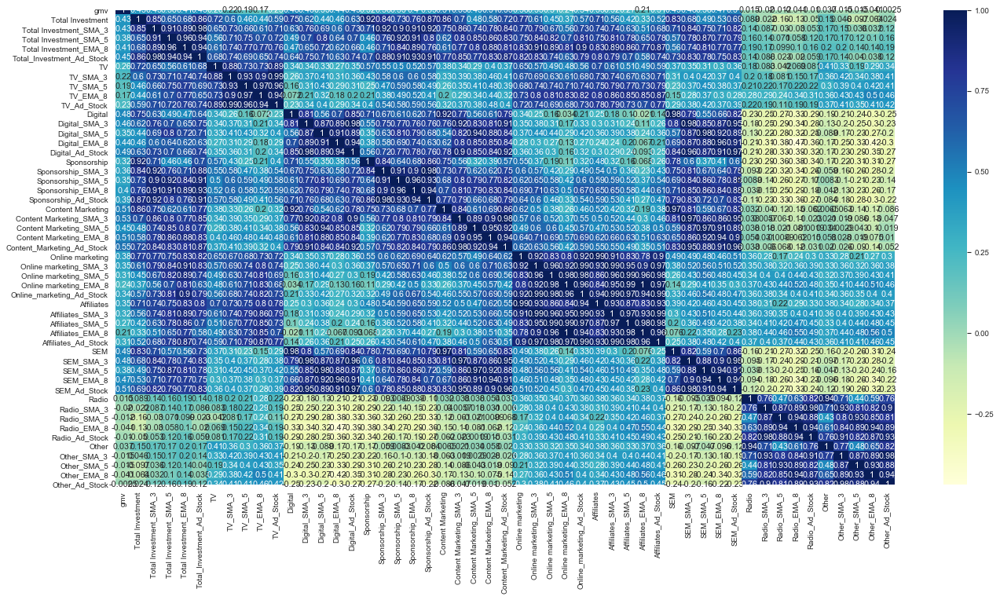

In [244]:
plt.figure(figsize=(20,10), dpi=80, facecolor='w', edgecolor='k', frameon='True')
ha_cor = homeaudio_ad.corr()
sns.heatmap(ha_cor, cmap="YlGnBu", annot=True)
plt.show()

# Building Linear Regression Models

## Additive Model

#### Linear model assumes an additive relationship between the different KPIs. Hence their impacts are also additive towards the dependent Y variable.

#### The equation can be represented as:

						Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ


In [245]:
# making a copy of original dataframes
cameraaccessory_org_df = cameraaccessory_df.copy()
gamingaccessory_org_df = gamingaccessory_df.copy()
homeaudio_org_df = homeaudio_df.copy()
homeaudio_org_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4.573783e+06,31.450813,0.0,0.0,7.369201,2.863223,1583,1366,8,33,1,516.0,23,1374.0,0,0,0,63,0,0,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0,0
26,29,5.371525e+06,32.966657,0.0,0.0,6.984861,2.746318,1868,1610,7,50,1,574.0,42,1623.0,0,0,0,69,1,0,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,0.000000,0.000000,1177.0,0.000000,0.0,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0,2
27,30,4.679828e+06,32.357350,0.0,0.0,7.071749,2.860538,1758,1569,4,56,0,577.0,36,1430.0,0,0,0,46,0,0,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,31.5,14.5,23.060000,0.000000,5.060000,1.080000,0.0,1.080000,0.0,0
28,31,3.451151e+06,32.207530,0.0,0.0,7.200750,2.734834,1244,1072,2,43,0,420.0,20,1025.0,0,0,0,44,1,0,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,54.599588,54.599588,0.000000,1177.0,1177.000000,0.0,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0,0
29,32,2.599000e+03,16.130000,0.0,0.0,9.000000,2.000000,0,0,0,0,0,0.0,0,1.0,0,0,0,0,0,0,1.013,3.181,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307,1.5258,1.489333,2.633582,0.0,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,59.987101,56.395426,55.677091

In [246]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(gamingaccessory_org_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(gamingaccessory_org_df.isnull().sum()/gamingaccessory_org_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale,0,0.0
product_vertical_tvoutcableaccessory,0,0.0
holiday_week,0,0.0
Total Investment,0,0.0
Total Investment_SMA_3,0,0.0


## Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

#### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [247]:
# removing columns
cameraaccessory_df = cameraaccessory_df.drop('Week', axis=1)
gamingaccessory_df = gamingaccessory_df.drop('Week', axis=1)
homeaudio_df = homeaudio_df.drop('Week', axis=1)

In [248]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_df[cameraaccessory_df.columns]=scaler.fit_transform(cameraaccessory_df[cameraaccessory_df.columns])
gamingaccessory_df[gamingaccessory_df.columns]=scaler.fit_transform(gamingaccessory_df[gamingaccessory_df.columns])
homeaudio_df[homeaudio_df.columns]=scaler.fit_transform(homeaudio_df[homeaudio_df.columns])

cameraaccessory_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,-0.463986,-0.568488,-0.621962,-0.622705,0.975873,0.285022,-0.682393,-0.752433,0.406002,0.158350,0.000000,-0.413214,2.553918,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-1.137094,0.707957,-0.429629,-0.879137,-0.032741,-1.205263,-0.204124,-0.439768,-0.193247,-0.428571,-1.309203,-0.142857,-0.997060,-1.083473,-0.531085,-1.138791,-1.631086,-1.699859,-1.633405,-1.649491,-1.251808,-1.419631,-1.491854,-1.652729,-1.518317,0.060467,-0.830498,-0.901105,0.077377,-0.554946,-0.868524,-1.264503,-1.318554,-1.299296,-1.278783,-0.696231,-0.794039,-0.910286,-1.146903,-0.916735,-1.849822,-2.030452,-2.004557,-1.933248,-2.030119,-1.887653,-2.094357,-2.029475,-1.901528,-2.051610,-0.283006,-1.038332,-1.119630,-0.486269,-0.870528,-0.464728,-0.568343,-0.656871,-0.816574,-0.666236,-0.444639,-0.540838,-0.63299,-0.787503,-0.637838,1.241485,-4.575500,-3.282764,0.138750,-4.698897,-3.338503,0.737609,1.051735,0.904298,-0.994318,0.392712,0.452202,-0.359762,0.347311,-0.269021,-0.478426
26,-0.261122,-0.524957,-0.621962,-0.622705,0.194883,0.370449,-0.599711,-0.648998,-0.266187,0.323447,0.215047,-0.399653,0.483174,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-0.654105,0.728597,-0.287038,-0.879137,-0.306924,-1.203913,-0.204124,-0.324809,-0.193247,-0.428571,-0.505563,-0.142857,-0.647623,0.922958,-0.531085,-1.138791,-1.631086,-1.699859,-1.633405,-1.532676,-1.251808,-1.419631,-1.491854,-1.652729,-1.494622,0.060467,-0.830498,-0.901105,0.077377,-0.290548,-0.868524,-1.264503,-1.318554,-1.299296,-1.188393,-0.696231,-0.794039,-0.910286,-1.146903,-0.916735,-1.849822,-2.030452,-2.004557,-1.933248,-1.984615,-1.887653,-2.094357,-2.029475,-1.901528,-1.990966,-0.283006,-1.038332,-1.119630,-0.486269,-0.660863,-0.464728,-0.568343,-0.656871,-0.816574,-0.666236,-0.444639,-0.540838,-0.63299,-0.787503,-0.637838,1.241485,-4.575500,-3.282764,0.138750,-4.698897,-3.338503,1.269795,0.882827,1.256121,-1.034268,1.651885,-0.413172,-0.359762,-0.459971,-0.269021,0.814617
27,-0.271684,-0.611923,-0.620334,-0.619954,0.221648,0.511811,-0.586375,-0.662790,0.540440,-0.114420,0.287886,-0.114865,1.173422,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-0.930099,0.026832,-0.358333,-0.879137,-0.306924,-1.198514,-0.204124,-0.17877

## Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [249]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_train, cameraaccessory_test = train_test_split(cameraaccessory_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_train, gamingaccessory_test = train_test_split(gamingaccessory_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_train, homeaudio_test = train_test_split(homeaudio_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the 3 dataframes into X and Y sets for the model building

In [250]:
y_cameraaccessory_train = cameraaccessory_train.pop('gmv')
X_cameraaccessory_train = cameraaccessory_train

y_gamingaccessory_train = gamingaccessory_train.pop('gmv')
X_gamingaccessory_train = gamingaccessory_train

y_homeaudio_train = homeaudio_train.pop('gmv')
X_homeaudio_train = homeaudio_train

X_cameraaccessory_train.head()

,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
0,0.060657,-0.621962,-0.622705,-0.497921,0.553036,0.893232,0.627852,0.540440,-0.222092,-0.381535,-0.155549,-0.897323,0.381098,-0.169421,-0.415704,3.958114,-0.533081,0.656865,-0.385971,0.380768,0.206217,-0.105319,1.488997,-0.204124,0.010750,-0.193247,-0.428571,-0.359446,-0.142857,-0.123468,-1.083473,-0.531085,0.186504,0.776833,0.987797,0.863692,0.704290,0.354300,0.677298,0.802561,0.729798,0.657683,-0.605542,-0.025604,0.163219,0.064486,-0.158850,-0.997170,0.476156,0.908352,0.606863,0.225891,0.307176,0.494556,0.605060,0.628475,0.480500,1.062276,1.065636,1.085006,0.986779,1.059869,1.168223,1.032135,1.011728,0.949932,1.043430,-0.391566,0.275496,0.505240,0.448532,0.169488,3.459358,1.031321,0.382238,0.681314,1.525878,3.205892,0.939272,0.342332,0.586754,1.393930,-0.598617,-0.115920,0.048808,-1.446603,-0.319129,-0.095847,-1.071822,-1.932310,-1.381597,1.494331,-0.679084,1.441884,2.654145,1.894972,-0.269021,-0.478426
1,-0.040097,-0.620341,-0.621199,0.437612,-0.028840,0.045075,-0.197331,0.540440,-0.336942,-0.770007,-0.365749,0.023008,0.021572,0.152264,-0.415704,-0.252646,-0.533081,0.035879,-0.633653,-0.087409,0.206217,-0.048869,0.240405,-0.204124,-0.377628,-0.193247,-0.428571,0.371136,-0.142857,-0.356426,0.922958,-0.531085,0.186504,0.504406,0.813250,0.755053,0.531642,0.354300,0.536876,0.712778,0.690811,0.572284,-0.605542,-0.344432,-0.055139,-0.199758,-0.414193,-0.997170,-0.300930,0.402233,0.136855,-0.350919,0.307176,0.423250,0.555838,0.610571,0.453296,1.062276,1.083691,1.095841,1.051716,1.101323,1.168223,1.112439,1.059082,1.038233,1.123928,-0.391566,-0.069779,0.273401,0.198646,-0.094166,3.459358,2.630985,1.421348,1.846339,2.841147,3.205892,2.419383,1.317654,1.655621,2.612992,-0.598617,-0.074344,0.067514,-1.446603,-0.299527,-0.087123,-1.763663,-1.707099,-1.815194,2.030130,-0.679084,-0.088059,-0.359762,-0.156683,6.323587,-0.478426
10,0.043235,-0.420785,-0.405268,-0.666914,-0.470323,0.223108,0.396272,-0.736719,-0.164667,1.359652,1.485374,-0.437157,0.021572,0.188007,-0.415704,-0.252646,2.730682,0.656865,-0.117649,-0.296544,0.748895,-0.355309,0.486074,-0.204124,-0.455304,-0.193247,-0.428571,0.955601,-0.142857,0.983082,-1.083473,1.882938,0.785597,0.880521,0.321637,0.463286,0.648741,2.25200

## Dividing into X and Y test sets for the model building for 3 dataframes

In [251]:
y_cameraaccessory_test = cameraaccessory_test.pop('gmv')
X_cameraaccessory_test = cameraaccessory_test

y_gamingaccessory_test = gamingaccessory_test.pop('gmv')
X_gamingaccessory_test = gamingaccessory_test

y_homeaudio_test = homeaudio_test.pop('gmv')
X_homeaudio_test = homeaudio_test

X_cameraaccessory_test.head()

,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
31,-0.928400,-0.621962,-0.622705,4.262882,-1.795333,-1.954629,-2.215467,-2.686066,-2.231974,-2.393266,-1.925303,-1.587571,-0.697481,-1.277445,-0.415704,-0.252646,-0.533081,-1.413087,-2.202304,-1.463421,-0.879137,-1.806869,-1.240358,-0.204124,-1.949783,-0.193247,-0.428571,-2.258960,-0.142857,-1.928891,0.922958,-0.531085,-1.440518,-1.529340,-1.521451,-1.923297,-1.688655,-1.333579,-1.417973,-1.471353,-1.723976,-1.545080,-0.423320,-0.454946,-0.346170,-0.476226,-0.483543,-1.131096,-1.226673,-1.214215,-1.569611,-1.349286,-0.696231,-0.794039,-0.910286,-1.146903,-0.916735,-2.015055,-2.016227,-1.956838,-2.048812,-2.071647,-2.106313,-2.067589,-1.960372,-2.048923,-2.100098,-0.679831,-0.739753,-0.685445,-0.925896,-0.816907,-0.464728,-0.568343,-0.656871,-0.816574,-0.666236,-0.444639,-0.540838,-0.632990,-0.787503,-0.637838,2.562141,1.211033,0.978363,0.506552,0.366960,0.400771,0.844047,1.220643,0.921414,-0.928518,0.670030,-0.814782,-0.359762,-0.834621,-0.269021,1.461139
11,0.167884,0.429363,0.433071,-0.840190,-0.549591,-0.322326,0.691637,-0.871157,0.215775,1.383932,2.136318,-0.667240,0.381098,0.330978,-0.415704,-0.252646,3.274642,-0.447110,0.191953,-0.118304,0.748895,0.015645,0.711495,-0.204124,-0.138387,-0.193247,1.000000,0.078903,-0.142857,0.575406,0.922958,1.882938,0.785597,0.880521,0.651896,0.645360,0.793068,2.252007,2.436440,1.978224,1.895612,2.275711,-0.078124,-0.060323,-0.069539,-0.299714,-0.117269,0.498420,0.582069,0.375435,0.223249,0.471124,-0.281489,-0.320366,-0.334853,-0.287599,-0.340957,0.459661,0.491172,0.448575,0.570794,0.489299,0.652040,0.678799,0.604480,0.706007,0.660870,-0.260872,-0.267843,-0.300286,-0.494134,-0.344308,0.802606,0.981554,0.685504,1.008867,0.922381,1.703747,2.072356,1.662970,1.928511,2.008609,-0.126119,0.153167,0.281961,-1.915867,-0.435344,-0.047244,-0.539636,-0.918861,-0.605142,0.534860,-0.679084,-0.003366,0.341433,0.067598,-0.269021,-0.478426
12,0.508729,1.718407,1.722050,-0.439781,-0.662751,-1.803934,0.696234,-0.736719,0.158350,0.274012,0.590325,-0.437157,0.381098,0.116521,-0.415704,-0.252646,2.186721,0.449870,-0.385971,0.288083,0.748895,-0.298860,0.851877,-0.204124,0.094640,-0.193247,-0.428571,0.663368,-0.142857,0.750124,-1.083473,-0.531085,-0.215890,

## Building Linear Regression model for `cameraaccessory`

In [252]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_model = LinearRegression().fit(X_cameraaccessory_train, y_cameraaccessory_train)
y_cameraaccessory_test_pred = cameraaccessory_model.predict(X_cameraaccessory_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_test, y_cameraaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_test, y_cameraaccessory_test_pred)))

R2 Score: 0.8277391712124694
Mean Squared Error: 0.1704859186465254


##### With Simple Linear Regression, we get a r2 score of 0.83 and mse of 0.17

## Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [253]:
y_cameraaccessory = cameraaccessory_df.pop('gmv')
X_cameraaccessory = cameraaccessory_df

In [254]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_model_cv = LinearRegression().fit(X_cameraaccessory, y_cameraaccessory)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model_cv, X_cameraaccessory, y_cameraaccessory, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: -0.07749313506668831
Mean Squared Error: 1.0774931350666885


##### With Simple Linear Regression, using cross validation, we get a r2 score of -0.8 and mse score of 1.08

*Here R2 score is negative which signifies that the chosen model does not follow the trend of the data, so it fits worse than a horizontal line. It simply means the chosen model (with its constraints) fits the data really poorly.*

## Determining Feature Importance for `cameraaccessory` from model without cv

In [255]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_model.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', -0.043),
 ('Discount%', 0.015),
 ('deliverybdays', -0.047),
 ('deliverycdays', -0.047),
 ('sla', 0.005),
 ('product_procurement_sla', 0.035),
 ('is_cod', 0.032),
 ('is_mass_market', 0.074),
 ('product_vertical_cameraaccessory', 0.042),
 ('product_vertical_camerabag', 0.182),
 ('product_vertical_camerabattery', 0.2),
 ('product_vertical_camerabatterycharger', -0.072),
 ('product_vertical_camerabatterygrip', 0.09),
 ('product_vertical_cameraeyecup', -0.031),
 ('product_vertical_camerafilmrolls', -0.138),
 ('product_vertical_camerahousing', 0.171),
 ('product_vertical_cameraledlight', -0.037),
 ('product_vertical_cameramicrophone', -0.06),
 ('product_vertical_cameramount', 0.11),
 ('product_vertical_cameraremotecontrol', -0.108),
 ('product_vertical_cameratripod', -0.018),
 ('product_vertical_extensiontube', 0.065),
 ('product_vertical_filter', 0.105),
 ('product_vertical_flash', 0.018),
 ('product_vertical_flashshoeadapter', -0.007),
 ('product_vertical_lens', 0.432),
 ('pr

In [256]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
25,product_vertical_lens,0.432
10,product_vertical_camerabattery,0.200
9,product_vertical_camerabag,0.182
15,product_vertical_camerahousing,0.171
58,Online marketing,0.151
18,product_vertical_cameramount,0.110
63,Affiliates,0.107
22,product_vertical_filter,0.105
84,NPS_SMA_3,0.095
12,product_vertical_camerabatterygrip,0.090


## Plotting the Features in descending order of Importance for `cameraaccessory`

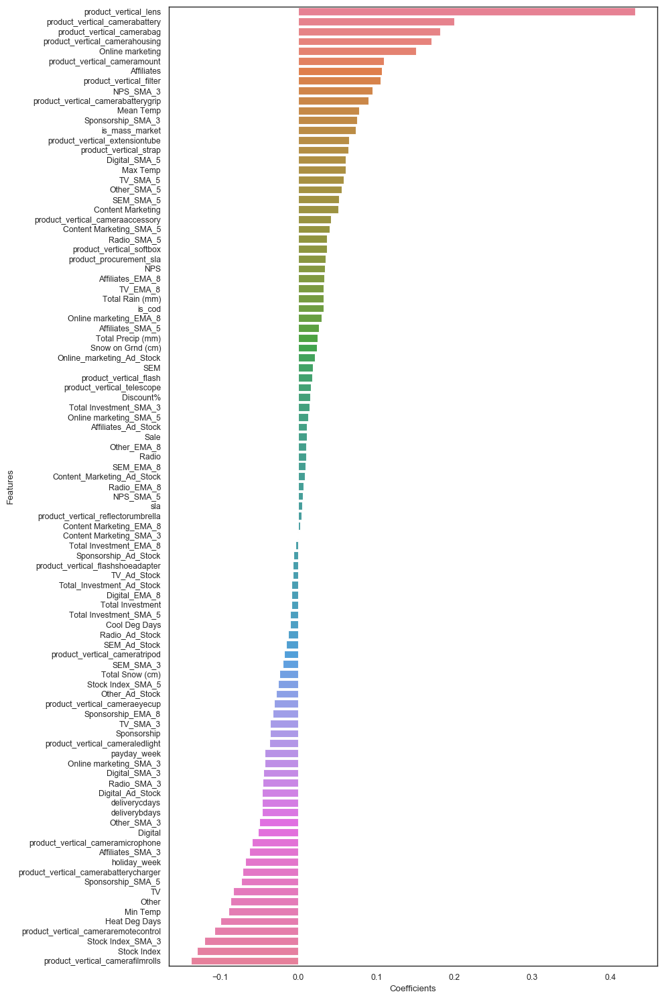

In [257]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:



|Features|Coefficients|
|--------|------------|
|product_vertical_lens|	0.432|
|product_vertical_camerabattery|	0.200|
|product_vertical_camerabag|	0.182|
|product_vertical_camerahousing	|0.171
|Online marketing	|0.151|



## Building Linear Regression model for `gamingaccessory`

In [258]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_model = LinearRegression().fit(X_gamingaccessory_train, y_gamingaccessory_train)
y_gamingaccessory_test_pred = gamingaccessory_model.predict(X_gamingaccessory_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_test, y_gamingaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_test, y_gamingaccessory_test_pred)))

R2 Score: 0.9334637176804225
Mean Squared Error: 0.053251578762301875


##### With Simple Linear Regression, we get a r2 score of 0.93 and mse of 0.05

## Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [259]:
y_gamingaccessory = gamingaccessory_df.pop('gmv')
X_gamingaccessory = gamingaccessory_df

In [260]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_model_cv = LinearRegression().fit(X_gamingaccessory, y_gamingaccessory)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model_cv, X_gamingaccessory, y_gamingaccessory, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.5113679167194097
Mean Squared Error: 0.48863208328059027


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.51 and mse score of 0.49

## Determining Feature Importance for `gamingaccessory` from model without cv

In [261]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_model.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.021),
 ('Discount%', -0.003),
 ('deliverybdays', 0.015),
 ('deliverycdays', 0.015),
 ('sla', 0.051),
 ('product_procurement_sla', 0.025),
 ('is_cod', 0.064),
 ('is_mass_market', 0.167),
 ('product_vertical_gamecontrolmount', -0.013),
 ('product_vertical_gamepad', 0.201),
 ('product_vertical_gamingaccessorykit', 0.126),
 ('product_vertical_gamingadapter', 0.039),
 ('product_vertical_gamingchargingstation', 0.009),
 ('product_vertical_gamingheadset', 0.183),
 ('product_vertical_gamingkeyboard', 0.068),
 ('product_vertical_gamingmemorycard', 0.028),
 ('product_vertical_gamingmouse', 0.107),
 ('product_vertical_gamingmousepad', -0.003),
 ('product_vertical_gamingspeaker', 0.038),
 ('product_vertical_joystickgamingwheel', 0.089),
 ('product_vertical_motioncontroller', 0.056),
 ('product_vertical_tvoutcableaccessory', 0.091),
 ('payday_week', -0.035),
 ('holiday_week', -0.016),
 ('Total Investment', 0.001),
 ('Total Investment_SMA_3', 0.001),
 ('Total Investment_SMA_5', 0.021

In [262]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
9,product_vertical_gamepad,0.201
13,product_vertical_gamingheadset,0.183
7,is_mass_market,0.167
10,product_vertical_gamingaccessorykit,0.126
16,product_vertical_gamingmouse,0.107
21,product_vertical_tvoutcableaccessory,0.091
19,product_vertical_joystickgamingwheel,0.089
84,Cool Deg Days,0.085
29,TV,0.078
14,product_vertical_gamingkeyboard,0.068


## Plotting the Features in descending order of Importance for `gamingaccessory`

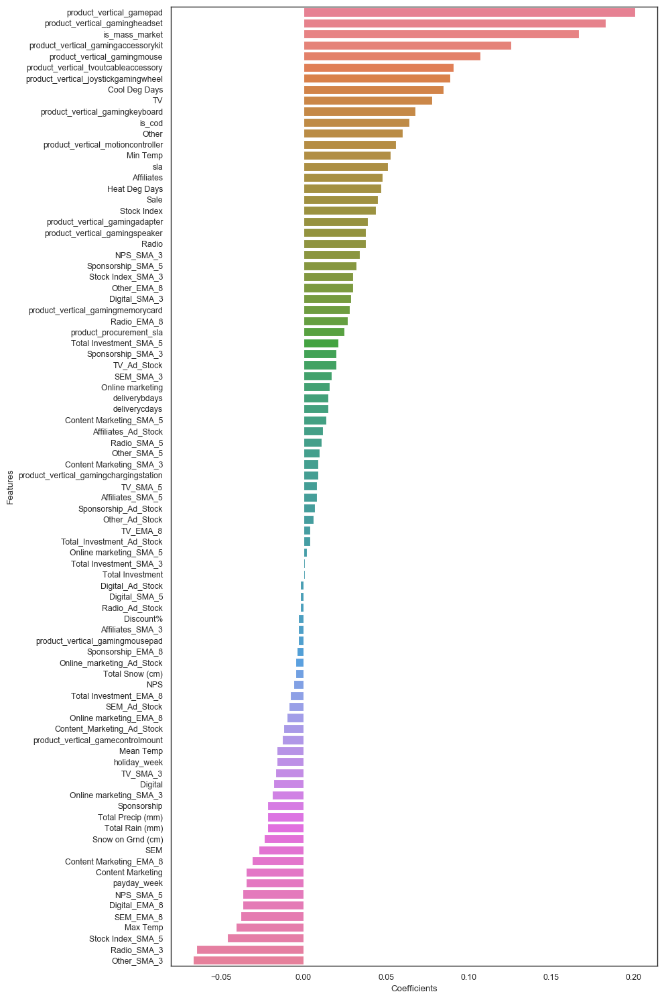

In [263]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_gamepad	|0.201|
|product_vertical_gamingheadset|	0.183|
|is_mass_market|	0.167|
|product_vertical_gamingaccessorykit	|0.126|
|product_vertical_gamingmouse	|0.107|

## Building Linear Regression model for `homeaudio`

In [264]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_model = LinearRegression().fit(X_homeaudio_train, y_homeaudio_train)
y_homeaudio_test_pred = homeaudio_model.predict(X_homeaudio_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_test, y_homeaudio_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_test, y_homeaudio_test_pred)))

R2 Score: 0.9608086220945993
Mean Squared Error: 0.09397173521657107


##### With Simple Linear Regression, we get a r2 score of 0.96 and mse of 0.09

## Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [265]:
y_homeaudio = homeaudio_df.pop('gmv')
X_homeaudio = homeaudio_df

In [266]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_model_cv = LinearRegression().fit(X_homeaudio, y_homeaudio)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model_cv, X_homeaudio, y_homeaudio, cv=5)
accuracy = metrics.r2_score(y_homeaudio, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.7260604462246452
Mean Squared Error: 0.2739395537753548


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.73 and mse score of 0.27

## Determining Feature Importance for `homeaudio` from model without cv

In [267]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_model.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.009),
 ('Discount%', 0.015),
 ('deliverybdays', 0.016),
 ('deliverycdays', -0.001),
 ('sla', -0.121),
 ('product_procurement_sla', -0.057),
 ('is_cod', 0.131),
 ('is_mass_market', 0.148),
 ('product_vertical_djcontroller', 0.016),
 ('product_vertical_dock', 0.111),
 ('product_vertical_dockingstation', 0.019),
 ('product_vertical_fmradio', 0.133),
 ('product_vertical_hifisystem', 0.05),
 ('product_vertical_homeaudiospeaker', 0.392),
 ('product_vertical_karaokeplayer', -0.0),
 ('product_vertical_slingbox', 0.054),
 ('product_vertical_soundmixer', 0.028),
 ('product_vertical_voicerecorder', -0.069),
 ('payday_week', 0.056),
 ('holiday_week', -0.049),
 ('Total Investment', -0.05),
 ('Total Investment_SMA_3', 0.019),
 ('Total Investment_SMA_5', -0.029),
 ('Total Investment_EMA_8', 0.073),
 ('Total_Investment_Ad_Stock', -0.064),
 ('TV', -0.037),
 ('TV_SMA_3', 0.025),
 ('TV_SMA_5', 0.026),
 ('TV_EMA_8', -0.012),
 ('TV_Ad_Stock', -0.022),
 ('Digital', 0.009),
 ('Digital_SMA_3'

In [268]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
13,product_vertical_homeaudiospeaker,0.392
7,is_mass_market,0.148
31,Digital_SMA_3,0.139
11,product_vertical_fmradio,0.133
6,is_cod,0.131
9,product_vertical_dock,0.111
78,Mean Temp,0.110
53,Affiliates_EMA_8,0.103
56,SEM_SMA_3,0.094
58,SEM_EMA_8,0.091


## Plotting the Features in descending order of Importance for `homeaudio`

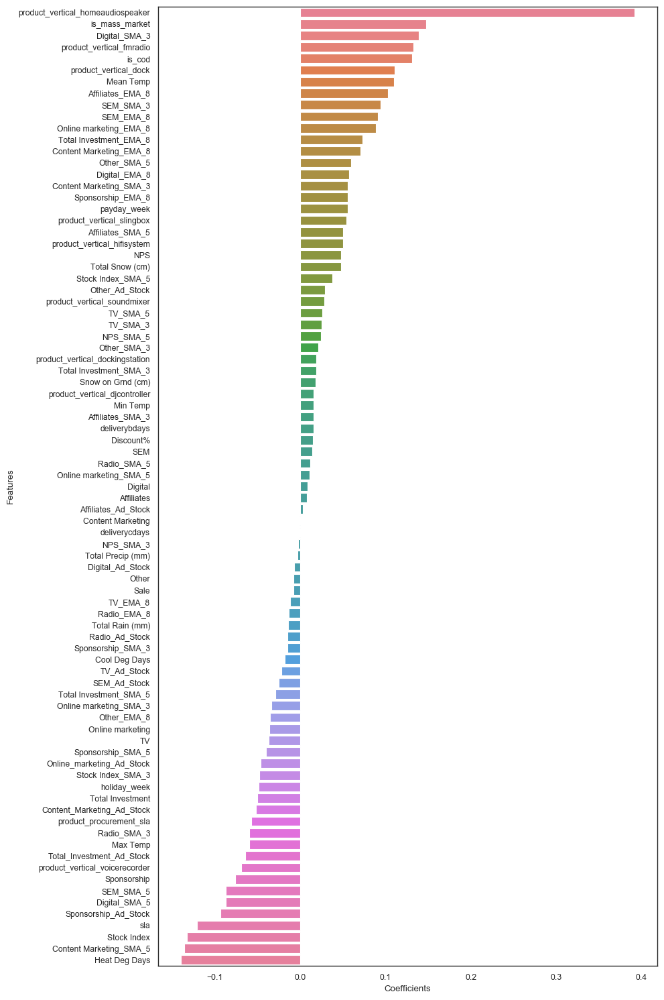

In [269]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_homeaudiospeaker|	0.392|
|is_mass_market	|0.148|
|Digital_SMA_3	|0.139|
|product_vertical_fmradio	|0.133|
|is_cod	|0.131|

## Multiplicative Model

*The Linear Regression Model that we built earlier is an additive model that has been an implicit assumption that the different KPIs affect the revenue additively.*

  __Y = α + β1X1 + β2X2 + β3X3 + β4X4 + β5X5 + ϵ__

*However when there are interactions between the KPIs, we go for a multiplicative model.*

*To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.*

__Y = e^α .X1^β1 . X2^β2 . X3^β3 . X4^β4 . X5^β5 + ϵ__

__lnY = α + β1ln(X1) + β2ln(X2) + β3ln(X3) + β4ln(X4) + β5ln(X5) + ϵ'__

In [270]:
homeaudio_org_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [271]:
# Making copy of dataframes from the original ones
cameraaccessory_mul_df = cameraaccessory_org_df.copy()
gamingaccessory_mul_df = gamingaccessory_org_df.copy()
homeaudio_mul_df = homeaudio_org_df.copy()
homeaudio_mul_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [272]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_mul_df.isnull().sum()/homeaudio_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale,0,0.000
Digital,0,0.000
Total Investment_SMA_5,0,0.000
Total Investment_EMA_8,0,0.000
Total_Investment_Ad_Stock,0,0.000


#### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [273]:
# removing columns
cameraaccessory_mul_df = cameraaccessory_mul_df.drop('Week', axis=1)
gamingaccessory_mul_df = gamingaccessory_mul_df.drop('Week', axis=1)
homeaudio_mul_df = homeaudio_mul_df.drop('Week', axis=1)
homeaudio_mul_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [274]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_mul_df.isnull().sum()/homeaudio_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale,0,0.000
Digital_SMA_3,0,0.000
Total Investment_EMA_8,0,0.000
Total_Investment_Ad_Stock,0,0.000
TV,0,0.000


### Taking Logarithm of both the Dependent and the independent variables

##### After taking log, all 0 values will be transformed to `inf`. Retransforming these values to 0.

In [275]:
cameraaccessory_mul_df = cameraaccessory_mul_df.applymap(lambda x: np.log(x))
cameraaccessory_mul_df = cameraaccessory_mul_df.replace([np.inf, -np.inf], 0)
cameraaccessory_mul_df = cameraaccessory_mul_df.replace(np.nan, 0)

gamingaccessory_mul_df = gamingaccessory_mul_df.applymap(lambda x: np.log(x))
gamingaccessory_mul_df = gamingaccessory_mul_df.replace([np.inf, -np.inf], 0)
gamingaccessory_mul_df = gamingaccessory_mul_df.replace(np.nan, 0)

homeaudio_mul_df = homeaudio_mul_df.applymap(lambda x: np.log(x))
homeaudio_mul_df = homeaudio_mul_df.replace([np.inf, -np.inf], 0)
homeaudio_mul_df = homeaudio_mul_df.replace(np.nan, 0)


homeaudio_mul_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,15.336,3.448,0.000,0.000,1.997,1.052,7.367,7.220,2.079,3.497,0.000,6.246,3.135,7.225,0.000,0.000,0.000,4.143,0.000,0.000,1.450,0.000,0.000,1.450,1.450,-2.919,0.000,0.000,-2.919,-2.919,-0.457,0.000,0.000,-0.457,-0.457,0.617,0.000,0.000,0.617,0.617,0.000,0.000,0.000,0.000,0.000,-1.103,0.000,0.000,-1.103,-1.103,-1.988,0.000,0.000,-1.988,-1.988,0.228,0.000,0.000,0.228,0.228,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,0.000,0.000,7.071,0.000,0.000,3.332,2.526,3.001,-1.261,0.869,1.485,0.000,1.485,0.000,0.000
26,15.497,3.495,0.000,0.000,1.944,1.010,7.533,7.384,1.946,3.912,0.000,6.353,3.738,7.392,0.000,0.000,0.000,4.234,0.000,0.000,1.450,0.000,0.000,1.450,1.920,-2.919,0.000,0.000,-2.919,-2.449,-0.457,0.000,0.000,-0.457,0.013,0.617,0.000,0.000,0.617,1.087,0.000,0.000,0.000,0.000,0.000,-1.103,0.000,0.000,-1.103,-0.633,-1.988,0.000,0.000,-1.988,-1.518,0.228,0.000,0.000,0.228,0.698,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,0.000,0.000,7.071,0.000,0.000,3.497,2.398,3.143,0.000,1.645,0.336,0.000,0.336,0.000,0.693
27,15.359,3.477,0.000,0.000,1.956,1.051,7.472,7.358,1.386,4.025,0.000,6.358,3.584,7.265,0.000,0.000,0.000,3.829,0.000,0.000,1.450,1.450,0.000,1.450,2.123,-2.919,-2.919,0.000,-2.919,-2.246,-0.457,-0.457,0.000,-0.457,0.216,0.617,0.617,0.000,0.617,1.290,0.000,0.000,0.000,0.000,0.000,-1.103,-1.103,0.000,-1.103,-0.430,-1.988,-1.988,0.000,-1.988,-1.315,0.228,0.228,0.000,0.228,0.901,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,4.000,0.000,7.071,7.071,0.000,3.450,2.674,3.138,0.000,1.621,0.077,0.000,0.077,0.000,0.000
28,15.054,3.472,0.000,0.000,1.974,1.006,7.126,6.977,0.693,3.761,0.000,6.040,2.996,6.932,0.000,0.000,0.000,3.784,0.000,0.000,1.450,1.450,0.000,1.450,2.228,-2.919,-2.919,0.000,-2.919,-2.141,-0.457,-0.457,0.000,-0.457,0.320,0.617,0.617,0.000,0.617,1.395,0.000,0.000,0.000,0.000,0.000,-1.103,-1.103,0.000,-1.103,-0.325,-1.988,-1.988,0.000,-1.988,-1.210,0.228,0.228,0.000,0.228,1.005,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,4.000,0.000,7.071,7.071,0.000,3.512,2.773,3.201,0.000,1.882,1.533,0.000,1.533,0.000,0.000
29,7.863,2.781,0.000,0.000,2.197,0.693,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.013,1.157,1.285,1.265,1.884,-6.908,-3.315,-3.137,-3.165,-2.638,-1.363,-0.679,-0.584,-0.599,0.079,-1.546,0.268,0.423,0.398,0.968,0.000,0.000,0.000,0.000,0.000,-3.650,-1.470,-1.306,-1.332,-0.778,-4.200,-2.340,-2.184,-2.208,-1.641,-0.687,0.005,0.100,0.085,0.762,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.094,4.032,4.020,7.095,7.079,7.076,

In [276]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_mul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_mul_df.isnull().sum()/homeaudio_mul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale,0,0.000
Digital_SMA_3,0,0.000
Total Investment_EMA_8,0,0.000
Total_Investment_Ad_Stock,0,0.000
TV,0,0.000


## Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [277]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_mul_df[cameraaccessory_mul_df.columns]=scaler.fit_transform(cameraaccessory_mul_df[cameraaccessory_mul_df.columns])
gamingaccessory_mul_df[gamingaccessory_mul_df.columns]=scaler.fit_transform(gamingaccessory_mul_df[gamingaccessory_mul_df.columns])
homeaudio_mul_df[homeaudio_mul_df.columns]=scaler.fit_transform(homeaudio_mul_df[homeaudio_mul_df.columns])

homeaudio_mul_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,0.137,-0.777,0.390,0.354,1.799,1.220,0.200,0.103,1.325,0.174,-1.879,0.198,-0.104,0.094,0.000,-0.146,-0.588,0.047,0.000,0.000,-1.455,-3.028,-2.631,-2.055,-2.806,-1.388,0.352,0.279,-2.223,-2.497,0.603,1.095,1.052,0.404,-0.799,-0.892,-1.722,-1.718,-1.778,-2.291,1.425,1.520,1.735,1.889,1.143,-1.727,-1.088,-1.215,-2.260,-2.713,-1.752,-0.043,-0.133,-2.218,-2.757,-0.188,-0.651,-0.678,-0.503,-1.881,0.526,0.471,0.332,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,-4.780,-3.311,0.186,-4.791,-3.316,0.679,1.216,0.771,-2.166,0.608,0.841,-0.226,0.751,-0.309,-0.443
26,0.279,-0.465,0.390,0.354,1.428,0.555,0.323,0.251,1.130,0.585,-1.879,0.310,0.794,0.242,0.000,-0.146,-0.588,0.177,0.000,0.000,-1.455,-3.028,-2.631,-2.055,-2.175,-1.388,0.352,0.279,-2.223,-2.139,0.603,1.095,1.052,0.404,-0.107,-0.892,-1.722,-1.718,-1.778,-1.752,1.425,1.520,1.735,1.889,1.143,-1.727,-1.088,-1.215,-2.260,-2.296,-1.752,-0.043,-0.133,-2.218,-2.298,-0.188,-0.651,-0.678,-0.503,-1.059,0.526,0.471,0.332,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,-4.780,-3.311,0.186,-4.791,-3.316,0.916,1.102,0.887,-1.163,1.556,-0.261,-0.226,-0.326,-0.309,0.999
27,0.157,-0.588,0.390,0.354,1.514,1.205,0.278,0.228,0.314,0.698,-1.879,0.315,0.564,0.129,0.000,-0.146,-0.588,-0.402,0.000,0.000,-1.455,-1.326,-2.631,-2.055,-1.903,-1.388,-1.892,0.279,-2.223,-1.984,0.603,0.502,1.052,0.404,0.192,-0.892,-1.079,-1.718,-1.778,-1.520,1.425,1.520,1.735,1.889,1.143,-1.727,-2.169,-1.215,-2.260,-2.116,-1.752,-2.280,-0.133,-2.218,-2.100,-0.188,-0.262,-0.678,-0.503,-0.704,0.526,0.471,0.332,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,0.350,-3.311,0.186,0.218,-3.316,0.849,1.348,0.882,-1.163,1.526,-0.510,-0.226,-0.569,-0.309,-0.443
28,-0.112,-0.619,0.390,0.354,1.639,0.488,0.022,-0.116,-0.698,0.436,-1.879,-0.017,-0.313,-0.168,0.000,-0.146,-0.588,-0.466,0.000,0.000,-1.455,-1.326,-2.631,-2.055,-1.763,-1.388,-1.892,0.279,-2.223,-1.905,0.603,0.502,1.052,0.404,0.346,-0.892,-1.079,-1.718,-1.778,-1.400,1.425,1.520,1.735,1.889,1.143,-1.727,-2.169,-1.215,-2.260,-2.023,-1.752,-2.280,-0.133,-2.218,-1.998,-0.188,-0.262,-0.678,-0.503,-0.522,0.526,0.471,0.332,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,1.560,0.350,-3.311,0.186,0.218,-3.316,0.937,1.435,0.934,-1.163,1.844,0.887,-0.226,0.796,-0.309,-0.443
29,-6.479,-5.201,0.390,0.354,3.181,-4.506,-5.245,-6.421,-1.709,-3.284,-1.879,-6.340,-4.779,-6.360,0.000,-0.146,-0.588,-5.874,0.000,0.000,-3.264,-1.670,-1.291,-2.368,-2.224,-3.850,-2.197,-2.380,-2.447,-2.283,-0.502,0.215,0.271,0.163,-0.009,-2.890,-1.443,-1.274,-2.111,-1.889,1.425,1.520,1.735,1.889,1.143,-3.791,-2.529,-2.602,-2.499,-2.425,-3.772,

## Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [278]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_mul_train, cameraaccessory_mul_test = train_test_split(cameraaccessory_mul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_mul_train, gamingaccessory_mul_test = train_test_split(gamingaccessory_mul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_mul_train, homeaudio_mul_test = train_test_split(homeaudio_mul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the 3 dataframes into X and Y sets for the model building

In [279]:
y_cameraaccessory_mul_train = cameraaccessory_mul_train.pop('gmv')
X_cameraaccessory_mul_train = cameraaccessory_mul_train

y_gamingaccessory_mul_train = gamingaccessory_mul_train.pop('gmv')
X_gamingaccessory_mul_train = gamingaccessory_mul_train

y_homeaudio_mul_train = homeaudio_mul_train.pop('gmv')
X_homeaudio_mul_train = homeaudio_mul_train

X_homeaudio_mul_train.head()

,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
12,-0.301,0.873,0.920,0.231,0.240,-1.952,-0.056,0.639,0.080,1.001,0.103,0.644,-0.162,0.000,6.856,0.450,0.736,0.000,0.000,0.060,0.566,0.633,0.472,0.468,0.575,0.878,0.915,0.879,0.861,-0.699,-0.022,0.024,-0.316,-0.163,0.205,0.563,0.652,0.318,0.440,-1.764,-0.633,-0.772,-0.800,-1.068,0.316,0.375,0.386,0.452,0.391,0.385,0.421,0.404,0.523,0.461,-0.469,-0.316,-0.288,-0.591,-0.392,0.526,0.320,0.006,-0.944,-0.735,-0.406,1.351,1.565,1.358,1.292,0.812,0.236,0.315,0.944,0.164,0.255,-0.603,-1.033,-1.473,1.077,-0.451,0.236,-2.093,0.357,-0.309,-0.443
10,-0.142,0.082,0.137,-0.030,-0.359,0.084,0.103,1.130,-0.227,-0.072,0.250,0.605,-0.025,0.000,-0.146,-0.588,0.492,0.000,0.000,0.771,0.749,0.432,0.481,0.617,0.934,1.000,0.678,0.836,0.929,0.375,0.259,0.037,-0.158,0.177,0.701,0.718,0.353,0.233,0.525,-0.183,-0.351,-0.475,-0.485,-0.497,0.405,0.410,0.349,0.468,0.416,0.466,0.453,0.337,0.527,0.475,-0.135,-0.206,-0.405,-0.542,-0.311,-2.063,0.352,-0.048,-0.751,-0.213,1.990,2.041,1.135,1.674,1.777,0.013,0.211,0.314,-1.901,0.113,0.272,0.230,-1.033,-0.244,0.830,-0.451,1.862,-0.226,1.749,-0.309,-0.443
32,-0.024,0.390,0.354,0.655,0.258,0.140,0.083,1.130,0.624,-0.323,0.230,0.388,-0.097,0.000,-0.146,-0.588,-0.434,0.000,0.000,0.723,0.252,-0.205,-0.507,0.185,0.394,0.017,-0.522,-0.417,0.062,-0.159,-0.418,-0.607,-0.583,-0.467,1.081,0.732,0.234,0.157,0.708,0.154,-0.278,-0.985,-1.255,-0.527,0.310,-0.100,-0.680,-0.561,-0.059,0.274,-0.232,-0.977,-0.667,-0.124,0.151,-0.337,-0.819,-0.885,-0.373,0.526,0.471,0.332,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,-0.615,0.269,0.407,-0.754,0.193,0.302,0.653,1.251,0.789,-1.163,0.690,-0.493,-0.226,-0.552,-0.309,-0.443
22,-1.150,0.850,0.894,-0.743,0.282,0.057,-0.083,-0.106,-0.541,0.813,0.101,-1.679,-0.164,0.000,-0.146,2.326,0.679,0.000,0.000,-0.296,-0.080,0.095,-0.071,-0.136,-0.128,-0.416,-0.659,-0.138,-0.282,-0.103,-0.519,-0.887,-1.103,-0.623,0.232,0.194,0.218,0.099,0.159,-1.628,-0.696,-0.515,-0.928,-1.107,-0.274,-0.042,0.156,0.223,0.044,-0.273,-0.143,-0.020,0.189,0.009,-0.665,-0.514,-0.355,-0.668,-0.532,0.526,0.267,-0.046,-1.228,-1.297,-0.406,-2.188,-0.935,-1.438,-0.804,0.444,0.222,0.296,0.389,0.235,0.324,0.916,0.872,0.818,-1.843,1.153,-0.493,-0.226,-0.552,-0.309,-0.443
45,0.638,0.390,0.354,0.289,0.937,0.328,0.046,0.639,0.389,0.588,0.087,0.341,0.256,0.000,-0.146,-0.588,-0.071,0.000,0.000,0.853,0.555,0.313,0.603,0.601,0.598,0.479,0.317,0.524,0.551,0.836,0.423,0.012,0.757,0.596,0.987,0.718,0.382,0.753,0.754,0.531,0.209,-0.273,0.194,0.342,0.567,0.501,0.406,0.521,0.520,0.552,0.470,0.358,0.523,0.519,1.099,0.703,0.295,0.942,0.805,0.526,0.471,0.332,0.988,0.747,-0.406,-0.313,-0.167,-

## Dividing into X and Y test sets for the model building for 3 dataframes

In [280]:
y_cameraaccessory_mul_test = cameraaccessory_mul_test.pop('gmv')
X_cameraaccessory_mul_test = cameraaccessory_mul_test

y_gamingaccessory_mul_test = gamingaccessory_mul_test.pop('gmv')
X_gamingaccessory_mul_test = gamingaccessory_mul_test

y_homeaudio_mul_test = homeaudio_mul_test.pop('gmv')
X_homeaudio_mul_test = homeaudio_mul_test

X_homeaudio_mul_test.head()

,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
31,0.070,0.390,0.354,-0.128,1.406,0.233,0.192,1.130,0.643,-0.646,0.372,0.522,-0.016,0.000,-0.146,-0.588,0.406,0.000,0.000,0.723,-0.490,-0.830,-1.254,-0.385,0.394,-0.515,-1.107,-0.912,-0.293,-0.159,-0.539,-0.686,-0.563,-0.535,1.081,0.031,-0.460,-0.601,0.191,0.154,-0.824,-1.660,-1.900,-1.085,0.310,-0.770,-1.400,-1.109,-0.467,0.274,-0.993,-1.818,-1.247,-0.566,0.151,-0.923,-1.270,-1.195,-0.767,0.526,0.471,0.332,0.988,0.747,-0.406,-0.313,-0.167,-0.421,-0.629,-0.615,0.374,0.451,-0.754,0.214,0.312,0.894,0.923,0.736,-0.967,0.676,-0.623,-0.226,-0.679,-0.309,-0.443
5,1.152,-1.640,-1.664,-0.743,-0.264,0.549,0.410,-1.709,0.624,-0.323,0.212,-0.240,0.592,0.000,-0.146,-0.588,0.475,0.000,0.000,-0.433,-0.373,0.059,0.019,-0.219,0.006,-0.156,0.033,0.238,0.091,-0.010,-0.150,-0.672,-0.506,-0.357,-0.675,-0.834,-1.084,-0.794,-0.947,-0.016,-0.157,-0.041,-0.088,-0.082,0.286,0.266,0.424,0.508,0.385,0.298,0.246,0.391,0.537,0.408,-0.595,-0.694,-0.669,-0.463,-0.616,0.526,-2.424,0.087,-0.599,-0.641,-0.406,-0.313,1.321,1.071,0.706,0.390,0.245,0.305,0.715,0.244,0.298,0.002,-1.033,-0.327,0.865,-0.451,-0.584,-0.226,-0.641,0.407,1.843
9,0.149,-0.525,-0.529,-0.399,-0.515,0.308,0.165,-1.709,0.080,0.911,0.194,-0.104,0.215,0.000,-0.146,1.057,0.475,0.000,0.000,0.771,0.479,0.246,0.327,0.481,0.934,0.770,0.461,0.697,0.822,0.375,0.137,-0.046,-0.235,0.107,0.701,0.407,0.086,-0.000,0.361,-0.183,-0.281,-0.427,-0.415,-0.440,0.405,0.364,0.318,0.462,0.401,0.466,0.388,0.291,0.513,0.454,-0.135,-0.354,-0.504,-0.574,-0.374,-2.063,0.320,-0.124,-0.828,-0.392,1.990,1.351,0.529,1.358,1.580,0.013,0.223,0.319,-1.901,0.159,0.291,-0.127,-1.033,0.113,0.592,-0.451,-1.249,-0.226,-1.291,-0.309,-0.443
3,1.221,-2.009,-2.124,-0.995,0.915,0.608,0.384,0.314,0.012,-0.323,0.259,-0.240,0.640,0.000,-0.146,-0.588,0.458,0.000,0.000,-0.433,0.193,0.310,0.358,0.153,0.006,0.273,0.261,0.430,0.324,-0.010,-0.969,-1.334,-0.545,-0.709,-0.675,-1.312,-1.435,-0.492,-0.904,-0.016,0.210,0.186,0.116,0.222,0.286,0.517,0.572,0.607,0.509,0.298,0.527,0.562,0.638,0.539,-0.595,-0.609,-0.617,-0.160,-0.444,0.526,0.408,0.217,-0.101,0.594,-0.406,2.253,2.357,2.137,1.884,0.390,0.189,0.280,0.715,0.175,0.267,-0.426,-1.033,-0.714,0.979,-0.451,0.590,-0.226,0.506,-0.309,0.999
18,-0.253,0.839,0.882,-0.785,0.127,0.060,-0.061,1.130,-3.284,1.161,0.015,-0.844,-0.156,0.000,-0.146,1.488,0.831,0.000,0.000,0.178,0.196,0.197,0.178,0.161,-0.386,-0.644,-0.042,0.264,-0.078,-1.123,-1.331,-1.243,-1.331,-1.336,0.243,0.202,0.205,0.130,0.173,0.176,0.067,-0.523,-0.626,-0.206,0.426,0.435,0.381,0.469,0.437,0.344,0.303,0.280,0.457,0.387,-0.034,-0.099,-0.286,-0.495,-0.196,-2.048,0.353,-0.046,-0.904,-0.

## Building Linear Regression model for `cameraaccessory`

In [281]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_mul_model = LinearRegression().fit(X_cameraaccessory_mul_train, y_cameraaccessory_mul_train)
y_cameraaccessory_mul_test_pred = cameraaccessory_mul_model.predict(X_cameraaccessory_mul_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_mul_test, y_cameraaccessory_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_mul_test, y_cameraaccessory_mul_test_pred)))

R2 Score: 0.8395078516371082
Mean Squared Error: 0.35593405479143847


##### With Simple Linear Regression, we get a r2 score of 0.84 and mse of 0.36

## Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [282]:
y_cameraaccessory_mul = cameraaccessory_mul_df.pop('gmv')
X_cameraaccessory_mul = cameraaccessory_mul_df

In [283]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_mul_model_cv = LinearRegression().fit(X_cameraaccessory_mul, y_cameraaccessory_mul)
cameraaccessory_mul_predictions_cv = cross_val_predict(cameraaccessory_mul_model_cv, X_cameraaccessory_mul, \
                                                       y_cameraaccessory_mul, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_mul, cameraaccessory_mul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_mul, cameraaccessory_mul_predictions_cv)))

Cross-Predicted Accuracy: 0.9086312803861201
Mean Squared Error: 0.09136871961387999


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.91 and mse score of 0.09

## Determining Feature Importance for `cameraaccessory` from model with cv

In [284]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_mul_lr_model_parameters = list(cameraaccessory_mul_model_cv.coef_)
cameraaccessory_mul_lr_model_parameters.insert(0, cameraaccessory_mul_model_cv.intercept_)
cameraaccessory_mul_lr_model_parameters = [round(x, 3) for x in cameraaccessory_mul_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_mul_lr_coef = list(zip(cols, cameraaccessory_mul_lr_model_parameters))
cameraaccessory_mul_lr_coef

[('constant', 0.0),
 ('Discount%', -0.107),
 ('deliverybdays', -0.044),
 ('deliverycdays', 0.059),
 ('sla', -0.086),
 ('product_procurement_sla', 0.042),
 ('is_cod', -0.025),
 ('is_mass_market', 0.149),
 ('product_vertical_cameraaccessory', 0.07),
 ('product_vertical_camerabag', 0.051),
 ('product_vertical_camerabattery', 0.16),
 ('product_vertical_camerabatterycharger', 0.121),
 ('product_vertical_camerabatterygrip', -0.039),
 ('product_vertical_cameraeyecup', 0.057),
 ('product_vertical_camerafilmrolls', -0.059),
 ('product_vertical_camerahousing', -0.006),
 ('product_vertical_cameraledlight', -0.0),
 ('product_vertical_cameramicrophone', -0.066),
 ('product_vertical_cameramount', 0.055),
 ('product_vertical_cameraremotecontrol', 0.071),
 ('product_vertical_cameratripod', 0.101),
 ('product_vertical_extensiontube', 0.03),
 ('product_vertical_filter', 0.032),
 ('product_vertical_flash', -0.042),
 ('product_vertical_flashshoeadapter', 0.0),
 ('product_vertical_lens', 0.181),
 ('product

In [285]:
cameraaccessory_mul_lr_coef_df = pd.DataFrame(cameraaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.rename(columns=col_rename)
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.iloc[1:,:]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.loc[cameraaccessory_mul_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_mul_lr_coef_df

,Features,Coefficients
25,product_vertical_lens,0.181
10,product_vertical_camerabattery,0.160
7,is_mass_market,0.149
11,product_vertical_camerabatterycharger,0.121
38,TV,0.105
96,Total Precip (mm),0.105
20,product_vertical_cameratripod,0.101
57,Content_Marketing_Ad_Stock,0.096
41,TV_EMA_8,0.090
63,Affiliates,0.083


## Plotting the Features in descending order of Importance for `cameraaccessory`

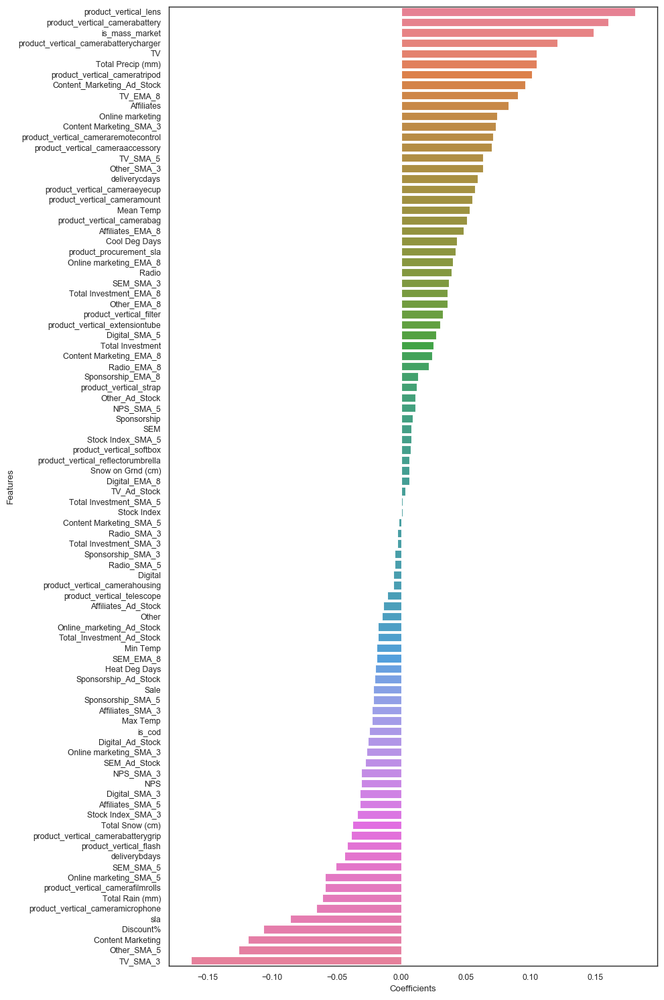

In [286]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_mul_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_lens	|0.181|
|product_vertical_camerabattery	|0.160|
|is_mass_market	|0.149|
|product_vertical_camerabatterycharger	|0.121|
|TV	|0.105|

## Building Linear Regression model for `gamingaccessory`

In [287]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_mul_model = LinearRegression().fit(X_gamingaccessory_mul_train, y_gamingaccessory_mul_train)
y_gamingaccessory_mul_test_pred = gamingaccessory_mul_model.predict(X_gamingaccessory_mul_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_mul_test, y_gamingaccessory_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_mul_test, y_gamingaccessory_mul_test_pred)))

R2 Score: 0.9431103703903921
Mean Squared Error: 0.08940068677857597


##### With Simple Linear Regression, we get a r2 score of 0.94 and mse of 0.09

## Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [288]:
y_gamingaccessory_mul = gamingaccessory_mul_df.pop('gmv')
X_gamingaccessory_mul = gamingaccessory_mul_df

In [289]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_mul_model_cv = LinearRegression().fit(X_gamingaccessory_mul, y_gamingaccessory_mul)
gamingaccessory_mul_predictions_cv = cross_val_predict(gamingaccessory_mul_model_cv, X_gamingaccessory_mul, \
                                                       y_gamingaccessory_mul, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_mul, gamingaccessory_mul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_mul, gamingaccessory_mul_predictions_cv)))

Cross-Predicted Accuracy: 0.939234957686513
Mean Squared Error: 0.06076504231348703


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.94 and mse score of 0.06

## Determining Feature Importance for `gamingaccessory` with model with cv

In [290]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_mul_lr_model_parameters = list(gamingaccessory_mul_model_cv.coef_)
gamingaccessory_mul_lr_model_parameters.insert(0, gamingaccessory_mul_model_cv.intercept_)
gamingaccessory_mul_lr_model_parameters = [round(x, 3) for x in gamingaccessory_mul_lr_model_parameters]
cols = X_gamingaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_mul_lr_coef = list(zip(cols, gamingaccessory_mul_lr_model_parameters))
gamingaccessory_mul_lr_coef

[('constant', 0.0),
 ('Discount%', -0.088),
 ('deliverybdays', 0.016),
 ('deliverycdays', -0.013),
 ('sla', 0.041),
 ('product_procurement_sla', -0.009),
 ('is_cod', -0.04),
 ('is_mass_market', 0.234),
 ('product_vertical_gamecontrolmount', 0.0),
 ('product_vertical_gamepad', 0.211),
 ('product_vertical_gamingaccessorykit', -0.041),
 ('product_vertical_gamingadapter', -0.056),
 ('product_vertical_gamingchargingstation', 0.06),
 ('product_vertical_gamingheadset', 0.25),
 ('product_vertical_gamingkeyboard', -0.027),
 ('product_vertical_gamingmemorycard', -0.127),
 ('product_vertical_gamingmouse', 0.224),
 ('product_vertical_gamingmousepad', 0.044),
 ('product_vertical_gamingspeaker', -0.008),
 ('product_vertical_joystickgamingwheel', 0.136),
 ('product_vertical_motioncontroller', 0.088),
 ('product_vertical_tvoutcableaccessory', -0.006),
 ('payday_week', 0.0),
 ('holiday_week', 0.0),
 ('Total Investment', 0.002),
 ('Total Investment_SMA_3', -0.053),
 ('Total Investment_SMA_5', -0.068),
 

In [291]:
gamingaccessory_mul_lr_coef_df = pd.DataFrame(gamingaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.rename(columns=col_rename)
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.iloc[1:,:]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.loc[gamingaccessory_mul_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_gamingheadset,0.250
7,is_mass_market,0.234
16,product_vertical_gamingmouse,0.224
9,product_vertical_gamepad,0.211
50,Online marketing_SMA_3,0.157
19,product_vertical_joystickgamingwheel,0.136
48,Content_Marketing_Ad_Stock,0.133
40,Sponsorship_SMA_3,0.118
55,Affiliates_SMA_3,0.093
20,product_vertical_motioncontroller,0.088


## Plotting the Features in descending order of Importance for `gamingaccessory`

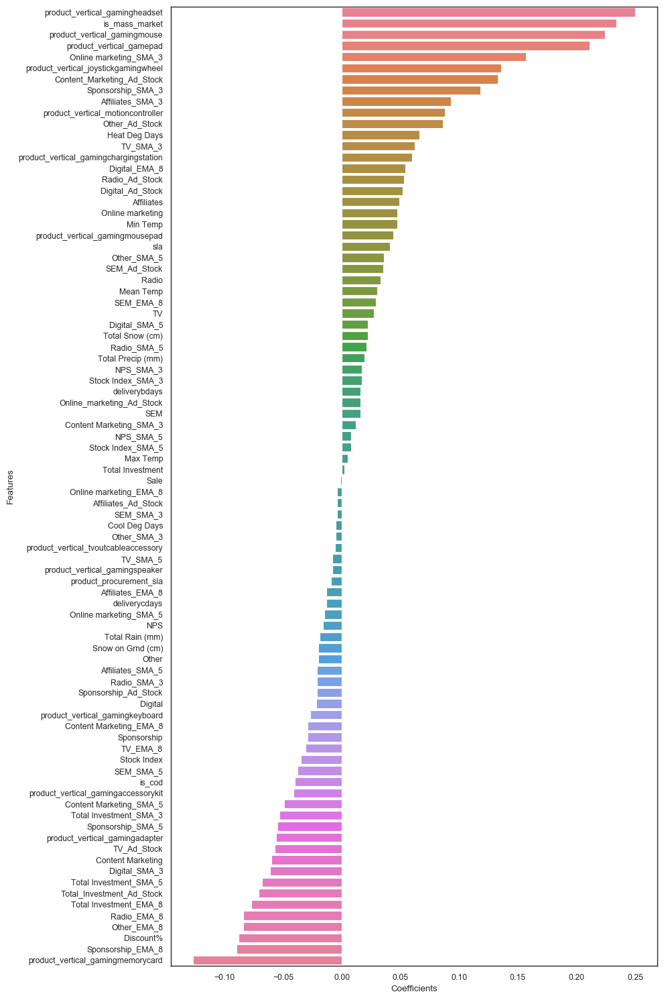

In [292]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_mul_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_gamingheadset	|0.250|
|is_mass_market	|0.234|
|product_vertical_gamingmouse	|0.224|
|product_vertical_gamepad	|0.211|
|Online marketing_SMA_3	|0.157|

## Building Linear Regression model for `homeaudio`

In [293]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_mul_model = LinearRegression().fit(X_homeaudio_mul_train, y_homeaudio_mul_train)
y_homeaudio_mul_test_pred = homeaudio_mul_model.predict(X_homeaudio_mul_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_mul_test, y_homeaudio_mul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_mul_test, y_homeaudio_mul_test_pred)))

R2 Score: -0.6349683688775276
Mean Squared Error: 0.3421291055323344


##### With Simple Linear Regression, we get a r2 score of -0.63 and mse of 0.34

*Here R2 is negative which signifies that the chosen model does not follow the trend of the data, so fits worse than a horizontal line. It simply means the chosen model (with its constraints) fits the data really poorly.*

## Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [294]:
y_homeaudio_mul = homeaudio_mul_df.pop('gmv')
X_homeaudio_mul = homeaudio_mul_df

In [295]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_mul_model_cv = LinearRegression().fit(X_homeaudio_mul, y_homeaudio_mul)
homeaudio_mul_predictions_cv = cross_val_predict(homeaudio_mul_model_cv, X_homeaudio_mul, y_homeaudio_mul, cv=5)
accuracy = metrics.r2_score(y_homeaudio_mul, homeaudio_mul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_mul, homeaudio_mul_predictions_cv)))

Cross-Predicted Accuracy: 0.8611790689926849
Mean Squared Error: 0.13882093100731507


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.86 and mse score of 0.14

## Determining Feature Importance for `homeaudio` with model with cv

In [296]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_mul_lr_model_parameters = list(homeaudio_mul_model_cv.coef_)
homeaudio_mul_lr_model_parameters.insert(0, homeaudio_mul_model_cv.intercept_)
homeaudio_mul_lr_model_parameters = [round(x, 3) for x in homeaudio_mul_lr_model_parameters]
cols = X_homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_mul_lr_coef = list(zip(cols, homeaudio_mul_lr_model_parameters))
homeaudio_mul_lr_coef

[('constant', -0.0),
 ('Discount%', 0.092),
 ('deliverybdays', 0.036),
 ('deliverycdays', -0.079),
 ('sla', -0.013),
 ('product_procurement_sla', -0.034),
 ('is_cod', -0.089),
 ('is_mass_market', 0.289),
 ('product_vertical_djcontroller', 0.027),
 ('product_vertical_dock', 0.003),
 ('product_vertical_dockingstation', 0.04),
 ('product_vertical_fmradio', 0.224),
 ('product_vertical_hifisystem', -0.028),
 ('product_vertical_homeaudiospeaker', 0.469),
 ('product_vertical_karaokeplayer', -0.0),
 ('product_vertical_slingbox', 0.002),
 ('product_vertical_soundmixer', 0.021),
 ('product_vertical_voicerecorder', -0.013),
 ('payday_week', 0.0),
 ('holiday_week', 0.0),
 ('Total Investment', 0.066),
 ('Total Investment_SMA_3', -0.02),
 ('Total Investment_SMA_5', -0.06),
 ('Total Investment_EMA_8', 0.048),
 ('Total_Investment_Ad_Stock', 0.023),
 ('TV', -0.045),
 ('TV_SMA_3', -0.012),
 ('TV_SMA_5', -0.077),
 ('TV_EMA_8', 0.011),
 ('TV_Ad_Stock', -0.014),
 ('Digital', -0.018),
 ('Digital_SMA_3', 0.0

In [297]:
homeaudio_mul_lr_coef_df = pd.DataFrame(homeaudio_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.rename(columns=col_rename)
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.iloc[1:,:]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.loc[homeaudio_mul_lr_coef_df['Coefficients']!=0.0]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_homeaudiospeaker,0.469
7,is_mass_market,0.289
11,product_vertical_fmradio,0.224
64,Radio_Ad_Stock,0.147
35,Sponsorship,0.121
69,Other_Ad_Stock,0.120
1,Discount%,0.092
42,Content Marketing_SMA_5,0.092
83,Total Precip (mm),0.089
56,SEM_SMA_3,0.078


## Plotting the Features in descending order of Importance for `homeaudio`

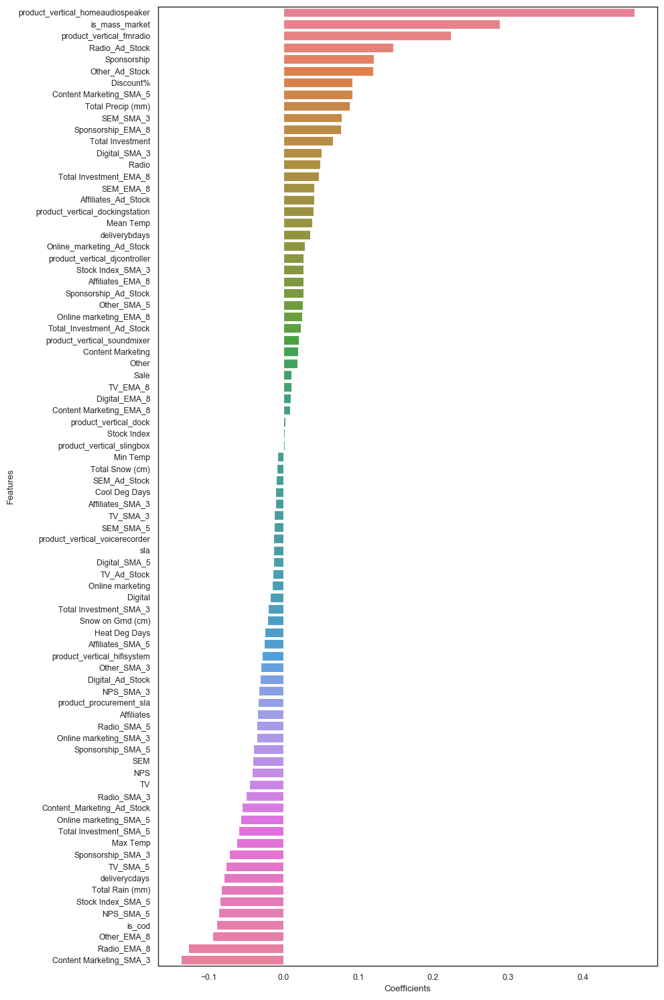

In [298]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_mul_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_homeaudiospeaker	|0.469|
|is_mass_market	|0.289|
|product_vertical_fmradio	|0.224|
|Radio_Ad_Stock	|0.147|
|Sponsorship	|0.121|

## Koyck Model

*The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.*

*The Koyck tells us that the current revenue generated is not just influenced by the different independent attributes, but also because of the revenue generated over the last periods. ie. Current revenue(Yt) is also dependent on the past revenue values(Yt-1).*


  __Yt__ = __α__ +             __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__
  
  __Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

In [299]:
homeaudio_org_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [300]:
# Making copy of dataframes from the original ones
cameraaccessory_koy_df = cameraaccessory_org_df.copy()
gamingaccessory_koy_df = gamingaccessory_org_df.copy()
homeaudio_koy_df = homeaudio_org_df.copy()
homeaudio_koy_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [301]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_koy_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_koy_df.isnull().sum()/homeaudio_koy_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale,0,0.000
Digital,0,0.000
Total Investment_SMA_5,0,0.000
Total Investment_EMA_8,0,0.000
Total_Investment_Ad_Stock,0,0.000


### Creating a new variable which is the Lag of 1 week of the dependent variable (GMV)

In [302]:
GMV_Lag = ['gmv']

In [303]:
def lag_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

In [304]:
cameraaccessory_koy_df = lag_variables(cameraaccessory_koy_df,GMV_Lag,1) 
gamingaccessory_koy_df = lag_variables(gamingaccessory_koy_df,GMV_Lag,1) 
homeaudio_koy_df = lag_variables(homeaudio_koy_df,GMV_Lag,1) 
homeaudio_koy_df.head()

,Week,gmv,gmv_lag1,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,nan,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,4573783.133,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,5371525.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,4679828.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,3451151.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [305]:
# Imputing all null values with 0
cameraaccessory_koy_df.fillna(value=0, inplace=True)
gamingaccessory_koy_df.fillna(value=0, inplace=True)
homeaudio_koy_df.fillna(value=0, inplace=True)
homeaudio_koy_df.head(10)

,Week,gmv,gmv_lag1,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,0.000,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,4573783.133,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,5371525.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,4679828.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,3451151.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0
30,36,3875305.000,2599.000,35.972,0.000,0.000,5.599,2.790

#### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [306]:
# removing columns
cameraaccessory_koy_df = cameraaccessory_koy_df.drop('Week', axis=1)
gamingaccessory_koy_df = gamingaccessory_koy_df.drop('Week', axis=1)
homeaudio_koy_df = homeaudio_koy_df.drop('Week', axis=1)
homeaudio_koy_df.head()

,gmv,gmv_lag1,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,0.000,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,4573783.133,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,5371525.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,4679828.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,3451151.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [307]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_koy_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_koy_df.isnull().sum()/homeaudio_koy_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale,0,0.000
Digital,0,0.000
Total Investment_SMA_5,0,0.000
Total Investment_EMA_8,0,0.000
Total_Investment_Ad_Stock,0,0.000


## Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [308]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_koy_df[cameraaccessory_koy_df.columns]=scaler.fit_transform(cameraaccessory_koy_df[cameraaccessory_koy_df.columns])
gamingaccessory_koy_df[gamingaccessory_koy_df.columns]=scaler.fit_transform(gamingaccessory_koy_df[gamingaccessory_koy_df.columns])
homeaudio_koy_df[homeaudio_koy_df.columns]=scaler.fit_transform(homeaudio_koy_df[homeaudio_koy_df.columns])

homeaudio_koy_df.head()

,gmv,gmv_lag1,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,-0.107,-1.832,-0.920,-0.639,-0.639,1.882,1.297,-0.132,-0.178,1.670,-0.198,-1.132,0.062,-0.420,-0.206,-0.146,-0.197,-0.542,-0.233,-1.043,-0.545,-1.229,-1.739,-1.806,-1.814,-1.789,-1.331,-1.512,-1.593,-1.803,-1.633,0.042,-0.831,-0.893,0.061,-0.563,-0.922,-1.326,-1.378,-1.404,-1.357,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.266,-2.221,-2.172,-2.283,-2.144,-2.346,-2.246,-2.136,-2.313,-0.308,-1.054,-1.129,-0.519,-0.896,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,-4.560,-3.235,0.157,-4.601,-3.265,0.776,1.118,0.959,-1.035,0.461,0.430,-0.368,0.324,-0.275,-0.435
26,0.203,-0.092,-0.594,-0.639,-0.639,1.437,0.560,0.179,0.130,1.267,0.481,-1.132,0.374,0.967,0.079,-0.146,-0.197,-0.542,-0.021,0.959,-0.545,-1.229,-1.739,-1.806,-1.814,-1.667,-1.331,-1.512,-1.593,-1.803,-1.608,0.042,-0.831,-0.893,0.061,-0.303,-0.922,-1.326,-1.378,-1.404,-1.265,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.266,-2.221,-2.172,-2.234,-2.144,-2.346,-2.246,-2.136,-2.248,-0.308,-1.054,-1.129,-0.519,-0.687,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,-4.560,-3.235,0.157,-4.601,-3.265,1.308,0.947,1.314,-1.075,1.755,-0.424,-0.368,-0.472,-0.275,0.870
27,-0.066,0.212,-0.725,-0.639,-0.639,1.538,1.280,0.059,0.078,0.059,0.721,-1.310,0.390,0.529,-0.142,-0.146,-0.197,-0.542,-0.835,-1.043,-0.545,-1.229,-1.299,-1.806,-1.814,-1.594,-1.331,-1.420,-1.593,-1.803,-1.593,0.042,0.082,-0.893,0.061,-0.147,-0.922,-0.994,-1.378,-1.404,-1.210,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.071,-2.221,-2.172,-2.205,-2.144,-2.083,-2.246,-2.136,-2.208,-0.308,-0.317,-1.129,-0.519,-0.563,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,0.743,-3.235,0.157,0.255,-3.265,1.149,1.347,1.300,-1.075,1.698,-0.515,-0.368,-0.557,-0.275,-0.435
28,-0.543,-0.052,-0.757,-0.639,-0.639,1.687,0.487,-0.503,-0.548,-0.747,0.202,-1.310,-0.455,-0.639,-0.606,-0.146,-0.197,-0.542,-0.906,0.959,-0.545,-1.229,-1.299,-1.806,-1.814,-1.550,-1.331,-1.420,-1.593,-1.803,-1.585,0.042,0.082,-0.893,0.061,-0.054,-0.922,-0.994,-1.378,-1.404,-1.176,-0.718,-0.821,-0.946,-1.204,-0.952,-2.079,-2.071,-2.221,-2.172,-2.187,-2.144,-2.083,-2.246,-2.136,-2.185,-0.308,-0.317,-1.129,-0.519,-0.488,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,1.550,0.743,-3.235,0.157,0.255,-3.265,1.361,1.518,1.473,-1.075,2.395,0.491,-0.368,0.382,-0.275,-0.435
29,-1.882,-0.519,-4.223,-0.639,-0.639,3.768,-4.146,-1.862,-1.900,-1.552,-1.517,-1.310,-2.715,-2.099,-1.779,-0.146,-0.197,-0.542,-2.465,-1.043,-0.545,-1.538,-1.411,-1.408,-1.922,-1.679,-1.414,-1.450,-1.514,-1.829,-1.619,-0.434,-0

## Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [309]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_train, cameraaccessory_test = train_test_split(cameraaccessory_koy_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_train, gamingaccessory_test = train_test_split(gamingaccessory_koy_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_train, homeaudio_test = train_test_split(homeaudio_koy_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the 3 dataframes into X and Y sets for the model building

In [310]:
y_cameraaccessory_train = cameraaccessory_train.pop('gmv')
X_cameraaccessory_train = cameraaccessory_train

y_gamingaccessory_train = gamingaccessory_train.pop('gmv')
X_gamingaccessory_train = gamingaccessory_train

y_homeaudio_train = homeaudio_train.pop('gmv')
X_homeaudio_train = homeaudio_train

X_homeaudio_train.head()

,gmv_lag1,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
12,-0.417,-0.416,1.839,1.854,0.152,0.222,-1.768,-0.455,0.461,-0.318,0.999,-0.180,0.675,-0.598,-0.146,6.119,0.223,1.148,-1.043,-0.545,-0.283,0.470,0.708,0.394,0.331,0.628,1.853,2.252,1.697,1.682,-0.482,-0.222,-0.131,-0.437,-0.329,-0.242,0.280,0.475,0.067,0.152,-0.678,-0.493,-0.500,-0.515,-0.587,0.125,0.344,0.410,0.465,0.333,0.358,0.556,0.607,0.631,0.540,-0.413,-0.340,-0.310,-0.566,-0.430,-0.476,0.435,0.651,0.566,0.256,-0.456,1.162,1.617,1.283,0.913,0.769,0.292,0.340,0.970,-0.101,-0.019,-0.978,-1.278,-1.209,1.287,-0.641,-0.155,0.330,-0.076,-0.275,-0.435
10,-0.023,-0.239,-0.347,-0.317,-0.099,-0.403,-0.385,-0.176,1.267,-0.638,-0.422,0.202,0.602,-0.402,-0.146,-0.197,-0.159,0.582,-1.043,1.834,0.744,0.842,0.268,0.409,0.604,2.237,2.432,1.312,1.529,1.995,-0.094,-0.074,-0.124,-0.345,-0.156,0.454,0.538,0.017,-0.040,0.280,-0.307,-0.351,-0.341,-0.292,-0.361,0.404,0.438,0.319,0.510,0.409,0.612,0.640,0.461,0.640,0.583,-0.286,-0.292,-0.363,-0.540,-0.391,0.771,0.945,0.319,0.869,0.765,1.658,2.021,1.050,1.620,1.733,-0.022,0.201,0.337,-1.866,-0.413,0.096,-0.021,-0.707,-0.695,0.656,-0.641,2.802,-0.368,2.538,-0.275,-0.435
32,-0.238,-0.106,-0.639,-0.639,0.583,0.241,-0.268,-0.215,1.267,0.561,-0.600,0.148,0.237,-0.508,-0.146,-0.197,-0.542,-0.871,0.959,-0.545,0.654,-0.049,-0.680,-0.858,-0.110,0.108,-0.414,-0.888,-1.051,-0.499,-0.329,-0.382,-0.418,-0.575,-0.453,1.308,0.563,-0.132,-0.130,0.590,-0.042,-0.305,-0.588,-0.745,-0.375,0.106,-0.659,-1.257,-1.303,-0.740,0.041,-0.723,-1.288,-1.335,-0.797,-0.154,-0.349,-0.525,-0.710,-0.421,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,-0.613,0.421,0.714,-0.792,0.086,0.299,0.723,1.175,1.011,-1.075,0.538,-0.509,-0.368,-0.552,-0.275,-0.435
22,-0.383,-1.292,1.691,1.694,-0.740,0.267,-0.438,-0.498,-0.344,-0.878,0.644,-0.186,-1.515,-0.600,-0.146,-0.197,2.137,1.007,0.959,1.834,-0.616,-0.465,-0.304,-0.389,-0.510,-0.763,-0.886,-0.993,-0.739,-0.925,-0.309,-0.416,-0.508,-0.787,-0.508,-0.212,-0.199,-0.152,-0.196,-0.209,-0.669,-0.518,-0.366,-0.590,-0.599,-1.115,-0.562,-0.102,-0.095,-0.539,-1.064,-0.589,-0.205,-0.137,-0.558,-0.476,-0.418,-0.341,-0.606,-0.492,-0.476,-0.070,0.328,0.214,-0.094,-0.456,-0.341,-0.226,-0.253,-0.402,0.399,0.243,0.269,0.370,0.372,0.453,1.308,0.662,1.097,-1.015,1.081,-0.509,-0.368,-0.552,-0.275,-0.435
45,0.818,0.693,-0.639,-0.639,0.210,0.979,0.194,-0.282,0.461,0.122,0.289,-0.218,0.164,0.107,-0.146,-0.197,-0.542,-0.410,0.959,-0.545,0.904,0.449,0.045,0.624,0.574,0.703,0.491,0.304,0.527,0.560,0.210,0.028,-0.138,0.394,0.121,1.063,0.538,0.055,0.718,0.676,0.461,0.136,-0.202,0.468,0.247,0.994,0.699,0.459,0.659,0.754,0.910,0.6

## Dividing into X and Y test sets for the model building for 3 dataframes

In [311]:
y_cameraaccessory_test = cameraaccessory_test.pop('gmv')
X_cameraaccessory_test = cameraaccessory_test

y_gamingaccessory_test = gamingaccessory_test.pop('gmv')
X_gamingaccessory_test = gamingaccessory_test

y_homeaudio_test = homeaudio_test.pop('gmv')
X_homeaudio_test = homeaudio_test

X_homeaudio_test.head()

,gmv_lag1,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
31,-0.358,0.004,-0.639,-0.639,-0.191,1.508,-0.054,0.001,1.267,0.601,-0.777,0.562,0.456,-0.388,-0.146,-0.197,-0.542,0.404,-1.043,-0.545,0.654,-0.842,-1.187,-1.428,-0.761,0.108,-0.962,-1.239,-1.417,-0.936,-0.329,-0.422,-0.445,-0.565,-0.478,1.308,-0.362,-0.734,-0.825,-0.172,-0.042,-0.563,-0.767,-0.946,-0.592,0.106,-1.455,-1.731,-1.745,-1.339,0.041,-1.520,-1.753,-1.764,-1.389,-0.154,-0.554,-0.662,-0.842,-0.587,-0.476,-0.584,-0.677,-0.845,-0.686,-0.456,-0.555,-0.652,-0.814,-0.657,-0.613,0.844,0.902,-0.792,0.230,0.363,1.255,0.719,0.860,-0.895,0.524,-0.549,-0.368,-0.589,-0.275,-0.435
5,0.003,1.370,-0.636,-0.636,-0.740,-0.306,0.910,0.520,-1.149,0.561,-0.600,0.100,-0.566,0.971,-0.146,-0.197,-0.542,0.546,0.959,1.834,-0.721,-0.747,-0.355,-0.276,-0.599,-0.604,-0.635,-0.236,-0.133,-0.452,-0.273,-0.279,-0.441,-0.538,-0.411,-0.843,-0.906,-1.022,-0.953,-1.015,-0.193,-0.219,-0.002,0.096,-0.113,0.038,0.068,0.506,0.623,0.314,0.105,0.138,0.579,0.668,0.384,-0.455,-0.482,-0.470,-0.496,-0.528,-0.476,-0.584,1.378,1.153,0.333,-0.456,-0.555,1.276,1.017,0.287,0.346,0.328,0.301,0.720,0.441,0.268,-0.340,-1.677,-0.759,0.734,-0.641,-0.820,-0.368,-0.842,0.560,1.523
9,0.750,0.096,-0.582,-0.583,-0.439,-0.563,0.139,-0.055,-1.149,-0.318,0.822,0.051,-0.420,0.022,-0.146,-0.197,0.606,0.546,0.959,1.834,0.744,0.312,-0.071,0.160,0.353,2.237,1.410,0.656,1.043,1.517,-0.094,-0.142,-0.171,-0.391,-0.195,0.454,0.057,-0.296,-0.304,0.041,-0.307,-0.307,-0.311,-0.233,-0.331,0.404,0.314,0.245,0.493,0.365,0.612,0.473,0.364,0.604,0.520,-0.286,-0.356,-0.405,-0.557,-0.421,0.771,0.435,-0.013,0.741,0.566,1.658,1.162,0.483,1.283,1.356,-0.022,0.244,0.356,-1.866,-0.129,0.223,-0.500,-0.593,-0.329,0.208,-0.641,-0.679,-0.368,-0.710,-0.275,-0.435
3,0.001,1.464,-0.638,-0.638,-0.951,0.955,1.140,0.450,0.059,-0.398,-0.600,0.229,-0.566,1.123,-0.146,-0.197,-0.542,0.511,-1.043,-0.545,-0.721,-0.132,0.038,0.208,-0.154,-0.604,0.019,0.183,0.288,-0.015,-0.273,-0.537,-0.617,-0.557,-0.536,-0.843,-1.060,-1.123,-0.745,-0.996,-0.193,0.138,0.245,0.355,0.132,0.038,0.751,0.913,0.922,0.718,0.105,0.842,0.989,0.952,0.787,-0.455,-0.453,-0.451,-0.313,-0.454,-0.476,2.572,3.433,2.458,2.144,-0.456,2.363,3.203,2.213,1.965,0.346,0.119,0.207,0.720,-0.027,0.060,-0.819,-0.935,-0.985,1.012,-0.641,0.142,-0.368,0.056,-0.275,0.870
18,-0.346,-0.363,1.622,1.619,-0.776,0.102,-0.432,-0.463,1.267,-1.477,1.354,-0.385,-1.077,-0.590,-0.146,-0.197,0.989,1.396,0.959,-0.545,-0.150,-0.128,-0.150,-0.061,-0.143,-0.986,-1.047,-0.351,-0.081,-0.696,-0.562,-0.609,-0.598,-0.862,-0.696,-0.200,-0.190,-0.166,-0.161,-0.193,-0.020,-0.022,-0.371,-0.399,-0.197,0.474,0.509,0.396,0.511,0.477

## Building Linear Regression model for `cameraaccessory`

In [312]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_model = LinearRegression().fit(X_cameraaccessory_train, y_cameraaccessory_train)
y_cameraaccessory_test_pred = cameraaccessory_model.predict(X_cameraaccessory_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_test, y_cameraaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_test, y_cameraaccessory_test_pred)))

R2 Score: 0.837892165568465
Mean Squared Error: 0.16043753688743215


##### With Simple Linear Regression, we get a r2 score of 0.84 and mse of 0.16

## Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [313]:
y_cameraaccessory = cameraaccessory_koy_df.pop('gmv')
X_cameraaccessory = cameraaccessory_koy_df

In [314]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_model_cv = LinearRegression().fit(X_cameraaccessory, y_cameraaccessory)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model_cv, X_cameraaccessory, y_cameraaccessory, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.27387195477790527
Mean Squared Error: 0.7261280452220948


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.27 and mse score of 0.73

## Determining Feature Importance for `cameraaccessory` with model without cv

In [315]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_model.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', -0.032),
 ('gmv_lag1', -0.128),
 ('Discount%', -0.009),
 ('deliverybdays', -0.047),
 ('deliverycdays', -0.047),
 ('sla', 0.055),
 ('product_procurement_sla', -0.066),
 ('is_cod', 0.02),
 ('is_mass_market', 0.056),
 ('product_vertical_cameraaccessory', 0.046),
 ('product_vertical_camerabag', 0.22),
 ('product_vertical_camerabattery', 0.15),
 ('product_vertical_camerabatterycharger', -0.017),
 ('product_vertical_camerabatterygrip', 0.022),
 ('product_vertical_cameraeyecup', 0.021),
 ('product_vertical_camerafilmrolls', -0.096),
 ('product_vertical_camerahousing', 0.152),
 ('product_vertical_cameraledlight', -0.026),
 ('product_vertical_cameramicrophone', -0.094),
 ('product_vertical_cameramount', 0.112),
 ('product_vertical_cameraremotecontrol', -0.008),
 ('product_vertical_cameratripod', 0.001),
 ('product_vertical_extensiontube', 0.091),
 ('product_vertical_filter', 0.118),
 ('product_vertical_flash', -0.049),
 ('product_vertical_flashshoeadapter', -0.026),
 ('product_ver

In [316]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
26,product_vertical_lens,0.337
10,product_vertical_camerabag,0.220
16,product_vertical_camerahousing,0.152
11,product_vertical_camerabattery,0.150
59,Online marketing,0.143
23,product_vertical_filter,0.118
64,Affiliates,0.118
19,product_vertical_cameramount,0.112
22,product_vertical_extensiontube,0.091
55,Content Marketing_SMA_3,0.071


## Determining Total Effect of KPIs from Koyck model

*Equation for Koyck Model:*

__Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

##### Calculating the coefficient of lag variable

In [317]:
cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   -0.128
Name: Coefficients, dtype: float64

In [318]:
cameraaccessory_lr_coef_df['Total Effect'] = cameraaccessory_lr_coef_df['Coefficients']/(1-(-0.128))
cameraaccessory_lr_coef_df

,Features,Coefficients,Total Effect
26,product_vertical_lens,0.337,0.299
10,product_vertical_camerabag,0.220,0.195
16,product_vertical_camerahousing,0.152,0.135
11,product_vertical_camerabattery,0.150,0.133
59,Online marketing,0.143,0.127
23,product_vertical_filter,0.118,0.105
64,Affiliates,0.118,0.105
19,product_vertical_cameramount,0.112,0.099
22,product_vertical_extensiontube,0.091,0.081
55,Content Marketing_SMA_3,0.071,0.063


## Plotting the Features in descending order of Importance for `cameraaccessory`

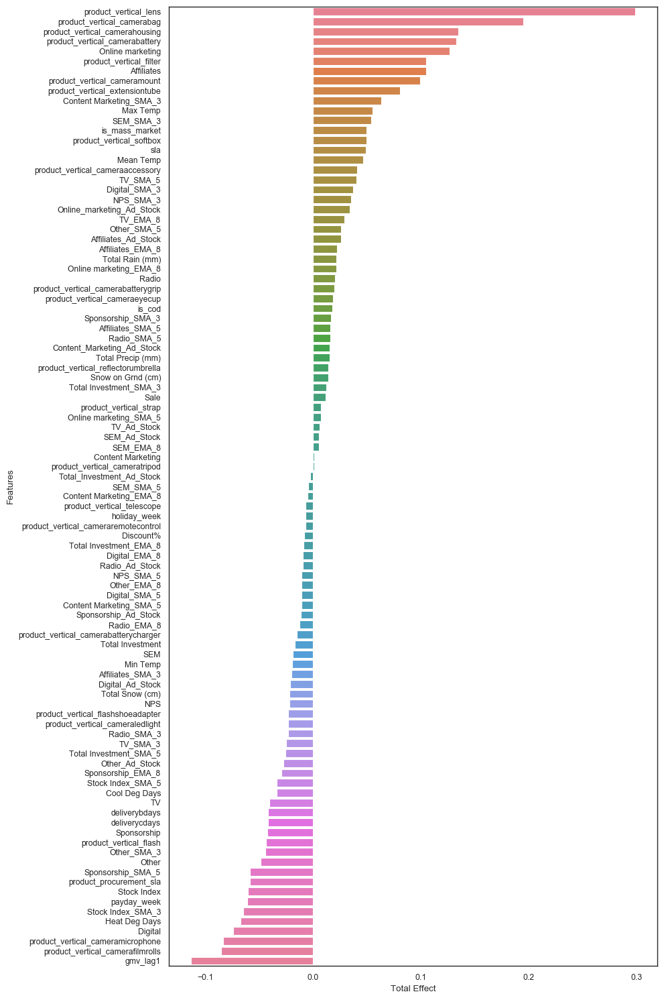

In [319]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Total Effect', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_lens|	0.299|
|product_vertical_camerabag|	0.195|
|product_vertical_camerahousing	|0.135|
|product_vertical_camerabattery|	0.133|
|Online marketing|	0.127|

## Building Linear Regression model for `gamingaccessory`

In [320]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_model = LinearRegression().fit(X_gamingaccessory_train, y_gamingaccessory_train)
y_gamingaccessory_test_pred = gamingaccessory_model.predict(X_gamingaccessory_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_test, y_gamingaccessory_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_test, y_gamingaccessory_test_pred)))

R2 Score: 0.9320877359342647
Mean Squared Error: 0.054352830557210866


##### With Simple Linear Regression, we get a r2 score of 0.93 and mse of 0.05

## Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [321]:
y_gamingaccessory = gamingaccessory_koy_df.pop('gmv')
X_gamingaccessory = gamingaccessory_koy_df

In [322]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_model_cv = LinearRegression().fit(X_gamingaccessory, y_gamingaccessory)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model_cv, X_gamingaccessory, y_gamingaccessory, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.49230878182346416
Mean Squared Error: 0.5076912181765358


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.49 and mse score of 0.51

## Determining Feature Importance for `gamingaccessory` with model without cv

In [323]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_model.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.021),
 ('gmv_lag1', -0.015),
 ('Discount%', -0.004),
 ('deliverybdays', 0.018),
 ('deliverycdays', 0.018),
 ('sla', 0.061),
 ('product_procurement_sla', 0.03),
 ('is_cod', 0.059),
 ('is_mass_market', 0.165),
 ('product_vertical_gamecontrolmount', -0.013),
 ('product_vertical_gamepad', 0.202),
 ('product_vertical_gamingaccessorykit', 0.117),
 ('product_vertical_gamingadapter', 0.046),
 ('product_vertical_gamingchargingstation', 0.008),
 ('product_vertical_gamingheadset', 0.175),
 ('product_vertical_gamingkeyboard', 0.075),
 ('product_vertical_gamingmemorycard', 0.032),
 ('product_vertical_gamingmouse', 0.108),
 ('product_vertical_gamingmousepad', -0.0),
 ('product_vertical_gamingspeaker', 0.035),
 ('product_vertical_joystickgamingwheel', 0.086),
 ('product_vertical_motioncontroller', 0.053),
 ('product_vertical_tvoutcableaccessory', 0.092),
 ('payday_week', -0.04),
 ('holiday_week', -0.01),
 ('Total Investment', 0.003),
 ('Total Investment_SMA_3', -0.001),
 ('Total Inves

In [324]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
10,product_vertical_gamepad,0.202
14,product_vertical_gamingheadset,0.175
8,is_mass_market,0.165
11,product_vertical_gamingaccessorykit,0.117
17,product_vertical_gamingmouse,0.108
22,product_vertical_tvoutcableaccessory,0.092
20,product_vertical_joystickgamingwheel,0.086
85,Cool Deg Days,0.081
30,TV,0.079
15,product_vertical_gamingkeyboard,0.075


## Determining Total Effect of KPIs from Koyck model

*Equation for Koyck Model:*

__Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

##### Calculating the coefficient of lag variable

In [325]:
gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   -0.015
Name: Coefficients, dtype: float64

In [326]:
gamingaccessory_lr_coef_df['Total Effect'] = gamingaccessory_lr_coef_df['Coefficients']/(1-(-0.015))
gamingaccessory_lr_coef_df

,Features,Coefficients,Total Effect
10,product_vertical_gamepad,0.202,0.199
14,product_vertical_gamingheadset,0.175,0.172
8,is_mass_market,0.165,0.163
11,product_vertical_gamingaccessorykit,0.117,0.115
17,product_vertical_gamingmouse,0.108,0.106
22,product_vertical_tvoutcableaccessory,0.092,0.091
20,product_vertical_joystickgamingwheel,0.086,0.085
85,Cool Deg Days,0.081,0.080
30,TV,0.079,0.078
15,product_vertical_gamingkeyboard,0.075,0.074


## Plotting the Features in descending order of Importance for `gamingaccessory`

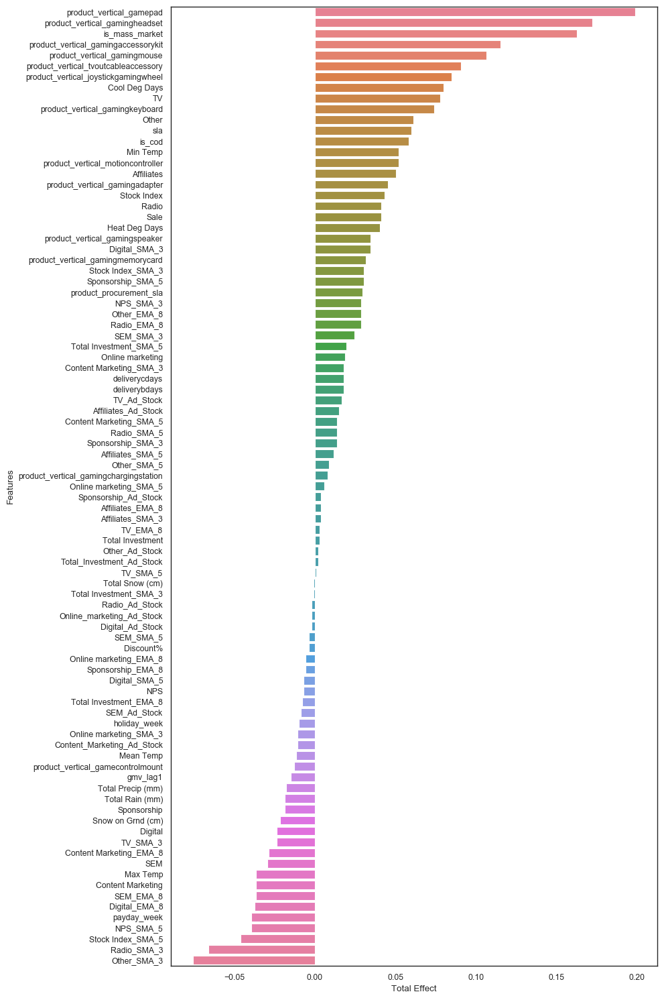

In [327]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Total Effect', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_gamingheadset|	0.199|
|product_vertical_gamingheadset	|0.172|
|is_mass_market	|0.163|
|product_vertical_gamingmouse|	0.125|
|product_vertical_gamingaccessorykit |0.106|

## Building Linear Regression model for `homeaudio`

In [328]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_model = LinearRegression().fit(X_homeaudio_train, y_homeaudio_train)
y_homeaudio_test_pred = homeaudio_model.predict(X_homeaudio_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_test, y_homeaudio_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_test, y_homeaudio_test_pred)))

R2 Score: 0.9609857877052311
Mean Squared Error: 0.09354693362138439


##### With Simple Linear Regression, we get a r2 score of 0.96 and mse of 0.09

## Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [329]:
y_homeaudio = homeaudio_koy_df.pop('gmv')
X_homeaudio = homeaudio_koy_df

In [330]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_model_cv = LinearRegression().fit(X_homeaudio, y_homeaudio)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model_cv, X_homeaudio, y_homeaudio, cv=5)
accuracy = metrics.r2_score(y_homeaudio, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.6961457869557831
Mean Squared Error: 0.3038542130442168


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.70 and mse score of 0.30

## Determining Feature Importance for `homeaudio` with model without cv

In [331]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_model.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.008),
 ('gmv_lag1', 0.06),
 ('Discount%', 0.037),
 ('deliverybdays', -0.021),
 ('deliverycdays', -0.034),
 ('sla', -0.159),
 ('product_procurement_sla', -0.087),
 ('is_cod', 0.152),
 ('is_mass_market', 0.197),
 ('product_vertical_djcontroller', 0.037),
 ('product_vertical_dock', 0.025),
 ('product_vertical_dockingstation', 0.005),
 ('product_vertical_fmradio', 0.087),
 ('product_vertical_hifisystem', 0.073),
 ('product_vertical_homeaudiospeaker', 0.391),
 ('product_vertical_karaokeplayer', 0.0),
 ('product_vertical_slingbox', 0.056),
 ('product_vertical_soundmixer', 0.04),
 ('product_vertical_voicerecorder', 0.012),
 ('payday_week', 0.063),
 ('holiday_week', -0.052),
 ('Total Investment', -0.036),
 ('Total Investment_SMA_3', 0.015),
 ('Total Investment_SMA_5', -0.012),
 ('Total Investment_EMA_8', 0.054),
 ('Total_Investment_Ad_Stock', -0.052),
 ('TV', -0.004),
 ('TV_SMA_3', 0.003),
 ('TV_SMA_5', 0.032),
 ('TV_EMA_8', -0.006),
 ('TV_Ad_Stock', -0.018),
 ('Digital', 0.01

In [332]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
14,product_vertical_homeaudiospeaker,0.391
8,is_mass_market,0.197
7,is_cod,0.152
71,NPS,0.113
79,Mean Temp,0.101
12,product_vertical_fmradio,0.087
59,SEM_EMA_8,0.077
13,product_vertical_hifisystem,0.073
54,Affiliates_EMA_8,0.072
32,Digital_SMA_3,0.066


## Determining Total Effect of KPIs from Koyck model

*Equation for Koyck Model:*

__Yt__ = __α__ + __µYt-1__ + __β1X1__ + __β2X2__ + __β3X3__ + __β4X4__ + __β5X5__ + __ϵ__  -- (sale at time t is dependent on sale at time t-1)

*If 	X1 is the advertising effect, β1 is the current effect of advertising, carry over effect of advertising is β1 * µ/(1-µ).*

*Therefore the total effect of advertising  = Current effect + Carry over effect*

                                            = β1 + β1 * µ/(1-µ)	

											= β1/(1-µ)

##### Calculating the coefficient of lag variable

In [333]:
homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

1   0.060
Name: Coefficients, dtype: float64

In [334]:
homeaudio_lr_coef_df['Total Effect'] = homeaudio_lr_coef_df['Coefficients']/(1-(0.060))
homeaudio_lr_coef_df

,Features,Coefficients,Total Effect
14,product_vertical_homeaudiospeaker,0.391,0.416
8,is_mass_market,0.197,0.210
7,is_cod,0.152,0.162
71,NPS,0.113,0.120
79,Mean Temp,0.101,0.107
12,product_vertical_fmradio,0.087,0.093
59,SEM_EMA_8,0.077,0.082
13,product_vertical_hifisystem,0.073,0.078
54,Affiliates_EMA_8,0.072,0.077
32,Digital_SMA_3,0.066,0.070


## Plotting the Features in descending order of Importance for `homeaudio`

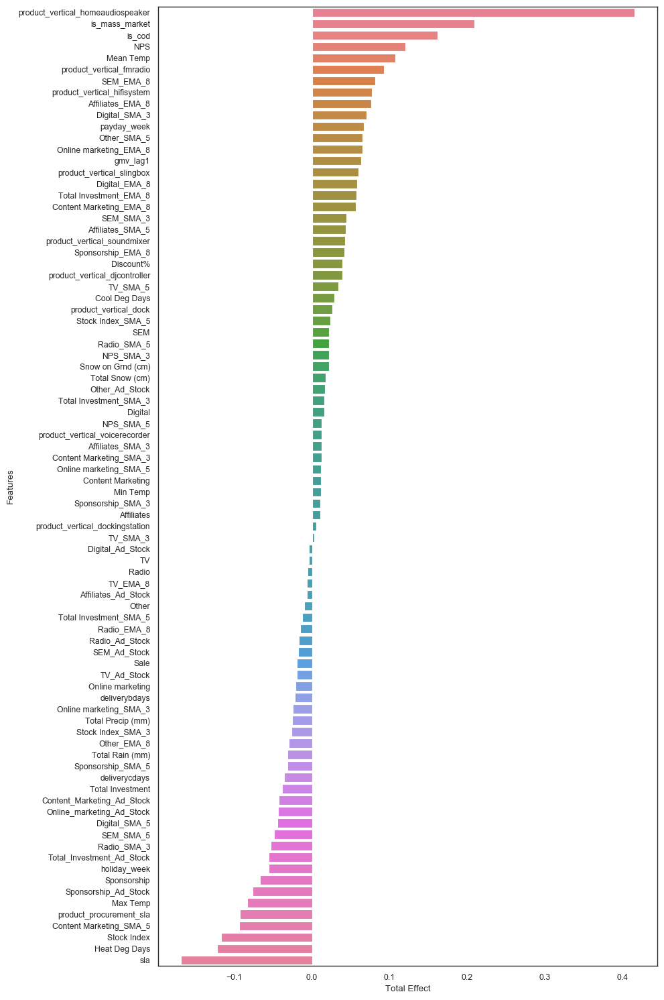

In [335]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Total Effect', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_homeaudiospeaker|	0.416|
|is_mass_market|	0.210|
|is_cod|	0.162|
|NPS|	0.120|
|Mean Temp	|0.107|

## Distributive Lag Model(Additive)

*The Additive and Multiplicative Linear Models that we have built till now can capture the current effect of the KPIs. However, if we want to capture the carry-over effect, we would want to model the current revenue figures based on the past figures of the KPIs.*

*In the distributed lag model, not only is the dependent variable entered in its lagged version, but the independent variables are as well. This is a more generalist model and captures the carry-over effect of all the variables. Thus, the Koyck model is a special type of distributed lag model, which includes the lag value of only the dependent variable.*


  __Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ

In [336]:
homeaudio_org_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [337]:
# Making copy of dataframes from the original ones
cameraaccessory_dladd_df = cameraaccessory_org_df.copy()
gamingaccessory_dladd_df = gamingaccessory_org_df.copy()
homeaudio_dladd_df = homeaudio_org_df.copy()
homeaudio_dladd_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [338]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale,0,0.000
Digital,0,0.000
Total Investment_SMA_5,0,0.000
Total Investment_EMA_8,0,0.000
Total_Investment_Ad_Stock,0,0.000


#### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [339]:
# removing columns
cameraaccessory_dladd_df = cameraaccessory_dladd_df.drop('Week', axis=1)
gamingaccessory_dladd_df = gamingaccessory_dladd_df.drop('Week', axis=1)
homeaudio_dladd_df = homeaudio_dladd_df.drop('Week', axis=1)
homeaudio_dladd_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


### Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [340]:
cameraaccessory_dladd_df_columns = cameraaccessory_dladd_df.columns
gamingaccessory_dladd_df_columns = gamingaccessory_dladd_df.columns
homeaudio_dladd_df_columns = homeaudio_dladd_df.columns

In [341]:
cameraaccessory_dladd_df = lag_variables(cameraaccessory_dladd_df,cameraaccessory_dladd_df_columns,3)
gamingaccessory_dladd_df = lag_variables(gamingaccessory_dladd_df,gamingaccessory_dladd_df_columns,3)
homeaudio_dladd_df = lag_variables(homeaudio_dladd_df,homeaudio_dladd_df_columns,3)
homeaudio_dladd_df.head()

,gmv,gmv_lag3,Discount%,Discount%_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,is_cod,is_cod_lag3,is_mass_market,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag3,holiday_week,holiday_week_lag3,Total Investment,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag3,TV,TV_lag3,TV_SMA_3,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag3,Digital,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag3,SEM,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag3,Radio,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag3,Other,Other_lag3,Other_SMA_3,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag3,Other_Ad_Stock,Other_Ad_Stock_lag3,NPS,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag3,Stock Index,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag3,Max Temp,Max Temp_lag3,Min Temp,Min Temp_lag3,Mean Temp,Mean Temp_lag3,Heat Deg Days,Heat Deg Days_lag3,Cool Deg Days,Cool Deg Days_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Sale,Sale_lag3
25,4573783.133,nan,31.451,nan,0.000,nan,0.000,nan,7.369,nan,2.863,nan,1583,nan,1366,nan,8,nan,33,nan,1,nan,516.000,nan,23,nan,1374.000,nan,0,nan,0,nan,0,nan,63,nan,0,nan,0,nan,4.265,nan,0.000,nan,0.000,nan,4.265,nan,4.265,nan,0.054,nan,0.000,nan,0.000,nan,0.054,nan,0.054,nan,0.633,nan,0.000,nan,0.000,nan,0.633,nan,0.633,nan,1.854,nan,0.000,nan,0.000,nan,1.854,nan,1.854,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.332,nan,0.000,nan,0.000,nan,0.332,nan,0.332,nan,0.137,nan,0.000,nan,0.000,nan,0.137,nan,0.137,nan,1.256,nan,0.000,nan,0.000,nan,1.256,nan,1.256,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,54.600,nan,0.000,nan,0.000,nan,1177.000,nan,0.000,nan,0.000,nan,28.000,nan,12.500,nan,20.100,nan,0.283,nan,2.383,nan,4.417,

### Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [342]:
cameraaccessory_dladd_df = lag_variables(cameraaccessory_dladd_df,cameraaccessory_dladd_df_columns,2)
gamingaccessory_dladd_df = lag_variables(gamingaccessory_dladd_df,gamingaccessory_dladd_df_columns,2)
homeaudio_dladd_df = lag_variables(homeaudio_dladd_df,homeaudio_dladd_df_columns,2)
homeaudio_dladd_df.head()

,gmv,gmv_lag2,gmv_lag3,Discount%,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag2,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag2,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag2,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag2,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag2,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag2,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag2,Affiliates_Ad_Stock_lag3,SEM,SEM_lag2,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag2,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag2,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag2,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag2,SEM_Ad_Stock_lag3,Radio,Radio_lag2,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag2,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag2,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag2,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad

### Creating new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

In [343]:
cameraaccessory_dladd_df = lag_variables(cameraaccessory_dladd_df,cameraaccessory_dladd_df_columns,1)
gamingaccessory_dladd_df = lag_variables(gamingaccessory_dladd_df,gamingaccessory_dladd_df_columns,1)
homeaudio_dladd_df = lag_variables(homeaudio_dladd_df,homeaudio_dladd_df_columns,1)
homeaudio_dladd_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online m

####  Imputing all null values with 0

In [344]:
# Imputing all null values with 0
cameraaccessory_dladd_df.fillna(value=0, inplace=True)
gamingaccessory_dladd_df.fillna(value=0, inplace=True)
homeaudio_dladd_df.fillna(value=0, inplace=True)
homeaudio_dladd_df.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online m

In [345]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale_lag3,0,0.000
TV_Ad_Stock_lag1,0,0.000
TV_SMA_5_lag1,0,0.000
TV_SMA_5_lag2,0,0.000
TV_SMA_5_lag3,0,0.000


## Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [346]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_dladd_df[cameraaccessory_dladd_df.columns]=scaler.fit_transform(cameraaccessory_dladd_df[cameraaccessory_dladd_df.columns])
gamingaccessory_dladd_df[gamingaccessory_dladd_df.columns]=scaler.fit_transform(gamingaccessory_dladd_df[gamingaccessory_dladd_df.columns])
homeaudio_dladd_df[homeaudio_dladd_df.columns]=scaler.fit_transform(homeaudio_dladd_df[homeaudio_dladd_df.columns])

homeaudio_dladd_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online m

## Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [347]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_dladd_train, cameraaccessory_dladd_test = train_test_split(cameraaccessory_dladd_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_dladd_train, gamingaccessory_dladd_test = train_test_split(gamingaccessory_dladd_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_dladd_train, homeaudio_dladd_test = train_test_split(homeaudio_dladd_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the 3 dataframes into X and Y sets for the model building

In [348]:
y_cameraaccessory_dladd_train = cameraaccessory_dladd_train.pop('gmv')
X_cameraaccessory_dladd_train = cameraaccessory_dladd_train

y_gamingaccessory_dladd_train = gamingaccessory_dladd_train.pop('gmv')
X_gamingaccessory_dladd_train = gamingaccessory_dladd_train

y_homeaudio_dladd_train = homeaudio_dladd_train.pop('gmv')
X_homeaudio_dladd_train = homeaudio_dladd_train

X_homeaudio_dladd_train.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marke

## Dividing into X and Y test sets for the model building for 3 dataframes

In [349]:
y_cameraaccessory_dladd_test = cameraaccessory_dladd_test.pop('gmv')
X_cameraaccessory_dladd_test = cameraaccessory_dladd_test

y_gamingaccessory_dladd_test = gamingaccessory_dladd_test.pop('gmv')
X_gamingaccessory_dladd_test = gamingaccessory_dladd_test

y_homeaudio_dladd_test = homeaudio_dladd_test.pop('gmv')
X_homeaudio_dladd_test = homeaudio_dladd_test

X_homeaudio_dladd_test.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marke

## Building Linear Regression model for `cameraaccessory`

In [350]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_dladd_model = LinearRegression().fit(X_cameraaccessory_dladd_train, y_cameraaccessory_dladd_train)
y_cameraaccessory_dladd_test_pred = cameraaccessory_dladd_model.predict(X_cameraaccessory_dladd_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dladd_test, y_cameraaccessory_dladd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dladd_test, y_cameraaccessory_dladd_test_pred)))

R2 Score: 0.8742905512960248
Mean Squared Error: 0.1244141862993106


##### With Simple Linear Regression, we get a r2 score of 0.87 and mse of 0.12

## Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [351]:
y_cameraaccessory_dladd = cameraaccessory_dladd_df.pop('gmv')
X_cameraaccessory_dladd = cameraaccessory_dladd_df

In [352]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_dladd_model_cv = LinearRegression().fit(X_cameraaccessory_dladd, y_cameraaccessory_dladd)
cameraaccessory_dladd_predictions_cv = cross_val_predict(cameraaccessory_dladd_model_cv, X_cameraaccessory_dladd, \
                                                         y_cameraaccessory_dladd, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_dladd, cameraaccessory_dladd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dladd, cameraaccessory_dladd_predictions_cv)))

Cross-Predicted Accuracy: 0.8245924793507575
Mean Squared Error: 0.17540752064924253


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.82 and mse score of 0.17

## Determining Feature Importance for `cameraaccessory` with model with cv

In [353]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_dladd_model_cv.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_dladd_model_cv.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_dladd_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', -0.018),
 ('gmv_lag2', -0.02),
 ('gmv_lag3', -0.001),
 ('Discount%', 0.002),
 ('Discount%_lag1', 0.006),
 ('Discount%_lag2', 0.011),
 ('Discount%_lag3', 0.018),
 ('deliverybdays', 0.002),
 ('deliverybdays_lag1', -0.002),
 ('deliverybdays_lag2', -0.002),
 ('deliverybdays_lag3', 0.005),
 ('deliverycdays', 0.003),
 ('deliverycdays_lag1', -0.003),
 ('deliverycdays_lag2', -0.002),
 ('deliverycdays_lag3', 0.005),
 ('sla', -0.003),
 ('sla_lag1', -0.001),
 ('sla_lag2', 0.006),
 ('sla_lag3', 0.003),
 ('product_procurement_sla', 0.031),
 ('product_procurement_sla_lag1', 0.016),
 ('product_procurement_sla_lag2', -0.006),
 ('product_procurement_sla_lag3', -0.016),
 ('is_cod', 0.064),
 ('is_cod_lag1', -0.009),
 ('is_cod_lag2', 0.017),
 ('is_cod_lag3', 0.001),
 ('is_mass_market', 0.078),
 ('is_mass_market_lag1', -0.018),
 ('is_mass_market_lag2', -0.0),
 ('is_mass_market_lag3', 0.001),
 ('product_vertical_cameraaccessory', 0.051),
 ('product_vertical_cameraaccessory_

In [354]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
100,product_vertical_lens,0.121
88,product_vertical_filter,0.117
36,product_vertical_camerabag,0.102
76,product_vertical_cameraremotecontrol,0.094
28,is_mass_market,0.078
80,product_vertical_cameratripod,0.078
40,product_vertical_camerabattery,0.070
24,is_cod,0.064
82,product_vertical_cameratripod_lag2,0.056
32,product_vertical_cameraaccessory,0.051


## Plotting the Features in descending order of Importance for `cameraaccessory`

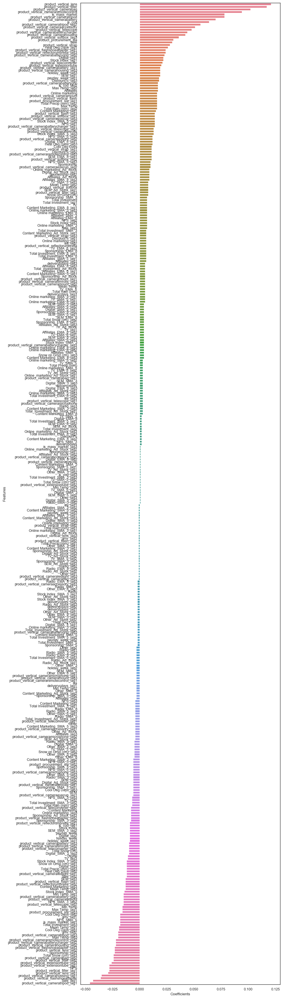

In [355]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_lens	|0.121|
|product_vertical_filter	|0.117|
|product_vertical_camerabag	|0.102|
|product_vertical_cameraremotecontrol	|0.094|
|is_mass_market	|0.079|

## Building Linear Regression model for `gamingaccessory`

In [356]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_dladd_model = LinearRegression().fit(X_gamingaccessory_dladd_train, y_gamingaccessory_dladd_train)
y_gamingaccessory_dladd_test_pred = gamingaccessory_dladd_model.predict(X_gamingaccessory_dladd_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dladd_test, y_gamingaccessory_dladd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dladd_test, y_gamingaccessory_dladd_test_pred)))

R2 Score: 0.8743788823250918
Mean Squared Error: 0.1005394742366821


##### With Simple Linear Regression, we get a r2 score of 0.87 and mse of 0.10

## Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [357]:
y_gamingaccessory_dladd = gamingaccessory_dladd_df.pop('gmv')
X_gamingaccessory_dladd = gamingaccessory_dladd_df

In [358]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_dladd_model_cv = LinearRegression().fit(X_gamingaccessory_dladd, y_gamingaccessory_dladd)
gamingaccessory_dladd_predictions_cv = cross_val_predict(gamingaccessory_dladd_model_cv, X_gamingaccessory_dladd, \
                                                         y_gamingaccessory_dladd, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_dladd, gamingaccessory_dladd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dladd, gamingaccessory_dladd_predictions_cv)))

Cross-Predicted Accuracy: 0.9190399425054063
Mean Squared Error: 0.08096005749459373


##### With Simple Linear Regression, using cross validation, we get a r2 score of 0.92 and mse score of 0.08

## Determining Feature Importance for `gamingaccessory` with model with cv

In [359]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_dladd_model_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_dladd_model_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_dladd_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', -0.013),
 ('gmv_lag2', -0.019),
 ('gmv_lag3', -0.006),
 ('Discount%', 0.007),
 ('Discount%_lag1', -0.009),
 ('Discount%_lag2', 0.021),
 ('Discount%_lag3', -0.01),
 ('deliverybdays', 0.024),
 ('deliverybdays_lag1', -0.005),
 ('deliverybdays_lag2', -0.003),
 ('deliverybdays_lag3', 0.02),
 ('deliverycdays', 0.026),
 ('deliverycdays_lag1', -0.004),
 ('deliverycdays_lag2', -0.004),
 ('deliverycdays_lag3', 0.02),
 ('sla', 0.016),
 ('sla_lag1', -0.011),
 ('sla_lag2', 0.005),
 ('sla_lag3', -0.015),
 ('product_procurement_sla', 0.017),
 ('product_procurement_sla_lag1', -0.01),
 ('product_procurement_sla_lag2', 0.01),
 ('product_procurement_sla_lag3', 0.013),
 ('is_cod', 0.061),
 ('is_cod_lag1', 0.001),
 ('is_cod_lag2', -0.005),
 ('is_cod_lag3', 0.004),
 ('is_mass_market', 0.109),
 ('is_mass_market_lag1', -0.005),
 ('is_mass_market_lag2', -0.012),
 ('is_mass_market_lag3', -0.007),
 ('product_vertical_gamecontrolmount', 0.0),
 ('product_vertical_gamecontrolmount_

In [360]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
36,product_vertical_gamepad,0.150
40,product_vertical_gamingaccessorykit,0.115
28,is_mass_market,0.109
80,product_vertical_motioncontroller,0.100
56,product_vertical_gamingkeyboard,0.089
84,product_vertical_tvoutcableaccessory,0.087
52,product_vertical_gamingheadset,0.086
72,product_vertical_gamingspeaker,0.078
64,product_vertical_gamingmouse,0.077
68,product_vertical_gamingmousepad,0.076


## Plotting the Features in descending order of Importance for `gamingaccessory`

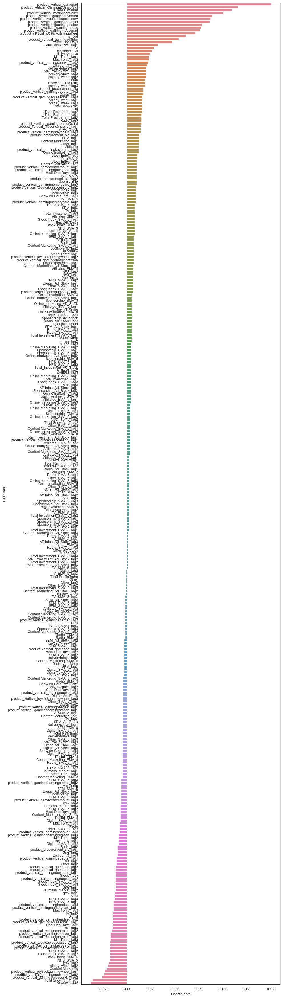

In [361]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_gamepad	|0.150|
|product_vertical_gamingaccessorykit	|0.115|
|is_mass_market	|0.109|
|product_vertical_motioncontroller	|0.100|
|product_vertical_gamingkeyboard	|0.089|

## Building Linear Regression model for `homeaudio`

In [362]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_dladd_model = LinearRegression().fit(X_homeaudio_dladd_train, y_homeaudio_dladd_train)
y_homeaudio_dladd_test_pred = homeaudio_dladd_model.predict(X_homeaudio_dladd_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dladd_test, y_homeaudio_dladd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dladd_test, y_homeaudio_dladd_test_pred)))

R2 Score: 0.4217084353976772
Mean Squared Error: 1.3866075828708604


##### With Simple Linear Regression, we get a r2 score of 0.42 and mse of 1.39

## Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [363]:
y_homeaudio_dladd = homeaudio_dladd_df.pop('gmv')
X_homeaudio_dladd = homeaudio_dladd_df

In [364]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_dladd_model_cv = LinearRegression().fit(X_homeaudio_dladd, y_homeaudio_dladd)
homeaudio_dladd_predictions_cv = cross_val_predict(homeaudio_dladd_model_cv, X_homeaudio_dladd, y_homeaudio_dladd, cv=10)
accuracy = metrics.r2_score(y_homeaudio_dladd, homeaudio_dladd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dladd, homeaudio_dladd_predictions_cv)))

Cross-Predicted Accuracy: 0.5527863980218846
Mean Squared Error: 0.44721360197811527


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.55 and mse score of 0.45

## Determining Feature Importance for `homeaudio`

In [365]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_dladd_model_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_dladd_model_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = homeaudio_dladd_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.0),
 ('gmv_lag1', -0.029),
 ('gmv_lag2', -0.015),
 ('gmv_lag3', -0.002),
 ('Discount%', 0.073),
 ('Discount%_lag1', -0.006),
 ('Discount%_lag2', -0.004),
 ('Discount%_lag3', 0.028),
 ('deliverybdays', 0.002),
 ('deliverybdays_lag1', -0.005),
 ('deliverybdays_lag2', 0.002),
 ('deliverybdays_lag3', -0.01),
 ('deliverycdays', 0.002),
 ('deliverycdays_lag1', -0.004),
 ('deliverycdays_lag2', 0.002),
 ('deliverycdays_lag3', -0.01),
 ('sla', -0.018),
 ('sla_lag1', -0.003),
 ('sla_lag2', 0.025),
 ('sla_lag3', -0.02),
 ('product_procurement_sla', -0.04),
 ('product_procurement_sla_lag1', 0.022),
 ('product_procurement_sla_lag2', -0.003),
 ('product_procurement_sla_lag3', 0.023),
 ('is_cod', 0.145),
 ('is_cod_lag1', -0.017),
 ('is_cod_lag2', -0.002),
 ('is_cod_lag3', 0.003),
 ('is_mass_market', 0.162),
 ('is_mass_market_lag1', -0.02),
 ('is_mass_market_lag2', -0.011),
 ('is_mass_market_lag3', -0.005),
 ('product_vertical_djcontroller', 0.027),
 ('product_vertical_djcontroller_la

In [366]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
52,product_vertical_homeaudiospeaker,0.184
56,product_vertical_karaokeplayer,0.174
28,is_mass_market,0.162
24,is_cod,0.145
44,product_vertical_fmradio,0.094
4,Discount%,0.073
36,product_vertical_dock,0.067
48,product_vertical_hifisystem,0.066
121,Digital_lag1,0.049
221,SEM_lag1,0.037


## Plotting the Features in descending order of Importance for `homeaudio`

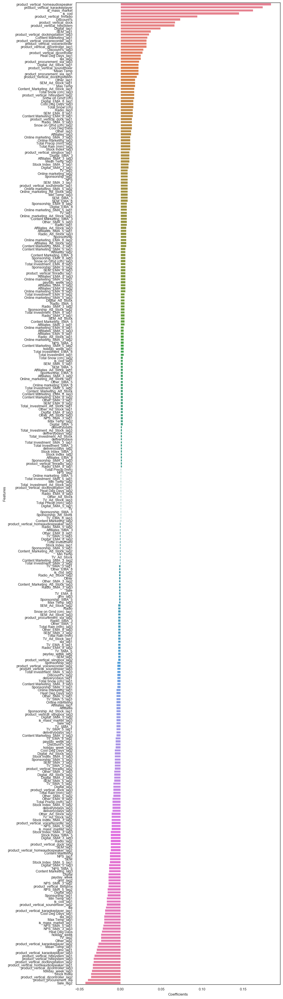

In [367]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_homeaudiospeaker	|0.184|
|product_vertical_karaokeplayer	|0.173|
|is_mass_market	|0.162|
|is_cod	|0.145|
|product_vertical_fmradio	|0.094|

## Distributive Lag Model(Multiplicative)

*The Distributive Lag Model(Additive) helped us capture the not only the current, but also the carry-over effect of all the variables(depedent and independent).*


  __Yt__ = α+ µ1Yt-1 + µ2Yt-2 + µ3Yt-3 + ....

        + β1X1t + β1X1t-1 + β1X1t-2 + ....

        + β2X2t + β2X2t-1 + β2X2t-2 + ....

        + β3X3t + β3X3t-1 + β3X3t-2 + ....

        + β4X4t + β4X4t-1 + β4X4t-2 + ....

        + β5X5t + β5X5t-1 + β5X5t-2 + ....

        + ϵ
        
*Now the Distributive Lag Model(Multiplicative) will help us capture the interactions between current and carry over effects of the KPIs.*

*To fit a multiplicative model, take logarithms of the data(on both sides of the model), then analyse the log data as before.*

  __Yt__ = α+ µ1ln(Yt-1) + µ2ln(Yt-2) + µ3ln(Yt-3) + ....

        + β1ln(X1t) + β1ln(X1t-1) + β1ln(X1t-2) + ....

        + β2ln(X2t) + β2ln(X2t-1) + β2ln(X2t-2) + ....

        + β3ln(X3t) + β3ln(X3t-1) + β3ln(X3t-2) + ....

        + β4ln(X4t) + β4ln(X4t-1) + β4ln(X4t-2) + ....

        + β5ln(X5t) + β5ln(X5t-1) + β5ln(X5t-2) + ....

        + ϵ'

In [368]:
homeaudio_org_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [369]:
# Making copy of dataframes from the original ones
cameraaccessory_dlmul_df = cameraaccessory_org_df.copy()
gamingaccessory_dlmul_df = gamingaccessory_org_df.copy()
homeaudio_dlmul_df = homeaudio_org_df.copy()
homeaudio_dlmul_df.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,28,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,29,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,30,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,31,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,32,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


In [370]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale_lag3,0,0.000
TV_Ad_Stock_lag1,0,0.000
TV_SMA_5_lag1,0,0.000
TV_SMA_5_lag2,0,0.000
TV_SMA_5_lag3,0,0.000


#### We will drop the `Week` column as it is a row identifier and will not help in prediction of revenue

In [371]:
# removing columns
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.drop('Week', axis=1)
gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.drop('Week', axis=1)
homeaudio_dlmul_df = homeaudio_dlmul_df.drop('Week', axis=1)
homeaudio_dlmul_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ad_Stock,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_Ad_Stock,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_Ad_Stock,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_Ad_Stock,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_Ad_Stock,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_Ad_Stock,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_Ad_Stock,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_Ad_Stock,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_Ad_Stock,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_Ad_Stock,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Max Temp,Min Temp,Mean Temp,Heat Deg Days,Cool Deg Days,Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),Sale
25,4573783.133,31.451,0.000,0.000,7.369,2.863,1583,1366,8,33,1,516.000,23,1374.000,0,0,0,63,0,0,4.265,0.000,0.000,4.265,4.265,0.054,0.000,0.000,0.054,0.054,0.633,0.000,0.000,0.633,0.633,1.854,0.000,0.000,1.854,1.854,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.332,0.137,0.000,0.000,0.137,0.137,1.256,0.000,0.000,1.256,1.256,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,28.000,12.500,20.100,0.283,2.383,4.417,0.000,4.417,0.000,0
26,5371525.000,32.967,0.000,0.000,6.985,2.746,1868,1610,7,50,1,574.000,42,1623.000,0,0,0,69,1,0,4.265,0.000,0.000,4.265,6.824,0.054,0.000,0.000,0.054,0.086,0.633,0.000,0.000,0.633,1.013,1.854,0.000,0.000,1.854,2.966,0.000,0.000,0.000,0.000,0.000,0.332,0.000,0.000,0.332,0.531,0.137,0.000,0.000,0.137,0.219,1.256,0.000,0.000,1.256,2.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,0.000,0.000,1177.000,0.000,0.000,33.000,11.000,23.183,0.000,5.183,1.400,0.000,1.400,0.000,2
27,4679828.000,32.357,0.000,0.000,7.072,2.861,1758,1569,4,56,0,577.000,36,1430.000,0,0,0,46,0,0,4.265,4.265,0.000,4.265,8.359,0.054,0.054,0.000,0.054,0.106,0.633,0.633,0.000,0.633,1.241,1.854,1.854,0.000,1.854,3.634,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.651,0.137,0.137,0.000,0.137,0.269,1.256,1.256,0.000,1.256,2.462,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,31.500,14.500,23.060,0.000,5.060,1.080,0.000,1.080,0.000,0
28,3451151.000,32.208,0.000,0.000,7.201,2.735,1244,1072,2,43,0,420.000,20,1025.000,0,0,0,44,1,0,4.265,4.265,0.000,4.265,9.281,0.054,0.054,0.000,0.054,0.118,0.633,0.633,0.000,0.633,1.377,1.854,1.854,0.000,1.854,4.034,0.000,0.000,0.000,0.000,0.000,0.332,0.332,0.000,0.332,0.722,0.137,0.137,0.000,0.137,0.298,1.256,1.256,0.000,1.256,2.733,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,54.600,54.600,0.000,1177.000,1177.000,0.000,33.500,16.000,24.567,0.000,6.567,4.633,0.000,4.633,0.000,0
29,2599.000,16.130,0.000,0.000,9.000,2.000,0,0,0,0,0,0.000,0,1.000,0,0,0,0,0,0,1.013,3.181,3.615,3.542,6.581,0.001,0.036,0.043,0.042,0.072,0.256,0.507,0.558,0.549,1.082,0.213,1.307,1.526,1.489,2.634,0.000,0.000,0.000,0.000,0.000,0.026,0.230,0.271,0.264,0.459,0.015,0.096,0.113,0.110,0.194,0.503,1.005,1.105,1.089,2.143,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,59.987,56.395,55.677,1206.000,1186.667,1182.800,28.500,15.000,21.650,0.000,3.650,0.350,0.000,0.350,0.000,0


### Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

In [372]:
cameraaccessory_dlmul_df_columns = cameraaccessory_dlmul_df.columns
gamingaccessory_dlmul_df_columns = gamingaccessory_dlmul_df.columns
homeaudio_dlmul_df_columns = homeaudio_dlmul_df.columns

In [373]:
cameraaccessory_dlmul_df = lag_variables(cameraaccessory_dlmul_df,cameraaccessory_dlmul_df_columns,3)
gamingaccessory_dlmul_df = lag_variables(gamingaccessory_dlmul_df,gamingaccessory_dlmul_df_columns,3)
homeaudio_dlmul_df = lag_variables(homeaudio_dlmul_df,homeaudio_dlmul_df_columns,3)
homeaudio_dlmul_df.head()

,gmv,gmv_lag3,Discount%,Discount%_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,is_cod,is_cod_lag3,is_mass_market,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag3,holiday_week,holiday_week_lag3,Total Investment,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag3,TV,TV_lag3,TV_SMA_3,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag3,Digital,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag3,SEM,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag3,Radio,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad_Stock_lag3,Other,Other_lag3,Other_SMA_3,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag3,Other_Ad_Stock,Other_Ad_Stock_lag3,NPS,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag3,Stock Index,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag3,Max Temp,Max Temp_lag3,Min Temp,Min Temp_lag3,Mean Temp,Mean Temp_lag3,Heat Deg Days,Heat Deg Days_lag3,Cool Deg Days,Cool Deg Days_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,Sale,Sale_lag3
25,4573783.133,nan,31.451,nan,0.000,nan,0.000,nan,7.369,nan,2.863,nan,1583,nan,1366,nan,8,nan,33,nan,1,nan,516.000,nan,23,nan,1374.000,nan,0,nan,0,nan,0,nan,63,nan,0,nan,0,nan,4.265,nan,0.000,nan,0.000,nan,4.265,nan,4.265,nan,0.054,nan,0.000,nan,0.000,nan,0.054,nan,0.054,nan,0.633,nan,0.000,nan,0.000,nan,0.633,nan,0.633,nan,1.854,nan,0.000,nan,0.000,nan,1.854,nan,1.854,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.332,nan,0.000,nan,0.000,nan,0.332,nan,0.332,nan,0.137,nan,0.000,nan,0.000,nan,0.137,nan,0.137,nan,1.256,nan,0.000,nan,0.000,nan,1.256,nan,1.256,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,0.000,nan,54.600,nan,0.000,nan,0.000,nan,1177.000,nan,0.000,nan,0.000,nan,28.000,nan,12.500,nan,20.100,nan,0.283,nan,2.383,nan,4.417,

### Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

In [374]:
cameraaccessory_dlmul_df = lag_variables(cameraaccessory_dlmul_df,cameraaccessory_dlmul_df_columns,2)
gamingaccessory_dlmul_df = lag_variables(gamingaccessory_dlmul_df,gamingaccessory_dlmul_df_columns,2)
homeaudio_dlmul_df = lag_variables(homeaudio_dlmul_df,homeaudio_dlmul_df_columns,2)
homeaudio_dlmul_df.head()

,gmv,gmv_lag2,gmv_lag3,Discount%,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Online marketing_SMA_3,Online marketing_SMA_3_lag2,Online marketing_SMA_3_lag3,Online marketing_SMA_5,Online marketing_SMA_5_lag2,Online marketing_SMA_5_lag3,Online marketing_EMA_8,Online marketing_EMA_8_lag2,Online marketing_EMA_8_lag3,Online_marketing_Ad_Stock,Online_marketing_Ad_Stock_lag2,Online_marketing_Ad_Stock_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,Affiliates_SMA_3,Affiliates_SMA_3_lag2,Affiliates_SMA_3_lag3,Affiliates_SMA_5,Affiliates_SMA_5_lag2,Affiliates_SMA_5_lag3,Affiliates_EMA_8,Affiliates_EMA_8_lag2,Affiliates_EMA_8_lag3,Affiliates_Ad_Stock,Affiliates_Ad_Stock_lag2,Affiliates_Ad_Stock_lag3,SEM,SEM_lag2,SEM_lag3,SEM_SMA_3,SEM_SMA_3_lag2,SEM_SMA_3_lag3,SEM_SMA_5,SEM_SMA_5_lag2,SEM_SMA_5_lag3,SEM_EMA_8,SEM_EMA_8_lag2,SEM_EMA_8_lag3,SEM_Ad_Stock,SEM_Ad_Stock_lag2,SEM_Ad_Stock_lag3,Radio,Radio_lag2,Radio_lag3,Radio_SMA_3,Radio_SMA_3_lag2,Radio_SMA_3_lag3,Radio_SMA_5,Radio_SMA_5_lag2,Radio_SMA_5_lag3,Radio_EMA_8,Radio_EMA_8_lag2,Radio_EMA_8_lag3,Radio_Ad_Stock,Radio_Ad

### Creating new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

In [375]:
cameraaccessory_dlmul_df = lag_variables(cameraaccessory_dlmul_df,cameraaccessory_dlmul_df_columns,1)
gamingaccessory_dlmul_df = lag_variables(gamingaccessory_dlmul_df,gamingaccessory_dlmul_df_columns,1)
homeaudio_dlmul_df = lag_variables(homeaudio_dlmul_df,homeaudio_dlmul_df_columns,1)
homeaudio_dlmul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online m

####  Imputing all null values with 0

In [376]:
# Imputing all null values with 0
cameraaccessory_dlmul_df.fillna(value=0, inplace=True)
gamingaccessory_dlmul_df.fillna(value=0, inplace=True)
homeaudio_dlmul_df.fillna(value=0, inplace=True)
homeaudio_dlmul_df.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online m

In [377]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dladd_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dladd_df.isnull().sum()/homeaudio_dladd_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale_lag3,0,0.000
TV_Ad_Stock_lag1,0,0.000
TV_SMA_5_lag1,0,0.000
TV_SMA_5_lag2,0,0.000
TV_SMA_5_lag3,0,0.000


### Taking Logarithm of both the Dependent and the independent variables

##### After taking log, all 0 values will be transformed to `inf`. Retransforming these values to 0.

In [378]:
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.applymap(lambda x: np.log(x))
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.replace([np.inf, -np.inf], 0)
cameraaccessory_dlmul_df = cameraaccessory_dlmul_df.replace(np.nan, 0)

gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.applymap(lambda x: np.log(x))
gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.replace([np.inf, -np.inf], 0)
gamingaccessory_dlmul_df = gamingaccessory_dlmul_df.replace(np.nan, 0)

homeaudio_dlmul_df = homeaudio_dlmul_df.applymap(lambda x: np.log(x))
homeaudio_dlmul_df = homeaudio_dlmul_df.replace([np.inf, -np.inf], 0)
homeaudio_dlmul_df = homeaudio_dlmul_df.replace(np.nan, 0)


homeaudio_dlmul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online m

In [379]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(homeaudio_dlmul_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(homeaudio_dlmul_df.isnull().sum()/homeaudio_dlmul_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Sale_lag3,0,0.000
TV_Ad_Stock_lag1,0,0.000
TV_SMA_5_lag1,0,0.000
TV_SMA_5_lag2,0,0.000
TV_SMA_5_lag3,0,0.000


## Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [380]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_dlmul_df[cameraaccessory_dlmul_df.columns]=scaler.fit_transform(cameraaccessory_dlmul_df[cameraaccessory_dlmul_df.columns])
gamingaccessory_dlmul_df[gamingaccessory_dlmul_df.columns]=scaler.fit_transform(gamingaccessory_dlmul_df[gamingaccessory_dlmul_df.columns])
homeaudio_dlmul_df[homeaudio_dlmul_df.columns]=scaler.fit_transform(homeaudio_dlmul_df[homeaudio_dlmul_df.columns])

homeaudio_dlmul_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online m

## Splitting the 3 Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [381]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_dlmul_train, cameraaccessory_dlmul_test = train_test_split(cameraaccessory_dlmul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_dlmul_train, gamingaccessory_dlmul_test = train_test_split(gamingaccessory_dlmul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_dlmul_train, homeaudio_dlmul_test = train_test_split(homeaudio_dlmul_df, \
                                                               train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the 3 dataframes into X and Y sets for the model building

In [382]:
y_cameraaccessory_dlmul_train = cameraaccessory_dlmul_train.pop('gmv')
X_cameraaccessory_dlmul_train = cameraaccessory_dlmul_train

y_gamingaccessory_dlmul_train = gamingaccessory_dlmul_train.pop('gmv')
X_gamingaccessory_dlmul_train = gamingaccessory_dlmul_train

y_homeaudio_dlmul_train = homeaudio_dlmul_train.pop('gmv')
X_homeaudio_dlmul_train = homeaudio_dlmul_train

X_homeaudio_dlmul_train.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marke

## Dividing into X and Y test sets for the model building for 3 dataframes

In [383]:
y_cameraaccessory_dlmul_test = cameraaccessory_dlmul_test.pop('gmv')
X_cameraaccessory_dlmul_test = cameraaccessory_dlmul_test

y_gamingaccessory_dlmul_test = gamingaccessory_dlmul_test.pop('gmv')
X_gamingaccessory_dlmul_test = gamingaccessory_dlmul_test

y_homeaudio_dlmul_test = homeaudio_dlmul_test.pop('gmv')
X_homeaudio_dlmul_test = homeaudio_dlmul_test

X_homeaudio_dlmul_test.head()

,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,product_vertical_hifisystem_lag2,product_vertical_hifisystem_lag3,product_vertical_homeaudiospeaker,product_vertical_homeaudiospeaker_lag1,product_vertical_homeaudiospeaker_lag2,product_vertical_homeaudiospeaker_lag3,product_vertical_karaokeplayer,product_vertical_karaokeplayer_lag1,product_vertical_karaokeplayer_lag2,product_vertical_karaokeplayer_lag3,product_vertical_slingbox,product_vertical_slingbox_lag1,product_vertical_slingbox_lag2,product_vertical_slingbox_lag3,product_vertical_soundmixer,product_vertical_soundmixer_lag1,product_vertical_soundmixer_lag2,product_vertical_soundmixer_lag3,product_vertical_voicerecorder,product_vertical_voicerecorder_lag1,product_vertical_voicerecorder_lag2,product_vertical_voicerecorder_lag3,payday_week,payday_week_lag1,payday_week_lag2,payday_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,Total Investment_SMA_3,Total Investment_SMA_3_lag1,Total Investment_SMA_3_lag2,Total Investment_SMA_3_lag3,Total Investment_SMA_5,Total Investment_SMA_5_lag1,Total Investment_SMA_5_lag2,Total Investment_SMA_5_lag3,Total Investment_EMA_8,Total Investment_EMA_8_lag1,Total Investment_EMA_8_lag2,Total Investment_EMA_8_lag3,Total_Investment_Ad_Stock,Total_Investment_Ad_Stock_lag1,Total_Investment_Ad_Stock_lag2,Total_Investment_Ad_Stock_lag3,TV,TV_lag1,TV_lag2,TV_lag3,TV_SMA_3,TV_SMA_3_lag1,TV_SMA_3_lag2,TV_SMA_3_lag3,TV_SMA_5,TV_SMA_5_lag1,TV_SMA_5_lag2,TV_SMA_5_lag3,TV_EMA_8,TV_EMA_8_lag1,TV_EMA_8_lag2,TV_EMA_8_lag3,TV_Ad_Stock,TV_Ad_Stock_lag1,TV_Ad_Stock_lag2,TV_Ad_Stock_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Digital_SMA_3,Digital_SMA_3_lag1,Digital_SMA_3_lag2,Digital_SMA_3_lag3,Digital_SMA_5,Digital_SMA_5_lag1,Digital_SMA_5_lag2,Digital_SMA_5_lag3,Digital_EMA_8,Digital_EMA_8_lag1,Digital_EMA_8_lag2,Digital_EMA_8_lag3,Digital_Ad_Stock,Digital_Ad_Stock_lag1,Digital_Ad_Stock_lag2,Digital_Ad_Stock_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Sponsorship_SMA_3,Sponsorship_SMA_3_lag1,Sponsorship_SMA_3_lag2,Sponsorship_SMA_3_lag3,Sponsorship_SMA_5,Sponsorship_SMA_5_lag1,Sponsorship_SMA_5_lag2,Sponsorship_SMA_5_lag3,Sponsorship_EMA_8,Sponsorship_EMA_8_lag1,Sponsorship_EMA_8_lag2,Sponsorship_EMA_8_lag3,Sponsorship_Ad_Stock,Sponsorship_Ad_Stock_lag1,Sponsorship_Ad_Stock_lag2,Sponsorship_Ad_Stock_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Content Marketing_SMA_3,Content Marketing_SMA_3_lag1,Content Marketing_SMA_3_lag2,Content Marketing_SMA_3_lag3,Content Marketing_SMA_5,Content Marketing_SMA_5_lag1,Content Marketing_SMA_5_lag2,Content Marketing_SMA_5_lag3,Content Marketing_EMA_8,Content Marketing_EMA_8_lag1,Content Marketing_EMA_8_lag2,Content Marketing_EMA_8_lag3,Content_Marketing_Ad_Stock,Content_Marketing_Ad_Stock_lag1,Content_Marketing_Ad_Stock_lag2,Content_Marketing_Ad_Stock_lag3,Online marke

## Building Linear Regression model for `cameraaccessory`

In [384]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

cameraaccessory_dlmul_model = LinearRegression().fit(X_cameraaccessory_dlmul_train, y_cameraaccessory_dlmul_train)
y_cameraaccessory_dlmul_test_pred = cameraaccessory_dlmul_model.predict(X_cameraaccessory_dlmul_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dlmul_test, y_cameraaccessory_dlmul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dlmul_test, y_cameraaccessory_dlmul_test_pred)))

R2 Score: 0.7750557497374562
Mean Squared Error: 0.49887374500670334


##### With Simple Linear Regression, we get a r2 score of 0.77 and mse of 0.50

## Building Linear Regression model for `cameraaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [385]:
y_cameraaccessory_dlmul = cameraaccessory_dlmul_df.pop('gmv')
X_cameraaccessory_dlmul = cameraaccessory_dlmul_df

In [386]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

cameraaccessory_dlmul_model_cv = LinearRegression().fit(X_cameraaccessory_dlmul, y_cameraaccessory_dlmul)
cameraaccessory_dlmul_predictions_cv = cross_val_predict(cameraaccessory_dlmul_model_cv, X_cameraaccessory_dlmul, \
                                                         y_cameraaccessory_dlmul, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_dlmul, cameraaccessory_dlmul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dlmul, cameraaccessory_dlmul_predictions_cv)))

Cross-Predicted Accuracy: 0.8148003973252801
Mean Squared Error: 0.18519960267471988


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.82 and mse score of 0.18

## Determining Feature Importance for `cameraaccessory` with model with cv

In [387]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


cameraaccessory_lr_model_parameters = list(cameraaccessory_dlmul_model_cv.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_dlmul_model_cv.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_dlmul_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', 0.002),
 ('gmv_lag2', -0.004),
 ('gmv_lag3', -0.003),
 ('Discount%', -0.0),
 ('Discount%_lag1', 0.008),
 ('Discount%_lag2', 0.019),
 ('Discount%_lag3', -0.009),
 ('deliverybdays', -0.001),
 ('deliverybdays_lag1', -0.009),
 ('deliverybdays_lag2', 0.004),
 ('deliverybdays_lag3', -0.002),
 ('deliverycdays', -0.002),
 ('deliverycdays_lag1', -0.007),
 ('deliverycdays_lag2', 0.005),
 ('deliverycdays_lag3', -0.003),
 ('sla', -0.035),
 ('sla_lag1', -0.003),
 ('sla_lag2', 0.003),
 ('sla_lag3', 0.014),
 ('product_procurement_sla', 0.052),
 ('product_procurement_sla_lag1', -0.02),
 ('product_procurement_sla_lag2', -0.027),
 ('product_procurement_sla_lag3', 0.023),
 ('is_cod', 0.053),
 ('is_cod_lag1', 0.009),
 ('is_cod_lag2', -0.003),
 ('is_cod_lag3', -0.003),
 ('is_mass_market', 0.061),
 ('is_mass_market_lag1', 0.005),
 ('is_mass_market_lag2', -0.009),
 ('is_mass_market_lag3', -0.007),
 ('product_vertical_cameraaccessory', 0.059),
 ('product_vertical_cameraaccess

In [388]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
28,is_mass_market,0.061
80,product_vertical_cameratripod,0.060
100,product_vertical_lens,0.060
40,product_vertical_camerabattery,0.059
32,product_vertical_cameraaccessory,0.059
36,product_vertical_camerabag,0.057
88,product_vertical_filter,0.055
76,product_vertical_cameraremotecontrol,0.055
24,is_cod,0.053
44,product_vertical_camerabatterycharger,0.053


## Plotting the Features in descending order of Importance for `cameraaccessory`

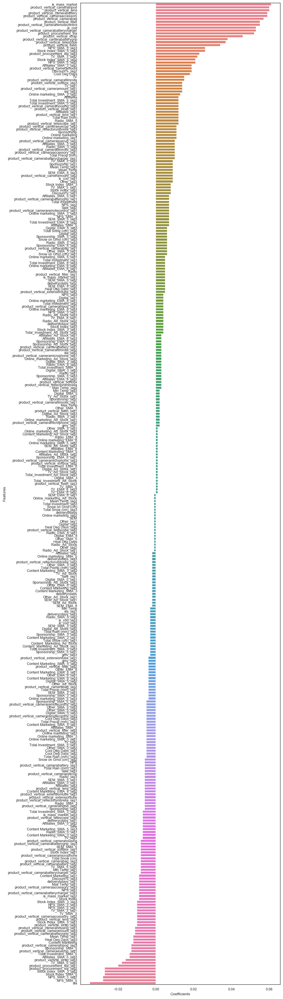

In [389]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for cameraaccessory are:

|Features|Coefficients|
|--------|------------|
|is_mass_market	|0.061|
|product_vertical_lens	|0.060|
|product_vertical_cameraaccessory	|0.060|
|product_vertical_camerabattery	|0.059|
|product_vertical_cameratripod	|0.059|

## Building Linear Regression model for `gamingaccessory`

In [390]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

gamingaccessory_dlmul_model = LinearRegression().fit(X_gamingaccessory_dlmul_train, y_gamingaccessory_dlmul_train)
y_gamingaccessory_dlmul_test_pred = gamingaccessory_dlmul_model.predict(X_gamingaccessory_dlmul_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dlmul_test, y_gamingaccessory_dlmul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dlmul_test, y_gamingaccessory_dlmul_test_pred)))

R2 Score: 0.932479878062391
Mean Squared Error: 0.1061062501903859


##### With Simple Linear Regression, we get a r2 score of 0.93 and mse score of 0.11

## Building Linear Regression model for `gamingaccessory` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [391]:
y_gamingaccessory_dlmul = gamingaccessory_dlmul_df.pop('gmv')
X_gamingaccessory_dlmul = gamingaccessory_dlmul_df

In [392]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

gamingaccessory_dlmul_model_cv = LinearRegression().fit(X_gamingaccessory_dlmul, y_gamingaccessory_dlmul)
gamingaccessory_dlmul_predictions_cv = cross_val_predict(gamingaccessory_dlmul_model_cv, X_gamingaccessory_dlmul, \
                                                         y_gamingaccessory_dlmul, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_dlmul, gamingaccessory_dlmul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dlmul, gamingaccessory_dlmul_predictions_cv)))

Cross-Predicted Accuracy: 0.8927023033613846
Mean Squared Error: 0.10729769663861549


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.89 and mse score of 0.11

## Determining Feature Importance for `gamingaccessory` with model with cv

In [393]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


gamingaccessory_lr_model_parameters = list(gamingaccessory_dlmul_model_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_dlmul_model_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_dlmul_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.0),
 ('gmv_lag1', 0.0),
 ('gmv_lag2', -0.002),
 ('gmv_lag3', -0.001),
 ('Discount%', -0.058),
 ('Discount%_lag1', -0.006),
 ('Discount%_lag2', -0.002),
 ('Discount%_lag3', 0.001),
 ('deliverybdays', -0.006),
 ('deliverybdays_lag1', -0.002),
 ('deliverybdays_lag2', -0.0),
 ('deliverybdays_lag3', 0.016),
 ('deliverycdays', -0.004),
 ('deliverycdays_lag1', -0.003),
 ('deliverycdays_lag2', -0.001),
 ('deliverycdays_lag3', 0.019),
 ('sla', 0.024),
 ('sla_lag1', 0.043),
 ('sla_lag2', -0.053),
 ('sla_lag3', -0.005),
 ('product_procurement_sla', 0.009),
 ('product_procurement_sla_lag1', -0.005),
 ('product_procurement_sla_lag2', 0.008),
 ('product_procurement_sla_lag3', 0.014),
 ('is_cod', 0.072),
 ('is_cod_lag1', 0.005),
 ('is_cod_lag2', 0.006),
 ('is_cod_lag3', -0.0),
 ('is_mass_market', 0.082),
 ('is_mass_market_lag1', 0.004),
 ('is_mass_market_lag2', 0.002),
 ('is_mass_market_lag3', -0.006),
 ('product_vertical_gamecontrolmount', 0.0),
 ('product_vertical_gamecontrolmount_l

In [394]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
36,product_vertical_gamepad,0.088
64,product_vertical_gamingmouse,0.085
28,is_mass_market,0.082
56,product_vertical_gamingkeyboard,0.074
24,is_cod,0.072
40,product_vertical_gamingaccessorykit,0.070
84,product_vertical_tvoutcableaccessory,0.068
52,product_vertical_gamingheadset,0.067
68,product_vertical_gamingmousepad,0.062
44,product_vertical_gamingadapter,0.060


## Plotting the Features in descending order of Importance for `gamingaccessory`

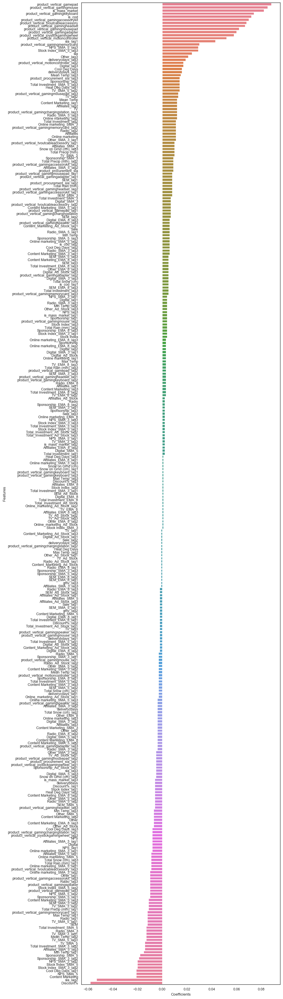

In [395]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for gamingaccessory are:

|Features|Coefficients|
|--------|------------|
|product_vertical_gamepad|	0.088|
|product_vertical_gamingmouse|	0.085|
|is_mass_market	|0.082|
|product_vertical_gamingkeyboard	|0.074|
|is_cod	|0.072|

## Building Linear Regression model for `homeaudio`

In [396]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

homeaudio_dlmul_model = LinearRegression().fit(X_homeaudio_dlmul_train, y_homeaudio_dlmul_train)
y_homeaudio_dlmul_test_pred = homeaudio_dlmul_model.predict(X_homeaudio_dlmul_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dlmul_test, y_homeaudio_dlmul_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dlmul_test, y_homeaudio_dlmul_test_pred)))

R2 Score: -0.23219005997352382
Mean Squared Error: 0.25784479448614583


##### With Simple Linear Regression, we get a r2 score of -0.23 and mse of 0.26

*Here R2 is negative which signifies that the chosen model does not follow the trend of the data, so fits worse than a horizontal line. It simply means the chosen model (with its constraints) fits the data really poorly.*

## Building Linear Regression model for `homeaudio` using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [397]:
y_homeaudio_dlmul = homeaudio_dlmul_df.pop('gmv')
X_homeaudio_dlmul = homeaudio_dlmul_df

In [398]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

homeaudio_model_dlmul_cv = LinearRegression().fit(X_homeaudio_dlmul, y_homeaudio_dlmul)
homeaudio_dlmul_predictions_cv = cross_val_predict(homeaudio_model_dlmul_cv, X_homeaudio_dlmul, y_homeaudio_dlmul, cv=5)
accuracy = metrics.r2_score(y_homeaudio_dlmul, homeaudio_dlmul_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dlmul, homeaudio_dlmul_predictions_cv)))

Cross-Predicted Accuracy: 0.5719690940056721
Mean Squared Error: 0.42803090599432797


##### With Simple Linear Regression, using cross validation, we get r2 score of 0.57 and mse score of 0.43

## Determining Feature Importance for `homeaudio` with model with cv

In [399]:
# linear regression model parameters
#Limiting floats output to 3 decimal points
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 
pd.set_option('display.precision',1)


homeaudio_lr_model_parameters = list(homeaudio_model_dlmul_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model_dlmul_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_dlmul_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', -0.0),
 ('gmv_lag1', -0.005),
 ('gmv_lag2', 0.001),
 ('gmv_lag3', -0.002),
 ('Discount%', 0.101),
 ('Discount%_lag1', 0.001),
 ('Discount%_lag2', -0.002),
 ('Discount%_lag3', 0.003),
 ('deliverybdays', -0.002),
 ('deliverybdays_lag1', 0.017),
 ('deliverybdays_lag2', -0.006),
 ('deliverybdays_lag3', -0.008),
 ('deliverycdays', -0.001),
 ('deliverycdays_lag1', 0.016),
 ('deliverycdays_lag2', -0.006),
 ('deliverycdays_lag3', -0.009),
 ('sla', -0.05),
 ('sla_lag1', 0.008),
 ('sla_lag2', 0.002),
 ('sla_lag3', -0.005),
 ('product_procurement_sla', 0.039),
 ('product_procurement_sla_lag1', 0.014),
 ('product_procurement_sla_lag2', -0.012),
 ('product_procurement_sla_lag3', 0.012),
 ('is_cod', 0.112),
 ('is_cod_lag1', -0.011),
 ('is_cod_lag2', 0.006),
 ('is_cod_lag3', -0.003),
 ('is_mass_market', 0.133),
 ('is_mass_market_lag1', -0.016),
 ('is_mass_market_lag2', 0.002),
 ('is_mass_market_lag3', -0.005),
 ('product_vertical_djcontroller', 0.036),
 ('product_vertical_djcontroller_l

In [400]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
52,product_vertical_homeaudiospeaker,0.136
28,is_mass_market,0.133
44,product_vertical_fmradio,0.122
24,is_cod,0.112
68,product_vertical_voicerecorder,0.104
4,Discount%,0.101
48,product_vertical_hifisystem,0.095
36,product_vertical_dock,0.060
20,product_procurement_sla,0.039
41,product_vertical_dockingstation_lag1,0.037


## Plotting the Features in descending order of Importance for `homeaudio`

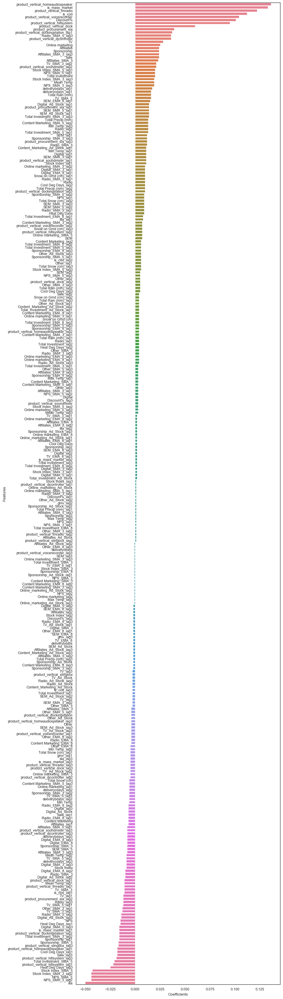

In [401]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 35), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

##### The 5 most important features affecting GMV(Revenue) for homeaudio are:

|Features|Coefficients|
|--------|------------|
|product_vertical_homeaudiospeaker|	0.136|
|is_mass_market|	0.133|
|product_vertical_fmradio|	0.122|
|is_cod	|0.112|
|product_vertical_voicerecorder	|0.104|

# Model Dashboard

|Product Sub-category|Linear Regression Model|Cross Validation|R-square on Test Dataset|Mean Square Error|
|--------------------|-----------------------|----------------|------------------------|-----------------|
|<font color = RED>__cameraaccessory__</font>|Additive|No|0.83|0.17|
|||Yes|-0.8|1.08|
||__Multiplicative__|No|0.84|0.36|
|||<font color = blue>__Yes__<font color = blue>|<font color = blue>__0.91__<font color = blue>|<font color = blue>__0.09__<font color = blue>|
||Koyck|No|0.84|0.16|
|||Yes|0.27|0.73|
||Distributive Lag Model (Additive)|No|0.87|0.12|
|||Yes|0.82|0.17|
||Distributive Lag Model (Multiplicaitive)|No|0.77|0.50|
|||Yes|0.82|0.18|
|<font color = RED>__gamingaccessory__</font>|Additive|No|0.93|0.05|
|||Yes|0.51|0.49|
||__Multiplicative__|No|0.94|0.09|
|||<font color = blue>__Yes__<font color = blue>|<font color = blue>__0.94__<font color = blue>|<font color = blue>__0.06__<font color = blue>|
||Koyck|No|0.93|0.05|
|||Yes|0.49|0.51|
||Distributive Lag Model (Additive)|No|0.87|0.10|
|||Yes|0.92|0.08|
||Distributive Lag Model (Multiplicaitive)|No|0.93|0.11|
|||Yes|0.89|0.11|
|<font color = RED>__homeaudio__</font>|Additive|No|0.96|0.09|
|||Yes|0.73|0.27|
||__Multiplicative__|No|-0.63|0.34|
|||<font color = blue>__Yes__<font color = blue>|<font color = blue>__0.86__<font color = blue>|<font color = blue>__0.14__<font color = blue>|
||Koyck|No|0.96|0.09|
|||Yes|0.70|0.30|
||Distributive Lag Model (Additive)|No|0.42|1.39|
|||Yes|0.55|0.45|
||Distributive Lag Model (Multiplicaitive)|No|-0.23|0.26|
|||Yes|0.57|0.43|

# Model Selection

##### The criteria of choosing the model is based on the accuracy parameters -- `R2 score & MSE score` -- and the business relevance of the `important attributes` chosen by the model. Also we tried to choose models with cross validation because even though the ones without, sometimes gives us good scores, they are not very dependable & generalisable, owing to limited dataset.

*By referring the above model dashboard, we finalize the following models for the 3 mentioned product subcategories - __Camera Accessory, Gaming Accessory & Home Audio:__*




|Product Sub-category|Linear Regression Model|R-square on Test Dataset|Mean Square Error|Top 5 KPIs|
|--------------------|-----------------------|------------------------|-----------------|----------|
|<font color = RED>__cameraaccessory__</font>|__Multiplicative with CV__|0.91|0.09|product_vertical_lens (<font color = blue>__0.181__)</font>|
|||||product_vertical_camerabattery (<font color = blue>__0.160__)</font>|
|||||is_mass_market (<font color = blue>__0.149__)</font>|
|||||product_vertical_camerabatterycharger (<font color = blue>__0.121__)</font>|
|||||TV (<font color = blue>__0.105__)</font>|
|<font color = RED>__gamingaccessory__</font>|__Multiplicative with CV__|0.94|0.06|product_vertical_gamingheadset (<font color = blue>__0.250__)</font>|
|||||is_mass_market (<font color = blue>__0.234__)</font>|
|||||product_vertical_gamingmouse (<font color = blue>__0.224__)</font>|
|||||product_vertical_gamepad (<font color = blue>__0.211__)</font>|
|||||Online marketing_SMA_3 (<font color = blue>__0.157__)</font>|
|<font color = RED>__cameraaccessory__</font>|__Multiplicative with CV__|0.86|0.14|product_vertical_homeaudiospeaker (<font color = blue>__0.469__)</font>|
|||||is_mass_market (<font color = blue>__0.289__)</font>|
|||||product_vertical_fmradio (<font color = blue>__0.224__)</font>|
|||||Radio_Ad_Stock (<font color = blue>__0.147__)</font>|
|||||Sponsorship (<font color = blue>__0.121__)</font>|

*We have notice that all the 3 chosen models of the 3 sub-categories are Multiplicative models. 
This fact tells us that there exists some interaction between the KPIs. __These models tell us about the growth of revenue vs the interactive growth of the KPIs.__*

# Model Evaluation

## Now We will be evaluating the Final Models:

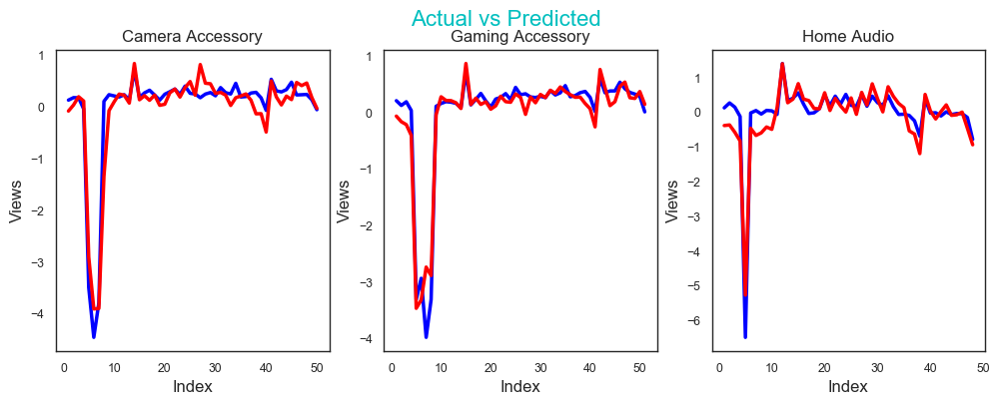

In [402]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
c = [i for i in range(1,51,1)]
plt.plot(c,y_cameraaccessory_mul, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c,cameraaccessory_mul_predictions_cv, color="red",  linewidth=2.5, linestyle="-")
plt.suptitle('Actual vs Predicted', fontsize=16, color = 'c')              # Plot heading 
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                               # X-label
plt.ylabel('Views', fontsize=12)                               # Y-label

# subplot 2
plt.subplot(1, 3, 2)
c = [i for i in range(1,52,1)]
plt.plot(c,y_gamingaccessory_mul, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c,gamingaccessory_mul_predictions_cv, color="red",  linewidth=2.5, linestyle="-")
plt.title('Gaming Accessory', fontsize=12)
plt.xlabel('Index', fontsize=12)                               # X-label
plt.ylabel('Views', fontsize=12)                               # Y-label

# subplot 3
plt.subplot(1, 3, 3)
c = [i for i in range(1,49,1)]
plt.plot(c,y_homeaudio_mul, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c,homeaudio_mul_predictions_cv, color="red",  linewidth=2.5, linestyle="-")
plt.title('Home Audio', fontsize=12)
plt.xlabel('Index', fontsize=12)                               # X-label
plt.ylabel('Views', fontsize=12)                               # Y-label

# display the plot
plt.show()

#### Plotting the actual and predicted price values from the dataset to check the likeness

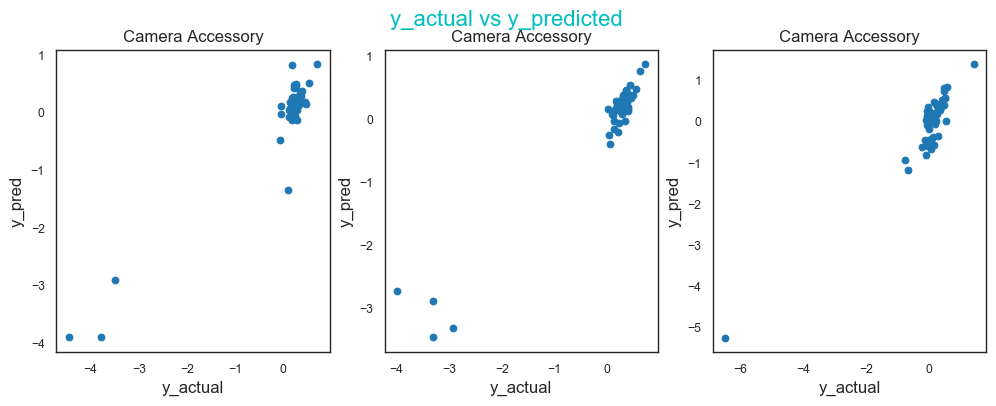

In [403]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Plotting y_test and y_pred to understand the spread.
plt.scatter(y_cameraaccessory_mul,cameraaccessory_mul_predictions_cv)
plt.suptitle('y_actual vs y_predicted', fontsize=16, color = 'c')              # Plot heading 
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# subplot 2
plt.subplot(1, 3, 2)
# Plotting y_test and y_pred to understand the spread.
plt.scatter(y_gamingaccessory_mul,gamingaccessory_mul_predictions_cv)
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# subplot 3
plt.subplot(1, 3, 3)
# Plotting y_test and y_pred to understand the spread.
plt.scatter(y_homeaudio_mul,homeaudio_mul_predictions_cv)
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# display the plot
plt.show()

#### Drawing a scatter plot with actual and predicted price values from the dataset to check the spread

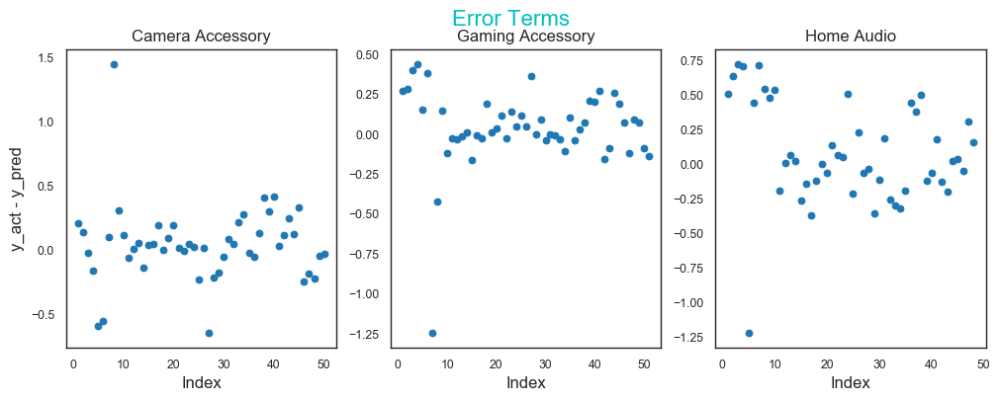

In [404]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Error terms
c = [i for i in range(1,51,1)]
plt.scatter(c,y_cameraaccessory_mul - cameraaccessory_mul_predictions_cv)
plt.suptitle('Error Terms', fontsize=16, color = 'c')              # Plot heading
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                      # X-label
plt.ylabel('y_act - y_pred', fontsize=12)                # Y-label

# subplot 2
plt.subplot(1, 3, 2)
# Error terms
c = [i for i in range(1,52,1)]
plt.scatter(c,y_gamingaccessory_mul - gamingaccessory_mul_predictions_cv)
plt.title('Gaming Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                      # X-label

# subplot 3
plt.subplot(1, 3, 3)
# Error terms
c = [i for i in range(1,49,1)]
plt.scatter(c,y_homeaudio_mul - homeaudio_mul_predictions_cv)
plt.title('Home Audio', fontsize=12)              # Plot heading 
plt.xlabel('Index', fontsize=12)                      # X-label

# display the plot
plt.show()

#### Drawing a scatter plot of the error terms to check the spread to ensure that the error terms have constant variance (homoscedasticity). The variance doesn't increase (or decrease) or follow a pattern as the error values change.

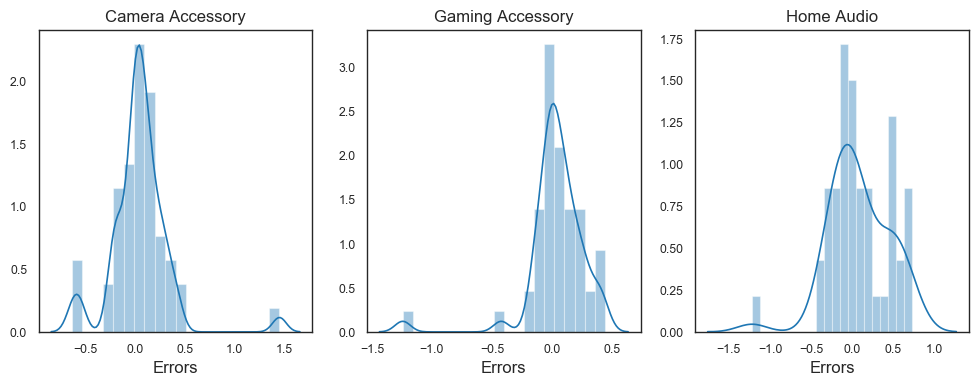

In [405]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Plot the histogram of the error terms
sns.distplot((y_cameraaccessory_mul-cameraaccessory_mul_predictions_cv), bins = 20)
fig.suptitle('Error Terms', fontsize = 16)                  # Plot heading 
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Errors', fontsize = 12)                         # X-label


# subplot 2
plt.subplot(1, 3, 2)
# Plot the histogram of the error terms
sns.distplot((y_gamingaccessory_mul-gamingaccessory_mul_predictions_cv), bins = 20)
plt.title('Gaming Accessory', fontsize=12)              # Plot heading 
plt.xlabel('Errors', fontsize = 12)                         # X-label

# subplot 3
plt.subplot(1, 3, 3)
# Plot the histogram of the error terms
sns.distplot((y_homeaudio_mul-homeaudio_mul_predictions_cv), bins = 20)
plt.title('Home Audio', fontsize=12)              # Plot heading 
plt.xlabel('Errors', fontsize = 12)                         # X-label

# display the plot
plt.show()

#### Plotting the distribution of the error terms. The error terms follow a normal distrbution with mean at 0 barring a few outlier values.

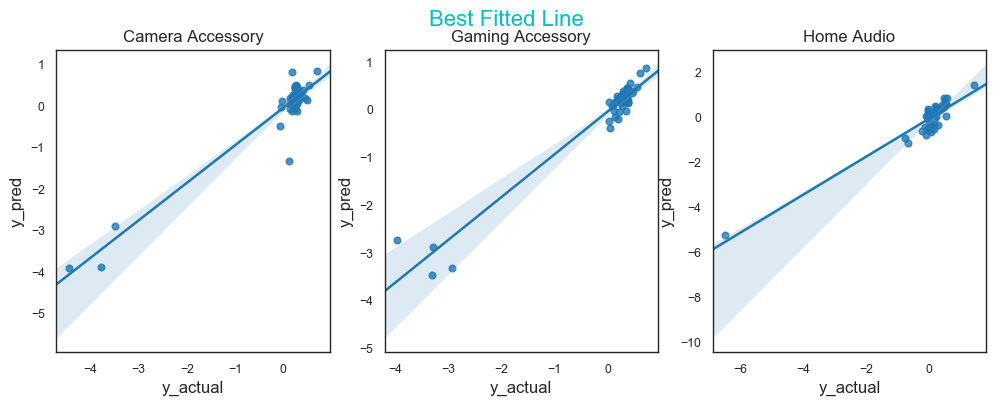

In [406]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 3, 1)
# Plot the histogram of the error terms
sns.regplot(y_cameraaccessory_mul, cameraaccessory_mul_predictions_cv)
plt.suptitle('Best Fitted Line', fontsize=16, color = 'c')              # Plot heading  
plt.title('Camera Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label


# subplot 2
plt.subplot(1, 3, 2)
# Plot the histogram of the error terms
sns.regplot(y_gamingaccessory_mul, gamingaccessory_mul_predictions_cv)
plt.title('Gaming Accessory', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# subplot 3
plt.subplot(1, 3, 3)
# Plot the histogram of the error terms
sns.regplot(y_homeaudio_mul, homeaudio_mul_predictions_cv)
plt.title('Home Audio', fontsize=12)              # Plot heading 
plt.xlabel('y_actual', fontsize=12)                          # X-label
plt.ylabel('y_pred', fontsize=12)                          # Y-label

# display the plot
plt.show()

#### Plotting a scatter plot with actual and predicted price values from the dataset to check the spread and drawing the best fitted line through it.

## Model Equation

### Considering the top 5 KPIs from the models for our 3 product subcategories, we can see that the equation of our best fitted lines as follows:


##### <font color = blue>Camera Accessory:</font>
__Revenue__ =  <font color = red>0.0 + (0.181 × __product_vertical_lens__) + (0.160 × __product_vertical_camerabattery__) + (0.149 × __is_mass_market__) + (0.121 × __product_vertical_camerabatterycharger__) + (0.105 × __TV__)</font>

##### <font color = blue>__Gaming Accessory:__</font>
__Revenue__ =  <font color = red>0.0 + (0.250 × __product_vertical_gamingheadset__) + (0.234 × __is_mass_market__) + (0.224 × __product_vertical_gamingmouse__) + (0.211 × __product_vertical_gamepad__) + (0.157 × __Online marketing_SMA_3__)</font>

##### <font color = blue>__Home Audio:__</font>
__Revenue__ =  <font color = red>0.0 + (0.469 × __product_vertical_homeaudiospeaker__) + (0.289 × __is_mass_market__) + (0.224 × __product_vertical_fmradio__) + (0.147 × __Radio_Ad_Stock__) + (0.121 × __Sponsorship__)</font>


##### This equation implies how much the `Revenue` will grow with a unit growth in any of these independent KPIs with all other KPIs held constant.

# Recommendation

In [407]:
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.head().append(cameraaccessory_mul_lr_coef_df.tail())
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.head().append(gamingaccessory_mul_lr_coef_df.tail())
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.head().append(homeaudio_mul_lr_coef_df.tail())
gamingaccessory_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_gamingheadset,0.250
7,is_mass_market,0.234
16,product_vertical_gamingmouse,0.224
9,product_vertical_gamepad,0.211
50,Online marketing_SMA_3,0.157
67,Radio_EMA_8,-0.084
72,Other_EMA_8,-0.084
1,Discount%,-0.088
42,Sponsorship_EMA_8,-0.090
15,product_vertical_gamingmemorycard,-0.127


#### Plotting the Top 5 features that affect Each of the 3 Product Sub-categories(both positively and adversely) as per our Chosen Models

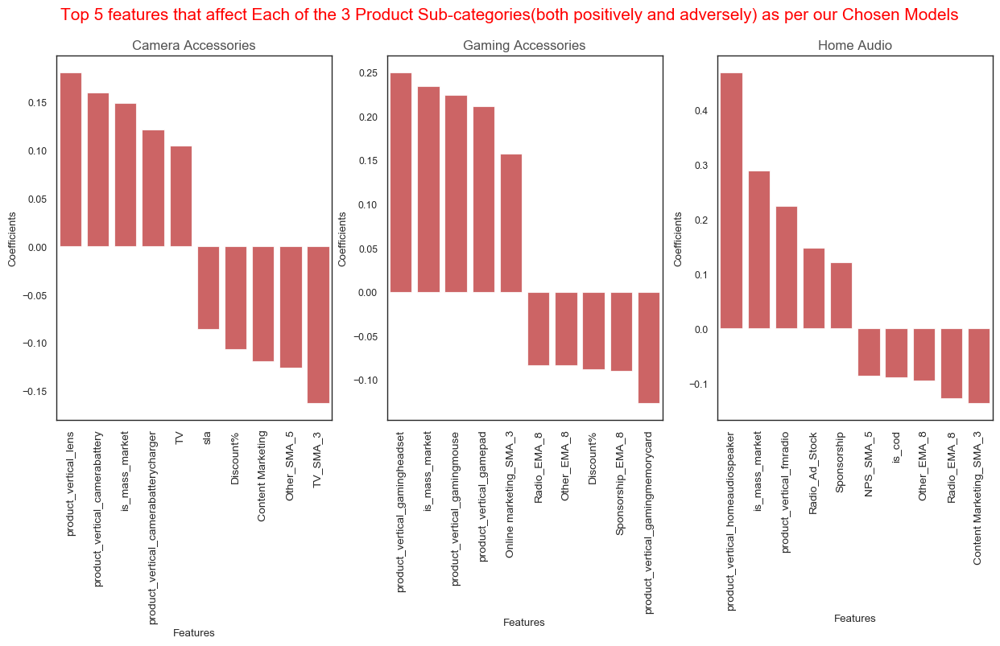

In [408]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(15,6), dpi=100, facecolor='w', edgecolor='k', frameon='True')

# subplot 1
plt.subplot(1, 3, 1)
sns.barplot(x='Features', y='Coefficients', color = 'tab:red',alpha=0.8, data=cameraaccessory_mul_lr_coef_df, estimator=np.sum)
plt.title('Camera Accessories', fontsize=12, alpha=0.8)
plt.xticks(rotation='vertical', fontsize=10)

# subplot 1
plt.subplot(1, 3, 2)
sns.barplot(x='Features', y='Coefficients', color = 'tab:red',alpha=0.8, data=gamingaccessory_mul_lr_coef_df, estimator=np.sum)
plt.title('Gaming Accessories', fontsize=12,  alpha=0.8)
plt.xticks(rotation='vertical', fontsize=10)

# subplot 1
plt.subplot(1, 3, 3)
sns.barplot(x='Features', y='Coefficients', color = 'tab:red',alpha=0.8, data=homeaudio_mul_lr_coef_df, estimator=np.sum)
plt.title('Home Audio', fontsize=12,  alpha=0.8)
plt.suptitle('Top 5 features that affect Each of the 3 Product Sub-categories(both positively and adversely) \
as per our Chosen Models', fontsize=15, color = 'r', alpha=1)
plt.xticks(rotation='vertical', fontsize=10)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
#plt.tight_layout()

# display the plot
plt.show()

# Recommendations 

### <font color = blue>Camera Accessory:</font>
 - Product of `Mass-market` are better contributors for the increased revenue of comparison to the Luxury products.
 - Higher percentage of `Discounts` in general given for this sub category works adversely towards bringing down the revenue. 
 - Company has to promote `Camera Batteries` , `Lens`  & `Camera Battery Chargers` as they have received the highest revenue.
 - Spends on `TV` Advertisement has a positive impact on revenue. So 1 unit of TV spend can boost the revenue by 0.105 units.     - spends on `Content Marketing` the other hand impacts negatively.
 
### <font color = blue>__Gaming Accessory:__</font>
 - Company has to promote `Gaming Headset`, `Gaming Mouse` & `Gamepad` as they are generating the highest revenue. On the contrary, `Gaming Memory Cards` results in loss.
 - Advertisement spends on `Online Marketing, Radio & Others` have a positive cumulative impact on revenue. `Sponsorship` spends on the other hand has a negative cumulative effect.
 - `Mass-market` products are better contributors to the increased revenue in comparison to the Luxury products.
 - Higher percentage of `Discounts` in general given for this sub category works adversely towards bringing down the revenue. 

### <font color = blue>__Home Audio:__</font>
 - Company should promote `Home Audio Speakers` & `FM Radios as they fetch the highest revenue.
 - `Mass-market` products are better contributors to the increased revenue in comparison to the Luxury products.
 - `Radio Adstock` (carry over effect of Radio Advertisement) spends  helps to boost the revenue to a significant extent.
 - Advertisement spends on `Sponsorship` has a positive impact on revenue. `Content Marketing` spends on the other hand impacts negatively.
 - `COD payments` in general for this sub category are bad in bringing down the revenue. 
 
### <font color = blue>__In General:__</font> 
 - So, Most of the sales has taken a place when the Discount% is between (50-60%). However, that is not necessarily helping to increase the revenue. EDA has shows that an average discount% between (10-20%) is the most profitable for the company specially among luxury items.
 - Basically most of the Home Audio items sold are luxury items and hence, the customers preferring to use Cash on Delivery instead of paying upfront payment.
 - During festive time(eg. Thanksgiving) more investment has made on Advertisement and good promotional offers were rolled out. This is usually boosting the revenue of the company. However just providing discounts without any planned adertisement some media channels dosen't haelp.And We have seen that for the weeks of 32 - 35(August), company has generated the revenue was the lowest from all 3 product subcategories even though median discount% was raised after the initial drought. In fact, this dip of the revenue can be control as the direct relation to minimum amount of total investment in Ads during the given timeframe.